# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 400
dtc_w2 = 40

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: ylp2atd8
Name: whole-sun-613
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/ylp2atd8
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_085940-ylp2atd8/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-cb803dfd-e55e-5db3-aff0-97da82421dd7]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 214,384,452,187,387,309,537,135,466,380,434,362,246,291,49,214,442,289,287,517,242,266,147,54,319,150,112,300,101,85,184,187,50,323,229,158,271,140,90,196,387,452,335,973,140,380,177,190,277,312,229,150,374,261,259,384,288,629,316,286,235,588,243,139,254,331,279,720,363,364,262,372,371,359,134,229,226,150,57,124,191,503,313,275,342,223,152,248,378,178,144,111,258,401,158,155,431,74,153,295,179,372,107,244,188,218,323,133,155,289,281,113,111,359,331,356,263,45,45,210,218,259,75,215,320,255,191,254,292,213,950,270,193,508,313,158,493,345,513,463,198,470,460,263,369,247,356,237,296,298,266,245,267,409,401,255,229,188,164,605,247,242,146,149,177,160,522,253,388,220,272,407,611,425,298,252,231,237,165,173,214,189,201,238,610,349,332,357,368,7104,417,275,191,160,360,168,266,266,157,3

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 62,97,106,45,108,70,150,40,116,83,99,102,55,67,10,50,120,76,61,146,64,69,41,10,91,34,22,64,25,22,46,58,14,89,57,53,60,40,24,41,81,114,80,246,39,95,38,51,78,86,56,28,96,67,70,94,99,158,66,80,55,143,54,44,68,94,75,185,78,81,62,87,80,86,25,55,51,41,14,27,56,127,69,70,84,49,40,47,101,38,31,19,71,93,34,45,121,22,40,73,36,91,19,59,49,56,87,34,28,79,68,27,30,86,96,88,64,9,14,56,60,70,21,39,75,56,46,44,69,50,247,67,48,139,62,34,130,87,113,118,63,101,119,75,82,53,88,65,67,68,73,57,52,91,96,58,69,49,28,165,63,51,30,37,38,42,145,62,92,49,73,105,139,88,74,70,53,54,53,49,50,47,54,67,153,85,80,89,95,1803,113,74,54,51,86,49,65,66,43,77,37,78,71,75,77,129,65,68,96,27,15,47,60,77,20,62,56,86,50,47,74,68,50,69,62,57,64,78,52,60,69,89,61,69,12,46,48,129,149,122,87,73,64,67,193,125,31,58,69,48,2

Epoch 1/1000:   0%|          | 1/1000 [00:22<6:15:12, 22.54s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:22<6:15:12, 22.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=92.6]

Epoch 2/1000:   0%|          | 1/1000 [00:22<6:15:12, 22.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=92.6]

Epoch 2/1000:   0%|          | 2/1000 [00:30<3:48:32, 13.74s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=92.6]

Epoch 2/1000:   0%|          | 2/1000 [00:30<3:48:32, 13.74s/it, v_num=d8_1, total_loss_train=1.31e+3, kl_local_train=52.9]

Epoch 3/1000:   0%|          | 2/1000 [00:30<3:48:32, 13.74s/it, v_num=d8_1, total_loss_train=1.31e+3, kl_local_train=52.9]

Epoch 3/1000:   0%|          | 3/1000 [00:37<3:01:32, 10.93s/it, v_num=d8_1, total_loss_train=1.31e+3, kl_local_train=52.9]

Epoch 3/1000:   0%|          | 3/1000 [00:37<3:01:32, 10.93s/it, v_num=d8_1, total_loss_train=1.3e+3, kl_local_train=5.69] 

Epoch 4/1000:   0%|          | 3/1000 [00:37<3:01:32, 10.93s/it, v_num=d8_1, total_loss_train=1.3e+3, kl_local_train=5.69]

Epoch 4/1000:   0%|          | 4/1000 [00:45<2:40:10,  9.65s/it, v_num=d8_1, total_loss_train=1.3e+3, kl_local_train=5.69]

Epoch 4/1000:   0%|          | 4/1000 [00:45<2:40:10,  9.65s/it, v_num=d8_1, total_loss_train=1.29e+3, kl_local_train=4.17]

Epoch 5/1000:   0%|          | 4/1000 [00:45<2:40:10,  9.65s/it, v_num=d8_1, total_loss_train=1.29e+3, kl_local_train=4.17]

Epoch 5/1000:   0%|          | 5/1000 [00:52<2:27:26,  8.89s/it, v_num=d8_1, total_loss_train=1.29e+3, kl_local_train=4.17]

Epoch 5/1000:   0%|          | 5/1000 [00:52<2:27:26,  8.89s/it, v_num=d8_1, total_loss_train=1.27e+3, kl_local_train=33.8]

Epoch 6/1000:   0%|          | 5/1000 [00:52<2:27:26,  8.89s/it, v_num=d8_1, total_loss_train=1.27e+3, kl_local_train=33.8]

Epoch 6/1000:   1%|          | 6/1000 [01:00<2:19:55,  8.45s/it, v_num=d8_1, total_loss_train=1.27e+3, kl_local_train=33.8]

Epoch 6/1000:   1%|          | 6/1000 [01:00<2:19:55,  8.45s/it, v_num=d8_1, total_loss_train=1.25e+3, kl_local_train=27.9]

Epoch 7/1000:   1%|          | 6/1000 [01:00<2:19:55,  8.45s/it, v_num=d8_1, total_loss_train=1.25e+3, kl_local_train=27.9]

Epoch 7/1000:   1%|          | 7/1000 [01:08<2:14:54,  8.15s/it, v_num=d8_1, total_loss_train=1.25e+3, kl_local_train=27.9]

Epoch 7/1000:   1%|          | 7/1000 [01:08<2:14:54,  8.15s/it, v_num=d8_1, total_loss_train=1.24e+3, kl_local_train=29.3]

Epoch 8/1000:   1%|          | 7/1000 [01:08<2:14:54,  8.15s/it, v_num=d8_1, total_loss_train=1.24e+3, kl_local_train=29.3]

Epoch 8/1000:   1%|          | 8/1000 [01:15<2:12:12,  8.00s/it, v_num=d8_1, total_loss_train=1.24e+3, kl_local_train=29.3]

Epoch 8/1000:   1%|          | 8/1000 [01:15<2:12:12,  8.00s/it, v_num=d8_1, total_loss_train=1.22e+3, kl_local_train=34.8]

Epoch 9/1000:   1%|          | 8/1000 [01:15<2:12:12,  8.00s/it, v_num=d8_1, total_loss_train=1.22e+3, kl_local_train=34.8]

Epoch 9/1000:   1%|          | 9/1000 [01:23<2:09:53,  7.86s/it, v_num=d8_1, total_loss_train=1.22e+3, kl_local_train=34.8]

Epoch 9/1000:   1%|          | 9/1000 [01:23<2:09:53,  7.86s/it, v_num=d8_1, total_loss_train=1.21e+3, kl_local_train=33.8]

Epoch 10/1000:   1%|          | 9/1000 [01:23<2:09:53,  7.86s/it, v_num=d8_1, total_loss_train=1.21e+3, kl_local_train=33.8]

Epoch 10/1000:   1%|          | 10/1000 [01:30<2:08:12,  7.77s/it, v_num=d8_1, total_loss_train=1.21e+3, kl_local_train=33.8]

Epoch 10/1000:   1%|          | 10/1000 [01:30<2:08:12,  7.77s/it, v_num=d8_1, total_loss_train=1.21e+3, kl_local_train=32.8]

Epoch 11/1000:   1%|          | 10/1000 [01:30<2:08:12,  7.77s/it, v_num=d8_1, total_loss_train=1.21e+3, kl_local_train=32.8]

Epoch 11/1000:   1%|          | 11/1000 [01:38<2:07:06,  7.71s/it, v_num=d8_1, total_loss_train=1.21e+3, kl_local_train=32.8]

Epoch 11/1000:   1%|          | 11/1000 [01:38<2:07:06,  7.71s/it, v_num=d8_1, total_loss_train=1.2e+3, kl_local_train=34]   

Epoch 12/1000:   1%|          | 11/1000 [01:38<2:07:06,  7.71s/it, v_num=d8_1, total_loss_train=1.2e+3, kl_local_train=34]

Epoch 12/1000:   1%|          | 12/1000 [01:46<2:07:09,  7.72s/it, v_num=d8_1, total_loss_train=1.2e+3, kl_local_train=34]

Epoch 12/1000:   1%|          | 12/1000 [01:46<2:07:09,  7.72s/it, v_num=d8_1, total_loss_train=1.19e+3, kl_local_train=34.9]

Epoch 13/1000:   1%|          | 12/1000 [01:46<2:07:09,  7.72s/it, v_num=d8_1, total_loss_train=1.19e+3, kl_local_train=34.9]

Epoch 13/1000:   1%|▏         | 13/1000 [01:53<2:06:07,  7.67s/it, v_num=d8_1, total_loss_train=1.19e+3, kl_local_train=34.9]

Epoch 13/1000:   1%|▏         | 13/1000 [01:53<2:06:07,  7.67s/it, v_num=d8_1, total_loss_train=1.18e+3, kl_local_train=34.5]

Epoch 14/1000:   1%|▏         | 13/1000 [01:53<2:06:07,  7.67s/it, v_num=d8_1, total_loss_train=1.18e+3, kl_local_train=34.5]

Epoch 14/1000:   1%|▏         | 14/1000 [02:01<2:05:28,  7.64s/it, v_num=d8_1, total_loss_train=1.18e+3, kl_local_train=34.5]

Epoch 14/1000:   1%|▏         | 14/1000 [02:01<2:05:28,  7.64s/it, v_num=d8_1, total_loss_train=1.19e+3, kl_local_train=36.6]

Epoch 15/1000:   1%|▏         | 14/1000 [02:01<2:05:28,  7.64s/it, v_num=d8_1, total_loss_train=1.19e+3, kl_local_train=36.6]

Epoch 15/1000:   2%|▏         | 15/1000 [02:08<2:04:52,  7.61s/it, v_num=d8_1, total_loss_train=1.19e+3, kl_local_train=36.6]

Epoch 15/1000:   2%|▏         | 15/1000 [02:08<2:04:52,  7.61s/it, v_num=d8_1, total_loss_train=1.2e+3, kl_local_train=44.1] 

Epoch 16/1000:   2%|▏         | 15/1000 [02:08<2:04:52,  7.61s/it, v_num=d8_1, total_loss_train=1.2e+3, kl_local_train=44.1]

Epoch 16/1000:   2%|▏         | 16/1000 [02:16<2:05:01,  7.62s/it, v_num=d8_1, total_loss_train=1.2e+3, kl_local_train=44.1]

Epoch 16/1000:   2%|▏         | 16/1000 [02:16<2:05:01,  7.62s/it, v_num=d8_1, total_loss_train=1.2e+3, kl_local_train=47.8]

Epoch 17/1000:   2%|▏         | 16/1000 [02:16<2:05:01,  7.62s/it, v_num=d8_1, total_loss_train=1.2e+3, kl_local_train=47.8]

Epoch 17/1000:   2%|▏         | 17/1000 [02:24<2:04:31,  7.60s/it, v_num=d8_1, total_loss_train=1.2e+3, kl_local_train=47.8]

Epoch 17/1000:   2%|▏         | 17/1000 [02:24<2:04:31,  7.60s/it, v_num=d8_1, total_loss_train=1.21e+3, kl_local_train=52.9]

Epoch 18/1000:   2%|▏         | 17/1000 [02:24<2:04:31,  7.60s/it, v_num=d8_1, total_loss_train=1.21e+3, kl_local_train=52.9]

Epoch 18/1000:   2%|▏         | 18/1000 [02:31<2:04:22,  7.60s/it, v_num=d8_1, total_loss_train=1.21e+3, kl_local_train=52.9]

Epoch 18/1000:   2%|▏         | 18/1000 [02:31<2:04:22,  7.60s/it, v_num=d8_1, total_loss_train=1.22e+3, kl_local_train=57.5]

Epoch 19/1000:   2%|▏         | 18/1000 [02:31<2:04:22,  7.60s/it, v_num=d8_1, total_loss_train=1.22e+3, kl_local_train=57.5]

Epoch 19/1000:   2%|▏         | 19/1000 [02:39<2:03:50,  7.57s/it, v_num=d8_1, total_loss_train=1.22e+3, kl_local_train=57.5]

Epoch 19/1000:   2%|▏         | 19/1000 [02:39<2:03:50,  7.57s/it, v_num=d8_1, total_loss_train=1.22e+3, kl_local_train=59]  

Epoch 20/1000:   2%|▏         | 19/1000 [02:39<2:03:50,  7.57s/it, v_num=d8_1, total_loss_train=1.22e+3, kl_local_train=59]

Epoch 20/1000:   2%|▏         | 20/1000 [02:46<2:04:10,  7.60s/it, v_num=d8_1, total_loss_train=1.22e+3, kl_local_train=59]

Epoch 20/1000:   2%|▏         | 20/1000 [02:46<2:04:10,  7.60s/it, v_num=d8_1, total_loss_train=1.23e+3, kl_local_train=63.9]

Epoch 21/1000:   2%|▏         | 20/1000 [02:46<2:04:10,  7.60s/it, v_num=d8_1, total_loss_train=1.23e+3, kl_local_train=63.9]

Epoch 21/1000:   2%|▏         | 21/1000 [02:54<2:03:50,  7.59s/it, v_num=d8_1, total_loss_train=1.23e+3, kl_local_train=63.9]

Epoch 21/1000:   2%|▏         | 21/1000 [02:54<2:03:50,  7.59s/it, v_num=d8_1, total_loss_train=1.24e+3, kl_local_train=67.8]

Epoch 22/1000:   2%|▏         | 21/1000 [02:54<2:03:50,  7.59s/it, v_num=d8_1, total_loss_train=1.24e+3, kl_local_train=67.8]

Epoch 22/1000:   2%|▏         | 22/1000 [03:01<2:03:38,  7.59s/it, v_num=d8_1, total_loss_train=1.24e+3, kl_local_train=67.8]

Epoch 22/1000:   2%|▏         | 22/1000 [03:01<2:03:38,  7.59s/it, v_num=d8_1, total_loss_train=1.25e+3, kl_local_train=73.1]

Epoch 23/1000:   2%|▏         | 22/1000 [03:01<2:03:38,  7.59s/it, v_num=d8_1, total_loss_train=1.25e+3, kl_local_train=73.1]

Epoch 23/1000:   2%|▏         | 23/1000 [03:09<2:03:32,  7.59s/it, v_num=d8_1, total_loss_train=1.25e+3, kl_local_train=73.1]

Epoch 23/1000:   2%|▏         | 23/1000 [03:09<2:03:32,  7.59s/it, v_num=d8_1, total_loss_train=1.26e+3, kl_local_train=74.2]

Epoch 24/1000:   2%|▏         | 23/1000 [03:09<2:03:32,  7.59s/it, v_num=d8_1, total_loss_train=1.26e+3, kl_local_train=74.2]

Epoch 24/1000:   2%|▏         | 24/1000 [03:17<2:03:25,  7.59s/it, v_num=d8_1, total_loss_train=1.26e+3, kl_local_train=74.2]

Epoch 24/1000:   2%|▏         | 24/1000 [03:17<2:03:25,  7.59s/it, v_num=d8_1, total_loss_train=1.27e+3, kl_local_train=68.8]

Epoch 25/1000:   2%|▏         | 24/1000 [03:17<2:03:25,  7.59s/it, v_num=d8_1, total_loss_train=1.27e+3, kl_local_train=68.8]

Epoch 25/1000:   2%|▎         | 25/1000 [03:24<2:03:08,  7.58s/it, v_num=d8_1, total_loss_train=1.27e+3, kl_local_train=68.8]

Epoch 25/1000:   2%|▎         | 25/1000 [03:24<2:03:08,  7.58s/it, v_num=d8_1, total_loss_train=1.28e+3, kl_local_train=77.3]

Epoch 26/1000:   2%|▎         | 25/1000 [03:24<2:03:08,  7.58s/it, v_num=d8_1, total_loss_train=1.28e+3, kl_local_train=77.3]

Epoch 26/1000:   3%|▎         | 26/1000 [03:32<2:02:51,  7.57s/it, v_num=d8_1, total_loss_train=1.28e+3, kl_local_train=77.3]

Epoch 26/1000:   3%|▎         | 26/1000 [03:32<2:02:51,  7.57s/it, v_num=d8_1, total_loss_train=1.29e+3, kl_local_train=82.5]

Epoch 27/1000:   3%|▎         | 26/1000 [03:32<2:02:51,  7.57s/it, v_num=d8_1, total_loss_train=1.29e+3, kl_local_train=82.5]

Epoch 27/1000:   3%|▎         | 27/1000 [03:39<2:02:51,  7.58s/it, v_num=d8_1, total_loss_train=1.29e+3, kl_local_train=82.5]

Epoch 27/1000:   3%|▎         | 27/1000 [03:39<2:02:51,  7.58s/it, v_num=d8_1, total_loss_train=1.3e+3, kl_local_train=80.4] 

Epoch 28/1000:   3%|▎         | 27/1000 [03:39<2:02:51,  7.58s/it, v_num=d8_1, total_loss_train=1.3e+3, kl_local_train=80.4]

Epoch 28/1000:   3%|▎         | 28/1000 [03:47<2:02:40,  7.57s/it, v_num=d8_1, total_loss_train=1.3e+3, kl_local_train=80.4]

Epoch 28/1000:   3%|▎         | 28/1000 [03:47<2:02:40,  7.57s/it, v_num=d8_1, total_loss_train=1.3e+3, kl_local_train=82.7]

Epoch 29/1000:   3%|▎         | 28/1000 [03:47<2:02:40,  7.57s/it, v_num=d8_1, total_loss_train=1.3e+3, kl_local_train=82.7]

Epoch 29/1000:   3%|▎         | 29/1000 [03:54<2:02:38,  7.58s/it, v_num=d8_1, total_loss_train=1.3e+3, kl_local_train=82.7]

Epoch 29/1000:   3%|▎         | 29/1000 [03:54<2:02:38,  7.58s/it, v_num=d8_1, total_loss_train=1.31e+3, kl_local_train=91.2]

Epoch 30/1000:   3%|▎         | 29/1000 [03:54<2:02:38,  7.58s/it, v_num=d8_1, total_loss_train=1.31e+3, kl_local_train=91.2]

Epoch 30/1000:   3%|▎         | 30/1000 [04:02<2:02:29,  7.58s/it, v_num=d8_1, total_loss_train=1.31e+3, kl_local_train=91.2]

Epoch 30/1000:   3%|▎         | 30/1000 [04:02<2:02:29,  7.58s/it, v_num=d8_1, total_loss_train=1.32e+3, kl_local_train=88.6]

Epoch 31/1000:   3%|▎         | 30/1000 [04:02<2:02:29,  7.58s/it, v_num=d8_1, total_loss_train=1.32e+3, kl_local_train=88.6]

Epoch 31/1000:   3%|▎         | 31/1000 [04:10<2:02:34,  7.59s/it, v_num=d8_1, total_loss_train=1.32e+3, kl_local_train=88.6]

Epoch 31/1000:   3%|▎         | 31/1000 [04:10<2:02:34,  7.59s/it, v_num=d8_1, total_loss_train=1.33e+3, kl_local_train=88.3]

Epoch 32/1000:   3%|▎         | 31/1000 [04:10<2:02:34,  7.59s/it, v_num=d8_1, total_loss_train=1.33e+3, kl_local_train=88.3]

Epoch 32/1000:   3%|▎         | 32/1000 [04:17<2:02:19,  7.58s/it, v_num=d8_1, total_loss_train=1.33e+3, kl_local_train=88.3]

Epoch 32/1000:   3%|▎         | 32/1000 [04:17<2:02:19,  7.58s/it, v_num=d8_1, total_loss_train=1.34e+3, kl_local_train=94.4]

Epoch 33/1000:   3%|▎         | 32/1000 [04:17<2:02:19,  7.58s/it, v_num=d8_1, total_loss_train=1.34e+3, kl_local_train=94.4]

Epoch 33/1000:   3%|▎         | 33/1000 [04:25<2:02:14,  7.59s/it, v_num=d8_1, total_loss_train=1.34e+3, kl_local_train=94.4]

Epoch 33/1000:   3%|▎         | 33/1000 [04:25<2:02:14,  7.59s/it, v_num=d8_1, total_loss_train=1.35e+3, kl_local_train=96.3]

Epoch 34/1000:   3%|▎         | 33/1000 [04:25<2:02:14,  7.59s/it, v_num=d8_1, total_loss_train=1.35e+3, kl_local_train=96.3]

Epoch 34/1000:   3%|▎         | 34/1000 [04:32<2:02:04,  7.58s/it, v_num=d8_1, total_loss_train=1.35e+3, kl_local_train=96.3]

Epoch 34/1000:   3%|▎         | 34/1000 [04:32<2:02:04,  7.58s/it, v_num=d8_1, total_loss_train=1.36e+3, kl_local_train=94.5]

Epoch 35/1000:   3%|▎         | 34/1000 [04:32<2:02:04,  7.58s/it, v_num=d8_1, total_loss_train=1.36e+3, kl_local_train=94.5]

Epoch 35/1000:   4%|▎         | 35/1000 [04:40<2:02:54,  7.64s/it, v_num=d8_1, total_loss_train=1.36e+3, kl_local_train=94.5]

Epoch 35/1000:   4%|▎         | 35/1000 [04:40<2:02:54,  7.64s/it, v_num=d8_1, total_loss_train=1.37e+3, kl_local_train=87.6]

Epoch 36/1000:   4%|▎         | 35/1000 [04:40<2:02:54,  7.64s/it, v_num=d8_1, total_loss_train=1.37e+3, kl_local_train=87.6]

Epoch 36/1000:   4%|▎         | 36/1000 [04:48<2:02:21,  7.62s/it, v_num=d8_1, total_loss_train=1.37e+3, kl_local_train=87.6]

Epoch 36/1000:   4%|▎         | 36/1000 [04:48<2:02:21,  7.62s/it, v_num=d8_1, total_loss_train=1.38e+3, kl_local_train=96.7]

Epoch 37/1000:   4%|▎         | 36/1000 [04:48<2:02:21,  7.62s/it, v_num=d8_1, total_loss_train=1.38e+3, kl_local_train=96.7]

Epoch 37/1000:   4%|▎         | 37/1000 [04:56<2:03:53,  7.72s/it, v_num=d8_1, total_loss_train=1.38e+3, kl_local_train=96.7]

Epoch 37/1000:   4%|▎         | 37/1000 [04:56<2:03:53,  7.72s/it, v_num=d8_1, total_loss_train=1.39e+3, kl_local_train=100] 

Epoch 38/1000:   4%|▎         | 37/1000 [04:56<2:03:53,  7.72s/it, v_num=d8_1, total_loss_train=1.39e+3, kl_local_train=100]

Epoch 38/1000:   4%|▍         | 38/1000 [05:04<2:05:34,  7.83s/it, v_num=d8_1, total_loss_train=1.39e+3, kl_local_train=100]

Epoch 38/1000:   4%|▍         | 38/1000 [05:04<2:05:34,  7.83s/it, v_num=d8_1, total_loss_train=1.4e+3, kl_local_train=93.7]

Epoch 39/1000:   4%|▍         | 38/1000 [05:04<2:05:34,  7.83s/it, v_num=d8_1, total_loss_train=1.4e+3, kl_local_train=93.7]

Epoch 39/1000:   4%|▍         | 39/1000 [05:11<2:03:55,  7.74s/it, v_num=d8_1, total_loss_train=1.4e+3, kl_local_train=93.7]

Epoch 39/1000:   4%|▍         | 39/1000 [05:11<2:03:55,  7.74s/it, v_num=d8_1, total_loss_train=1.41e+3, kl_local_train=102]

Epoch 40/1000:   4%|▍         | 39/1000 [05:11<2:03:55,  7.74s/it, v_num=d8_1, total_loss_train=1.41e+3, kl_local_train=102]

Epoch 40/1000:   4%|▍         | 40/1000 [05:19<2:03:15,  7.70s/it, v_num=d8_1, total_loss_train=1.41e+3, kl_local_train=102]

Epoch 40/1000:   4%|▍         | 40/1000 [05:19<2:03:15,  7.70s/it, v_num=d8_1, total_loss_train=1.42e+3, kl_local_train=98] 

Epoch 41/1000:   4%|▍         | 40/1000 [05:19<2:03:15,  7.70s/it, v_num=d8_1, total_loss_train=1.42e+3, kl_local_train=98]

Epoch 41/1000:   4%|▍         | 41/1000 [05:26<2:02:13,  7.65s/it, v_num=d8_1, total_loss_train=1.42e+3, kl_local_train=98]

Epoch 41/1000:   4%|▍         | 41/1000 [05:26<2:02:13,  7.65s/it, v_num=d8_1, total_loss_train=1.43e+3, kl_local_train=97.7]

Epoch 42/1000:   4%|▍         | 41/1000 [05:26<2:02:13,  7.65s/it, v_num=d8_1, total_loss_train=1.43e+3, kl_local_train=97.7]

Epoch 42/1000:   4%|▍         | 42/1000 [05:34<2:01:17,  7.60s/it, v_num=d8_1, total_loss_train=1.43e+3, kl_local_train=97.7]

Epoch 42/1000:   4%|▍         | 42/1000 [05:34<2:01:17,  7.60s/it, v_num=d8_1, total_loss_train=1.44e+3, kl_local_train=105] 

Epoch 43/1000:   4%|▍         | 42/1000 [05:34<2:01:17,  7.60s/it, v_num=d8_1, total_loss_train=1.44e+3, kl_local_train=105]

Epoch 43/1000:   4%|▍         | 43/1000 [05:41<2:00:38,  7.56s/it, v_num=d8_1, total_loss_train=1.44e+3, kl_local_train=105]

Epoch 43/1000:   4%|▍         | 43/1000 [05:41<2:00:38,  7.56s/it, v_num=d8_1, total_loss_train=1.45e+3, kl_local_train=103]

Epoch 44/1000:   4%|▍         | 43/1000 [05:41<2:00:38,  7.56s/it, v_num=d8_1, total_loss_train=1.45e+3, kl_local_train=103]

Epoch 44/1000:   4%|▍         | 44/1000 [05:49<2:00:12,  7.54s/it, v_num=d8_1, total_loss_train=1.45e+3, kl_local_train=103]

Epoch 44/1000:   4%|▍         | 44/1000 [05:49<2:00:12,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=98.7]

Epoch 45/1000:   4%|▍         | 44/1000 [05:49<2:00:12,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=98.7]

Epoch 45/1000:   4%|▍         | 45/1000 [05:56<1:59:47,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=98.7]

Epoch 45/1000:   4%|▍         | 45/1000 [05:56<1:59:47,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=101] 

Epoch 46/1000:   4%|▍         | 45/1000 [05:56<1:59:47,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=101]

Epoch 46/1000:   5%|▍         | 46/1000 [06:04<1:59:32,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=101]

Epoch 46/1000:   5%|▍         | 46/1000 [06:04<1:59:32,  7.52s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=106]

Epoch 47/1000:   5%|▍         | 46/1000 [06:04<1:59:32,  7.52s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=106]

Epoch 47/1000:   5%|▍         | 47/1000 [06:11<1:59:35,  7.53s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=106]

Epoch 47/1000:   5%|▍         | 47/1000 [06:11<1:59:35,  7.53s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=101]

Epoch 48/1000:   5%|▍         | 47/1000 [06:11<1:59:35,  7.53s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=101]

Epoch 48/1000:   5%|▍         | 48/1000 [06:19<1:59:22,  7.52s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=101]

Epoch 48/1000:   5%|▍         | 48/1000 [06:19<1:59:22,  7.52s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=106] 

Epoch 49/1000:   5%|▍         | 48/1000 [06:19<1:59:22,  7.52s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=106]

Epoch 49/1000:   5%|▍         | 49/1000 [06:27<2:00:32,  7.60s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=106]

Epoch 49/1000:   5%|▍         | 49/1000 [06:27<2:00:32,  7.60s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=103]

Epoch 50/1000:   5%|▍         | 49/1000 [06:27<2:00:32,  7.60s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=103]

Epoch 50/1000:   5%|▌         | 50/1000 [06:35<2:03:57,  7.83s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=103]

Epoch 50/1000:   5%|▌         | 50/1000 [06:35<2:03:57,  7.83s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=105]

Epoch 51/1000:   5%|▌         | 50/1000 [06:35<2:03:57,  7.83s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=105]

Epoch 51/1000:   5%|▌         | 51/1000 [06:44<2:07:34,  8.07s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=105]

Epoch 51/1000:   5%|▌         | 51/1000 [06:44<2:07:34,  8.07s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=99.6]

Epoch 52/1000:   5%|▌         | 51/1000 [06:44<2:07:34,  8.07s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=99.6]

Epoch 52/1000:   5%|▌         | 52/1000 [06:52<2:09:03,  8.17s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=99.6]

Epoch 52/1000:   5%|▌         | 52/1000 [06:52<2:09:03,  8.17s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=101] 

Epoch 53/1000:   5%|▌         | 52/1000 [06:52<2:09:03,  8.17s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=101]

Epoch 53/1000:   5%|▌         | 53/1000 [07:00<2:08:06,  8.12s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=101]

Epoch 53/1000:   5%|▌         | 53/1000 [07:00<2:08:06,  8.12s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=94.2]

Epoch 54/1000:   5%|▌         | 53/1000 [07:00<2:08:06,  8.12s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=94.2]

Epoch 54/1000:   5%|▌         | 54/1000 [07:08<2:08:15,  8.13s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=94.2]

Epoch 54/1000:   5%|▌         | 54/1000 [07:08<2:08:15,  8.13s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=92.4]

Epoch 55/1000:   5%|▌         | 54/1000 [07:08<2:08:15,  8.13s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=92.4]

Epoch 55/1000:   6%|▌         | 55/1000 [07:16<2:05:13,  7.95s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=92.4]

Epoch 55/1000:   6%|▌         | 55/1000 [07:16<2:05:13,  7.95s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=92]  

Epoch 56/1000:   6%|▌         | 55/1000 [07:16<2:05:13,  7.95s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=92]

Epoch 56/1000:   6%|▌         | 56/1000 [07:23<2:03:04,  7.82s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=92]

Epoch 56/1000:   6%|▌         | 56/1000 [07:23<2:03:04,  7.82s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=90.3]

Epoch 57/1000:   6%|▌         | 56/1000 [07:23<2:03:04,  7.82s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=90.3]

Epoch 57/1000:   6%|▌         | 57/1000 [07:33<2:10:55,  8.33s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=90.3]

Epoch 57/1000:   6%|▌         | 57/1000 [07:33<2:10:55,  8.33s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=91.4]

Epoch 58/1000:   6%|▌         | 57/1000 [07:33<2:10:55,  8.33s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=91.4]

Epoch 58/1000:   6%|▌         | 58/1000 [07:41<2:08:04,  8.16s/it, v_num=d8_1, total_loss_train=1.52e+3, kl_local_train=91.4]

Epoch 58/1000:   6%|▌         | 58/1000 [07:41<2:08:04,  8.16s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=84.4]

Epoch 59/1000:   6%|▌         | 58/1000 [07:41<2:08:04,  8.16s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=84.4]

Epoch 59/1000:   6%|▌         | 59/1000 [07:48<2:04:38,  7.95s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=84.4]

Epoch 59/1000:   6%|▌         | 59/1000 [07:48<2:04:38,  7.95s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=83.4]

Epoch 60/1000:   6%|▌         | 59/1000 [07:48<2:04:38,  7.95s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=83.4]

Epoch 60/1000:   6%|▌         | 60/1000 [07:56<2:02:07,  7.80s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=83.4]

Epoch 60/1000:   6%|▌         | 60/1000 [07:56<2:02:07,  7.80s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=84.9]

Epoch 61/1000:   6%|▌         | 60/1000 [07:56<2:02:07,  7.80s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=84.9]

Epoch 61/1000:   6%|▌         | 61/1000 [08:03<2:00:35,  7.71s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=84.9]

Epoch 61/1000:   6%|▌         | 61/1000 [08:03<2:00:35,  7.71s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=79.6]

Epoch 62/1000:   6%|▌         | 61/1000 [08:03<2:00:35,  7.71s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=79.6]

Epoch 62/1000:   6%|▌         | 62/1000 [08:11<1:59:29,  7.64s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=79.6]

Epoch 62/1000:   6%|▌         | 62/1000 [08:11<1:59:29,  7.64s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=84.9]

Epoch 63/1000:   6%|▌         | 62/1000 [08:11<1:59:29,  7.64s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=84.9]

Epoch 63/1000:   6%|▋         | 63/1000 [08:18<1:58:41,  7.60s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=84.9]

Epoch 63/1000:   6%|▋         | 63/1000 [08:18<1:58:41,  7.60s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=78]  

Epoch 64/1000:   6%|▋         | 63/1000 [08:18<1:58:41,  7.60s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=78]

Epoch 64/1000:   6%|▋         | 64/1000 [08:26<1:58:01,  7.57s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=78]

Epoch 64/1000:   6%|▋         | 64/1000 [08:26<1:58:01,  7.57s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=78.9]

Epoch 65/1000:   6%|▋         | 64/1000 [08:26<1:58:01,  7.57s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=78.9]

Epoch 65/1000:   6%|▋         | 65/1000 [08:33<1:57:45,  7.56s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=78.9]

Epoch 65/1000:   6%|▋         | 65/1000 [08:33<1:57:45,  7.56s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=78.3]

Epoch 66/1000:   6%|▋         | 65/1000 [08:33<1:57:45,  7.56s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=78.3]

Epoch 66/1000:   7%|▋         | 66/1000 [08:41<1:57:19,  7.54s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=78.3]

Epoch 66/1000:   7%|▋         | 66/1000 [08:41<1:57:19,  7.54s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=74.3]

Epoch 67/1000:   7%|▋         | 66/1000 [08:41<1:57:19,  7.54s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=74.3]

Epoch 67/1000:   7%|▋         | 67/1000 [08:48<1:56:54,  7.52s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=74.3]

Epoch 67/1000:   7%|▋         | 67/1000 [08:48<1:56:54,  7.52s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=76.5]

Epoch 68/1000:   7%|▋         | 67/1000 [08:48<1:56:54,  7.52s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=76.5]

Epoch 68/1000:   7%|▋         | 68/1000 [08:55<1:56:32,  7.50s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=76.5]

Epoch 68/1000:   7%|▋         | 68/1000 [08:55<1:56:32,  7.50s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=73.4]

Epoch 69/1000:   7%|▋         | 68/1000 [08:55<1:56:32,  7.50s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=73.4]

Epoch 69/1000:   7%|▋         | 69/1000 [09:03<1:56:21,  7.50s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=73.4]

Epoch 69/1000:   7%|▋         | 69/1000 [09:03<1:56:21,  7.50s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=72.6]

Epoch 70/1000:   7%|▋         | 69/1000 [09:03<1:56:21,  7.50s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=72.6]

Epoch 70/1000:   7%|▋         | 70/1000 [09:10<1:56:16,  7.50s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=72.6]

Epoch 70/1000:   7%|▋         | 70/1000 [09:10<1:56:16,  7.50s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=72]  

Epoch 71/1000:   7%|▋         | 70/1000 [09:10<1:56:16,  7.50s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=72]

Epoch 71/1000:   7%|▋         | 71/1000 [09:18<1:55:54,  7.49s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=72]

Epoch 71/1000:   7%|▋         | 71/1000 [09:18<1:55:54,  7.49s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=73]

Epoch 72/1000:   7%|▋         | 71/1000 [09:18<1:55:54,  7.49s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=73]

Epoch 72/1000:   7%|▋         | 72/1000 [09:25<1:55:37,  7.48s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=73]

Epoch 72/1000:   7%|▋         | 72/1000 [09:25<1:55:37,  7.48s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=73.8]

Epoch 73/1000:   7%|▋         | 72/1000 [09:25<1:55:37,  7.48s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=73.8]

Epoch 73/1000:   7%|▋         | 73/1000 [09:33<1:55:33,  7.48s/it, v_num=d8_1, total_loss_train=1.51e+3, kl_local_train=73.8]

Epoch 73/1000:   7%|▋         | 73/1000 [09:33<1:55:33,  7.48s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=68.2] 

Epoch 74/1000:   7%|▋         | 73/1000 [09:33<1:55:33,  7.48s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=68.2]

Epoch 74/1000:   7%|▋         | 74/1000 [09:41<1:56:13,  7.53s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=68.2]

Epoch 74/1000:   7%|▋         | 74/1000 [09:41<1:56:13,  7.53s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=70.9]

Epoch 75/1000:   7%|▋         | 74/1000 [09:41<1:56:13,  7.53s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=70.9]

Epoch 75/1000:   8%|▊         | 75/1000 [09:48<1:56:40,  7.57s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=70.9]

Epoch 75/1000:   8%|▊         | 75/1000 [09:48<1:56:40,  7.57s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=68.3]

Epoch 76/1000:   8%|▊         | 75/1000 [09:48<1:56:40,  7.57s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=68.3]

Epoch 76/1000:   8%|▊         | 76/1000 [09:56<1:55:59,  7.53s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=68.3]

Epoch 76/1000:   8%|▊         | 76/1000 [09:56<1:55:59,  7.53s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=69]  

Epoch 77/1000:   8%|▊         | 76/1000 [09:56<1:55:59,  7.53s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=69]

Epoch 77/1000:   8%|▊         | 77/1000 [10:03<1:55:35,  7.51s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=69]

Epoch 77/1000:   8%|▊         | 77/1000 [10:03<1:55:35,  7.51s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=66.8]

Epoch 78/1000:   8%|▊         | 77/1000 [10:03<1:55:35,  7.51s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=66.8]

Epoch 78/1000:   8%|▊         | 78/1000 [10:11<1:55:21,  7.51s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=66.8]

Epoch 78/1000:   8%|▊         | 78/1000 [10:11<1:55:21,  7.51s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=64.8]

Epoch 79/1000:   8%|▊         | 78/1000 [10:11<1:55:21,  7.51s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=64.8]

Epoch 79/1000:   8%|▊         | 79/1000 [10:18<1:55:29,  7.52s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=64.8]

Epoch 79/1000:   8%|▊         | 79/1000 [10:18<1:55:29,  7.52s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=66.2]

Epoch 80/1000:   8%|▊         | 79/1000 [10:18<1:55:29,  7.52s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=66.2]

Epoch 80/1000:   8%|▊         | 80/1000 [10:26<1:55:00,  7.50s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=66.2]

Epoch 80/1000:   8%|▊         | 80/1000 [10:26<1:55:00,  7.50s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=65.4]

Epoch 81/1000:   8%|▊         | 80/1000 [10:26<1:55:00,  7.50s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=65.4]

Epoch 81/1000:   8%|▊         | 81/1000 [10:33<1:54:49,  7.50s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=65.4]

Epoch 81/1000:   8%|▊         | 81/1000 [10:33<1:54:49,  7.50s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=65.6]

Epoch 82/1000:   8%|▊         | 81/1000 [10:33<1:54:49,  7.50s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=65.6]

Epoch 82/1000:   8%|▊         | 82/1000 [10:41<1:54:36,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=65.6]

Epoch 82/1000:   8%|▊         | 82/1000 [10:41<1:54:36,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=61.2]

Epoch 83/1000:   8%|▊         | 82/1000 [10:41<1:54:36,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=61.2]

Epoch 83/1000:   8%|▊         | 83/1000 [10:48<1:54:15,  7.48s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=61.2]

Epoch 83/1000:   8%|▊         | 83/1000 [10:48<1:54:15,  7.48s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=62.3]

Epoch 84/1000:   8%|▊         | 83/1000 [10:48<1:54:15,  7.48s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=62.3]

Epoch 84/1000:   8%|▊         | 84/1000 [10:55<1:54:16,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=62.3]

Epoch 84/1000:   8%|▊         | 84/1000 [10:56<1:54:16,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=62.3]

Epoch 85/1000:   8%|▊         | 84/1000 [10:56<1:54:16,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=62.3]

Epoch 85/1000:   8%|▊         | 85/1000 [11:03<1:54:08,  7.48s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=62.3]

Epoch 85/1000:   8%|▊         | 85/1000 [11:03<1:54:08,  7.48s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=62.8]

Epoch 86/1000:   8%|▊         | 85/1000 [11:03<1:54:08,  7.48s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=62.8]

Epoch 86/1000:   9%|▊         | 86/1000 [11:10<1:54:08,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=62.8]

Epoch 86/1000:   9%|▊         | 86/1000 [11:10<1:54:08,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=63]  

Epoch 87/1000:   9%|▊         | 86/1000 [11:11<1:54:08,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=63]

Epoch 87/1000:   9%|▊         | 87/1000 [11:18<1:54:00,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=63]

Epoch 87/1000:   9%|▊         | 87/1000 [11:18<1:54:00,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=60.4]

Epoch 88/1000:   9%|▊         | 87/1000 [11:18<1:54:00,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=60.4]

Epoch 88/1000:   9%|▉         | 88/1000 [11:26<1:53:59,  7.50s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=60.4]

Epoch 88/1000:   9%|▉         | 88/1000 [11:26<1:53:59,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=60.8]

Epoch 89/1000:   9%|▉         | 88/1000 [11:26<1:53:59,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=60.8]

Epoch 89/1000:   9%|▉         | 89/1000 [11:33<1:53:52,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=60.8]

Epoch 89/1000:   9%|▉         | 89/1000 [11:33<1:53:52,  7.50s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=60.9] 

Epoch 90/1000:   9%|▉         | 89/1000 [11:33<1:53:52,  7.50s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=60.9]

Epoch 90/1000:   9%|▉         | 90/1000 [11:40<1:53:34,  7.49s/it, v_num=d8_1, total_loss_train=1.5e+3, kl_local_train=60.9]

Epoch 90/1000:   9%|▉         | 90/1000 [11:40<1:53:34,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=61.7]

Epoch 91/1000:   9%|▉         | 90/1000 [11:40<1:53:34,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=61.7]

Epoch 91/1000:   9%|▉         | 91/1000 [11:48<1:53:56,  7.52s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=61.7]

Epoch 91/1000:   9%|▉         | 91/1000 [11:48<1:53:56,  7.52s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=61.4]

Epoch 92/1000:   9%|▉         | 91/1000 [11:48<1:53:56,  7.52s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=61.4]

Epoch 92/1000:   9%|▉         | 92/1000 [11:56<1:53:50,  7.52s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=61.4]

Epoch 92/1000:   9%|▉         | 92/1000 [11:56<1:53:50,  7.52s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=60.3]

Epoch 93/1000:   9%|▉         | 92/1000 [11:56<1:53:50,  7.52s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=60.3]

Epoch 93/1000:   9%|▉         | 93/1000 [12:03<1:53:27,  7.51s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=60.3]

Epoch 93/1000:   9%|▉         | 93/1000 [12:03<1:53:27,  7.51s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 94/1000:   9%|▉         | 93/1000 [12:03<1:53:27,  7.51s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 94/1000:   9%|▉         | 94/1000 [12:11<1:53:29,  7.52s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 94/1000:   9%|▉         | 94/1000 [12:11<1:53:29,  7.52s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=59.5]

Epoch 95/1000:   9%|▉         | 94/1000 [12:11<1:53:29,  7.52s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=59.5]

Epoch 95/1000:  10%|▉         | 95/1000 [12:18<1:53:03,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=59.5]

Epoch 95/1000:  10%|▉         | 95/1000 [12:18<1:53:03,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=60.4]

Epoch 96/1000:  10%|▉         | 95/1000 [12:18<1:53:03,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=60.4]

Epoch 96/1000:  10%|▉         | 96/1000 [12:26<1:52:50,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=60.4]

Epoch 96/1000:  10%|▉         | 96/1000 [12:26<1:52:50,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.8]

Epoch 97/1000:  10%|▉         | 96/1000 [12:26<1:52:50,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.8]

Epoch 97/1000:  10%|▉         | 97/1000 [12:33<1:52:40,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.8]

Epoch 97/1000:  10%|▉         | 97/1000 [12:33<1:52:40,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.3]

Epoch 98/1000:  10%|▉         | 97/1000 [12:33<1:52:40,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.3]

Epoch 98/1000:  10%|▉         | 98/1000 [12:40<1:52:33,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.3]

Epoch 98/1000:  10%|▉         | 98/1000 [12:40<1:52:33,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57.8]

Epoch 99/1000:  10%|▉         | 98/1000 [12:40<1:52:33,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57.8]

Epoch 99/1000:  10%|▉         | 99/1000 [12:48<1:52:32,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57.8]

Epoch 99/1000:  10%|▉         | 99/1000 [12:48<1:52:32,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.3]

Epoch 100/1000:  10%|▉         | 99/1000 [12:48<1:52:32,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.3]

Epoch 100/1000:  10%|█         | 100/1000 [12:55<1:52:27,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=58.3]

Epoch 100/1000:  10%|█         | 100/1000 [12:55<1:52:27,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57]  

Epoch 101/1000:  10%|█         | 100/1000 [12:56<1:52:27,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57]

Epoch 101/1000:  10%|█         | 101/1000 [13:03<1:52:19,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57]

Epoch 101/1000:  10%|█         | 101/1000 [13:03<1:52:19,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57.7]

Epoch 102/1000:  10%|█         | 101/1000 [13:03<1:52:19,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57.7]

Epoch 102/1000:  10%|█         | 102/1000 [13:10<1:52:12,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57.7]

Epoch 102/1000:  10%|█         | 102/1000 [13:10<1:52:12,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57.5]

Epoch 103/1000:  10%|█         | 102/1000 [13:10<1:52:12,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57.5]

Epoch 103/1000:  10%|█         | 103/1000 [13:18<1:52:13,  7.51s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=57.5]

Epoch 103/1000:  10%|█         | 103/1000 [13:18<1:52:13,  7.51s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=56.6]

Epoch 104/1000:  10%|█         | 103/1000 [13:18<1:52:13,  7.51s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=56.6]

Epoch 104/1000:  10%|█         | 104/1000 [13:26<1:52:01,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=56.6]

Epoch 104/1000:  10%|█         | 104/1000 [13:26<1:52:01,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55.5]

Epoch 105/1000:  10%|█         | 104/1000 [13:26<1:52:01,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55.5]

Epoch 105/1000:  10%|█         | 105/1000 [13:33<1:51:51,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55.5]

Epoch 105/1000:  10%|█         | 105/1000 [13:33<1:51:51,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55.3]

Epoch 106/1000:  10%|█         | 105/1000 [13:33<1:51:51,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55.3]

Epoch 106/1000:  11%|█         | 106/1000 [13:41<1:51:48,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55.3]

Epoch 106/1000:  11%|█         | 106/1000 [13:41<1:51:48,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55]  

Epoch 107/1000:  11%|█         | 106/1000 [13:41<1:51:48,  7.50s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55]

Epoch 107/1000:  11%|█         | 107/1000 [13:48<1:51:29,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55]

Epoch 107/1000:  11%|█         | 107/1000 [13:48<1:51:29,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.5]

Epoch 108/1000:  11%|█         | 107/1000 [13:48<1:51:29,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.5]

Epoch 108/1000:  11%|█         | 108/1000 [13:55<1:51:15,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.5]

Epoch 108/1000:  11%|█         | 108/1000 [13:55<1:51:15,  7.48s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55.2]

Epoch 109/1000:  11%|█         | 108/1000 [13:55<1:51:15,  7.48s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55.2]

Epoch 109/1000:  11%|█         | 109/1000 [14:03<1:51:12,  7.49s/it, v_num=d8_1, total_loss_train=1.49e+3, kl_local_train=55.2]

Epoch 109/1000:  11%|█         | 109/1000 [14:03<1:51:12,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.6]

Epoch 110/1000:  11%|█         | 109/1000 [14:03<1:51:12,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.6]

Epoch 110/1000:  11%|█         | 110/1000 [14:11<1:52:01,  7.55s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.6]

Epoch 110/1000:  11%|█         | 110/1000 [14:11<1:52:01,  7.55s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=55.5]

Epoch 111/1000:  11%|█         | 110/1000 [14:11<1:52:01,  7.55s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=55.5]

Epoch 111/1000:  11%|█         | 111/1000 [14:18<1:51:28,  7.52s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=55.5]

Epoch 111/1000:  11%|█         | 111/1000 [14:18<1:51:28,  7.52s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.8]

Epoch 112/1000:  11%|█         | 111/1000 [14:18<1:51:28,  7.52s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.8]

Epoch 112/1000:  11%|█         | 112/1000 [14:26<1:51:01,  7.50s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.8]

Epoch 112/1000:  11%|█         | 112/1000 [14:26<1:51:01,  7.50s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54]  

Epoch 113/1000:  11%|█         | 112/1000 [14:26<1:51:01,  7.50s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54]

Epoch 113/1000:  11%|█▏        | 113/1000 [14:33<1:50:44,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54]

Epoch 113/1000:  11%|█▏        | 113/1000 [14:33<1:50:44,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.1]

Epoch 114/1000:  11%|█▏        | 113/1000 [14:33<1:50:44,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [14:41<1:50:47,  7.50s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [14:41<1:50:47,  7.50s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.6]

Epoch 115/1000:  11%|█▏        | 114/1000 [14:41<1:50:47,  7.50s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.6]

Epoch 115/1000:  12%|█▏        | 115/1000 [14:48<1:51:05,  7.53s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.6]

Epoch 115/1000:  12%|█▏        | 115/1000 [14:48<1:51:05,  7.53s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.4]

Epoch 116/1000:  12%|█▏        | 115/1000 [14:48<1:51:05,  7.53s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.4]

Epoch 116/1000:  12%|█▏        | 116/1000 [14:56<1:50:41,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54.4]

Epoch 116/1000:  12%|█▏        | 116/1000 [14:56<1:50:41,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 117/1000:  12%|█▏        | 116/1000 [14:56<1:50:41,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 117/1000:  12%|█▏        | 117/1000 [15:03<1:50:29,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 117/1000:  12%|█▏        | 117/1000 [15:03<1:50:29,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54]  

Epoch 118/1000:  12%|█▏        | 117/1000 [15:03<1:50:29,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54]

Epoch 118/1000:  12%|█▏        | 118/1000 [15:11<1:50:27,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=54]

Epoch 118/1000:  12%|█▏        | 118/1000 [15:11<1:50:27,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 119/1000:  12%|█▏        | 118/1000 [15:11<1:50:27,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 119/1000:  12%|█▏        | 119/1000 [15:18<1:50:22,  7.52s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 119/1000:  12%|█▏        | 119/1000 [15:18<1:50:22,  7.52s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 120/1000:  12%|█▏        | 119/1000 [15:18<1:50:22,  7.52s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 120/1000:  12%|█▏        | 120/1000 [15:26<1:50:05,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 120/1000:  12%|█▏        | 120/1000 [15:26<1:50:05,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 121/1000:  12%|█▏        | 120/1000 [15:26<1:50:05,  7.51s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 121/1000:  12%|█▏        | 121/1000 [15:33<1:49:46,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 121/1000:  12%|█▏        | 121/1000 [15:33<1:49:46,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.1]

Epoch 122/1000:  12%|█▏        | 121/1000 [15:33<1:49:46,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.1]

Epoch 122/1000:  12%|█▏        | 122/1000 [15:41<1:49:28,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.1]

Epoch 122/1000:  12%|█▏        | 122/1000 [15:41<1:49:28,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.9]

Epoch 123/1000:  12%|█▏        | 122/1000 [15:41<1:49:28,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.9]

Epoch 123/1000:  12%|█▏        | 123/1000 [15:48<1:49:18,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.9]

Epoch 123/1000:  12%|█▏        | 123/1000 [15:48<1:49:18,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.7]

Epoch 124/1000:  12%|█▏        | 123/1000 [15:48<1:49:18,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.7]

Epoch 124/1000:  12%|█▏        | 124/1000 [15:56<1:49:29,  7.50s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.7]

Epoch 124/1000:  12%|█▏        | 124/1000 [15:56<1:49:29,  7.50s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 125/1000:  12%|█▏        | 124/1000 [15:56<1:49:29,  7.50s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 125/1000:  12%|█▎        | 125/1000 [16:03<1:49:16,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 125/1000:  12%|█▎        | 125/1000 [16:03<1:49:16,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.5]

Epoch 126/1000:  12%|█▎        | 125/1000 [16:03<1:49:16,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.5]

Epoch 126/1000:  13%|█▎        | 126/1000 [16:10<1:48:53,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.5]

Epoch 126/1000:  13%|█▎        | 126/1000 [16:10<1:48:53,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 127/1000:  13%|█▎        | 126/1000 [16:11<1:48:53,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 127/1000:  13%|█▎        | 127/1000 [16:18<1:48:46,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 127/1000:  13%|█▎        | 127/1000 [16:18<1:48:46,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 128/1000:  13%|█▎        | 127/1000 [16:18<1:48:46,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 128/1000:  13%|█▎        | 128/1000 [16:25<1:48:38,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 128/1000:  13%|█▎        | 128/1000 [16:25<1:48:38,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.7]

Epoch 129/1000:  13%|█▎        | 128/1000 [16:25<1:48:38,  7.48s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.7]

Epoch 129/1000:  13%|█▎        | 129/1000 [16:33<1:48:46,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.7]

Epoch 129/1000:  13%|█▎        | 129/1000 [16:33<1:48:46,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.4]

Epoch 130/1000:  13%|█▎        | 129/1000 [16:33<1:48:46,  7.49s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.4]

Epoch 130/1000:  13%|█▎        | 130/1000 [16:40<1:48:14,  7.47s/it, v_num=d8_1, total_loss_train=1.48e+3, kl_local_train=53.4]

Epoch 130/1000:  13%|█▎        | 130/1000 [16:40<1:48:14,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.1]

Epoch 131/1000:  13%|█▎        | 130/1000 [16:40<1:48:14,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.1]

Epoch 131/1000:  13%|█▎        | 131/1000 [16:48<1:47:59,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.1]

Epoch 131/1000:  13%|█▎        | 131/1000 [16:48<1:47:59,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.2]

Epoch 132/1000:  13%|█▎        | 131/1000 [16:48<1:47:59,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.2]

Epoch 132/1000:  13%|█▎        | 132/1000 [16:55<1:48:04,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.2]

Epoch 132/1000:  13%|█▎        | 132/1000 [16:55<1:48:04,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.1]

Epoch 133/1000:  13%|█▎        | 132/1000 [16:55<1:48:04,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.1]

Epoch 133/1000:  13%|█▎        | 133/1000 [17:03<1:47:49,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.1]

Epoch 133/1000:  13%|█▎        | 133/1000 [17:03<1:47:49,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.9]

Epoch 134/1000:  13%|█▎        | 133/1000 [17:03<1:47:49,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.9]

Epoch 134/1000:  13%|█▎        | 134/1000 [17:10<1:47:46,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.9]

Epoch 134/1000:  13%|█▎        | 134/1000 [17:10<1:47:46,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.5]

Epoch 135/1000:  13%|█▎        | 134/1000 [17:10<1:47:46,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.5]

Epoch 135/1000:  14%|█▎        | 135/1000 [17:18<1:47:32,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.5]

Epoch 135/1000:  14%|█▎        | 135/1000 [17:18<1:47:32,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.9]

Epoch 136/1000:  14%|█▎        | 135/1000 [17:18<1:47:32,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.9]

Epoch 136/1000:  14%|█▎        | 136/1000 [17:25<1:47:21,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.9]

Epoch 136/1000:  14%|█▎        | 136/1000 [17:25<1:47:21,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.9]

Epoch 137/1000:  14%|█▎        | 136/1000 [17:25<1:47:21,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.9]

Epoch 137/1000:  14%|█▎        | 137/1000 [17:33<1:47:17,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.9]

Epoch 137/1000:  14%|█▎        | 137/1000 [17:33<1:47:17,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 138/1000:  14%|█▎        | 137/1000 [17:33<1:47:17,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 138/1000:  14%|█▍        | 138/1000 [17:40<1:47:07,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 138/1000:  14%|█▍        | 138/1000 [17:40<1:47:07,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.4]

Epoch 139/1000:  14%|█▍        | 138/1000 [17:40<1:47:07,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.4]

Epoch 139/1000:  14%|█▍        | 139/1000 [17:48<1:47:19,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.4]

Epoch 139/1000:  14%|█▍        | 139/1000 [17:48<1:47:19,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 140/1000:  14%|█▍        | 139/1000 [17:48<1:47:19,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 140/1000:  14%|█▍        | 140/1000 [17:55<1:47:05,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 140/1000:  14%|█▍        | 140/1000 [17:55<1:47:05,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.9]

Epoch 141/1000:  14%|█▍        | 140/1000 [17:55<1:47:05,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.9]

Epoch 141/1000:  14%|█▍        | 141/1000 [18:03<1:46:56,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.9]

Epoch 141/1000:  14%|█▍        | 141/1000 [18:03<1:46:56,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.7]

Epoch 142/1000:  14%|█▍        | 141/1000 [18:03<1:46:56,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.7]

Epoch 142/1000:  14%|█▍        | 142/1000 [18:10<1:46:41,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.7]

Epoch 142/1000:  14%|█▍        | 142/1000 [18:10<1:46:41,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 143/1000:  14%|█▍        | 142/1000 [18:10<1:46:41,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 143/1000:  14%|█▍        | 143/1000 [18:17<1:46:26,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 143/1000:  14%|█▍        | 143/1000 [18:17<1:46:26,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.9]

Epoch 144/1000:  14%|█▍        | 143/1000 [18:17<1:46:26,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.9]

Epoch 144/1000:  14%|█▍        | 144/1000 [18:25<1:46:21,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.9]

Epoch 144/1000:  14%|█▍        | 144/1000 [18:25<1:46:21,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.5]

Epoch 145/1000:  14%|█▍        | 144/1000 [18:25<1:46:21,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.5]

Epoch 145/1000:  14%|█▍        | 145/1000 [18:32<1:46:23,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.5]

Epoch 145/1000:  14%|█▍        | 145/1000 [18:32<1:46:23,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.8]

Epoch 146/1000:  14%|█▍        | 145/1000 [18:32<1:46:23,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.8]

Epoch 146/1000:  15%|█▍        | 146/1000 [18:40<1:46:13,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.8]

Epoch 146/1000:  15%|█▍        | 146/1000 [18:40<1:46:13,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.4]

Epoch 147/1000:  15%|█▍        | 146/1000 [18:40<1:46:13,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.4]

Epoch 147/1000:  15%|█▍        | 147/1000 [18:47<1:46:19,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.4]

Epoch 147/1000:  15%|█▍        | 147/1000 [18:47<1:46:19,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.5]

Epoch 148/1000:  15%|█▍        | 147/1000 [18:47<1:46:19,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.5]

Epoch 148/1000:  15%|█▍        | 148/1000 [18:55<1:46:15,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=52.5]

Epoch 148/1000:  15%|█▍        | 148/1000 [18:55<1:46:15,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.9]

Epoch 149/1000:  15%|█▍        | 148/1000 [18:55<1:46:15,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.9]

Epoch 149/1000:  15%|█▍        | 149/1000 [19:02<1:46:03,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.9]

Epoch 149/1000:  15%|█▍        | 149/1000 [19:02<1:46:03,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.2]

Epoch 150/1000:  15%|█▍        | 149/1000 [19:02<1:46:03,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.2]

Epoch 150/1000:  15%|█▌        | 150/1000 [19:10<1:46:13,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.2]

Epoch 150/1000:  15%|█▌        | 150/1000 [19:10<1:46:13,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.5]

Epoch 151/1000:  15%|█▌        | 150/1000 [19:10<1:46:13,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.5]

Epoch 151/1000:  15%|█▌        | 151/1000 [19:17<1:46:19,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.5]

Epoch 151/1000:  15%|█▌        | 151/1000 [19:17<1:46:19,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51]  

Epoch 152/1000:  15%|█▌        | 151/1000 [19:17<1:46:19,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51]

Epoch 152/1000:  15%|█▌        | 152/1000 [19:25<1:46:10,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51]

Epoch 152/1000:  15%|█▌        | 152/1000 [19:25<1:46:10,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 153/1000:  15%|█▌        | 152/1000 [19:25<1:46:10,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 153/1000:  15%|█▌        | 153/1000 [19:32<1:46:05,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.6]

Epoch 153/1000:  15%|█▌        | 153/1000 [19:32<1:46:05,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.3]

Epoch 154/1000:  15%|█▌        | 153/1000 [19:32<1:46:05,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.3]

Epoch 154/1000:  15%|█▌        | 154/1000 [19:40<1:45:50,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51.3]

Epoch 154/1000:  15%|█▌        | 154/1000 [19:40<1:45:50,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.8]

Epoch 155/1000:  15%|█▌        | 154/1000 [19:40<1:45:50,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.8]

Epoch 155/1000:  16%|█▌        | 155/1000 [19:47<1:45:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.8]

Epoch 155/1000:  16%|█▌        | 155/1000 [19:47<1:45:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.3]

Epoch 156/1000:  16%|█▌        | 155/1000 [19:47<1:45:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.3]

Epoch 156/1000:  16%|█▌        | 156/1000 [19:55<1:45:58,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.3]

Epoch 156/1000:  16%|█▌        | 156/1000 [19:55<1:45:58,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51]  

Epoch 157/1000:  16%|█▌        | 156/1000 [19:55<1:45:58,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51]

Epoch 157/1000:  16%|█▌        | 157/1000 [20:04<1:52:14,  7.99s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51]

Epoch 157/1000:  16%|█▌        | 157/1000 [20:04<1:52:14,  7.99s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51]

Epoch 158/1000:  16%|█▌        | 157/1000 [20:04<1:52:14,  7.99s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51]

Epoch 158/1000:  16%|█▌        | 158/1000 [20:12<1:50:06,  7.85s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=51]

Epoch 158/1000:  16%|█▌        | 158/1000 [20:12<1:50:06,  7.85s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.6]

Epoch 159/1000:  16%|█▌        | 158/1000 [20:12<1:50:06,  7.85s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.6]

Epoch 159/1000:  16%|█▌        | 159/1000 [20:19<1:49:00,  7.78s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.6]

Epoch 159/1000:  16%|█▌        | 159/1000 [20:19<1:49:00,  7.78s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.8]

Epoch 160/1000:  16%|█▌        | 159/1000 [20:19<1:49:00,  7.78s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.8]

Epoch 160/1000:  16%|█▌        | 160/1000 [20:27<1:47:54,  7.71s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.8]

Epoch 160/1000:  16%|█▌        | 160/1000 [20:27<1:47:54,  7.71s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.6]

Epoch 161/1000:  16%|█▌        | 160/1000 [20:27<1:47:54,  7.71s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.6]

Epoch 161/1000:  16%|█▌        | 161/1000 [20:34<1:47:00,  7.65s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.6]

Epoch 161/1000:  16%|█▌        | 161/1000 [20:34<1:47:00,  7.65s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 162/1000:  16%|█▌        | 161/1000 [20:34<1:47:00,  7.65s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 162/1000:  16%|█▌        | 162/1000 [20:42<1:46:26,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 162/1000:  16%|█▌        | 162/1000 [20:42<1:46:26,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50]  

Epoch 163/1000:  16%|█▌        | 162/1000 [20:42<1:46:26,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50]

Epoch 163/1000:  16%|█▋        | 163/1000 [20:49<1:46:08,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50]

Epoch 163/1000:  16%|█▋        | 163/1000 [20:49<1:46:08,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.2]

Epoch 164/1000:  16%|█▋        | 163/1000 [20:49<1:46:08,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.2]

Epoch 164/1000:  16%|█▋        | 164/1000 [20:57<1:45:41,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.2]

Epoch 164/1000:  16%|█▋        | 164/1000 [20:57<1:45:41,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50]  

Epoch 165/1000:  16%|█▋        | 164/1000 [20:57<1:45:41,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50]

Epoch 165/1000:  16%|█▋        | 165/1000 [21:04<1:45:36,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50]

Epoch 165/1000:  16%|█▋        | 165/1000 [21:04<1:45:36,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.4]

Epoch 166/1000:  16%|█▋        | 165/1000 [21:04<1:45:36,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.4]

Epoch 166/1000:  17%|█▋        | 166/1000 [21:12<1:45:18,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.4]

Epoch 166/1000:  17%|█▋        | 166/1000 [21:12<1:45:18,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.1]

Epoch 167/1000:  17%|█▋        | 166/1000 [21:12<1:45:18,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.1]

Epoch 167/1000:  17%|█▋        | 167/1000 [21:20<1:45:07,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.1]

Epoch 167/1000:  17%|█▋        | 167/1000 [21:20<1:45:07,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 168/1000:  17%|█▋        | 167/1000 [21:20<1:45:07,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 168/1000:  17%|█▋        | 168/1000 [21:27<1:45:03,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 168/1000:  17%|█▋        | 168/1000 [21:27<1:45:03,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 169/1000:  17%|█▋        | 168/1000 [21:27<1:45:03,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 169/1000:  17%|█▋        | 169/1000 [21:35<1:44:57,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 169/1000:  17%|█▋        | 169/1000 [21:35<1:44:57,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.8]

Epoch 170/1000:  17%|█▋        | 169/1000 [21:35<1:44:57,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.8]

Epoch 170/1000:  17%|█▋        | 170/1000 [21:42<1:44:49,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.8]

Epoch 170/1000:  17%|█▋        | 170/1000 [21:42<1:44:49,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 171/1000:  17%|█▋        | 170/1000 [21:42<1:44:49,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 171/1000:  17%|█▋        | 171/1000 [21:50<1:44:35,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 171/1000:  17%|█▋        | 171/1000 [21:50<1:44:35,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.2]

Epoch 172/1000:  17%|█▋        | 171/1000 [21:50<1:44:35,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.2]

Epoch 172/1000:  17%|█▋        | 172/1000 [21:57<1:44:28,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=50.2]

Epoch 172/1000:  17%|█▋        | 172/1000 [21:57<1:44:28,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=50]  

Epoch 173/1000:  17%|█▋        | 172/1000 [21:57<1:44:28,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=50]

Epoch 173/1000:  17%|█▋        | 173/1000 [22:05<1:44:22,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=50]

Epoch 173/1000:  17%|█▋        | 173/1000 [22:05<1:44:22,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 174/1000:  17%|█▋        | 173/1000 [22:05<1:44:22,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 174/1000:  17%|█▋        | 174/1000 [22:13<1:44:12,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.6]

Epoch 174/1000:  17%|█▋        | 174/1000 [22:13<1:44:12,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 175/1000:  17%|█▋        | 174/1000 [22:13<1:44:12,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 175/1000:  18%|█▊        | 175/1000 [22:20<1:44:07,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 175/1000:  18%|█▊        | 175/1000 [22:20<1:44:07,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 176/1000:  18%|█▊        | 175/1000 [22:20<1:44:07,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 176/1000:  18%|█▊        | 176/1000 [22:28<1:43:42,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 176/1000:  18%|█▊        | 176/1000 [22:28<1:43:42,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 177/1000:  18%|█▊        | 176/1000 [22:28<1:43:42,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 177/1000:  18%|█▊        | 177/1000 [22:35<1:43:37,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 177/1000:  18%|█▊        | 177/1000 [22:35<1:43:37,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 178/1000:  18%|█▊        | 177/1000 [22:35<1:43:37,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [22:43<1:43:38,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [22:43<1:43:38,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 179/1000:  18%|█▊        | 178/1000 [22:43<1:43:38,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 179/1000:  18%|█▊        | 179/1000 [22:50<1:43:26,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 179/1000:  18%|█▊        | 179/1000 [22:50<1:43:26,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 180/1000:  18%|█▊        | 179/1000 [22:50<1:43:26,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 180/1000:  18%|█▊        | 180/1000 [22:58<1:43:25,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 180/1000:  18%|█▊        | 180/1000 [22:58<1:43:25,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 181/1000:  18%|█▊        | 180/1000 [22:58<1:43:25,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 181/1000:  18%|█▊        | 181/1000 [23:06<1:43:27,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 181/1000:  18%|█▊        | 181/1000 [23:06<1:43:27,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49]  

Epoch 182/1000:  18%|█▊        | 181/1000 [23:06<1:43:27,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49]

Epoch 182/1000:  18%|█▊        | 182/1000 [23:13<1:43:26,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49]

Epoch 182/1000:  18%|█▊        | 182/1000 [23:13<1:43:26,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 183/1000:  18%|█▊        | 182/1000 [23:13<1:43:26,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 183/1000:  18%|█▊        | 183/1000 [23:21<1:43:19,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 183/1000:  18%|█▊        | 183/1000 [23:21<1:43:19,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 184/1000:  18%|█▊        | 183/1000 [23:21<1:43:19,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 184/1000:  18%|█▊        | 184/1000 [23:28<1:43:06,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 184/1000:  18%|█▊        | 184/1000 [23:28<1:43:06,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 185/1000:  18%|█▊        | 184/1000 [23:28<1:43:06,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 185/1000:  18%|█▊        | 185/1000 [23:36<1:42:54,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 185/1000:  18%|█▊        | 185/1000 [23:36<1:42:54,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 186/1000:  18%|█▊        | 185/1000 [23:36<1:42:54,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 186/1000:  19%|█▊        | 186/1000 [23:43<1:42:50,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 186/1000:  19%|█▊        | 186/1000 [23:43<1:42:50,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 187/1000:  19%|█▊        | 186/1000 [23:44<1:42:50,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 187/1000:  19%|█▊        | 187/1000 [23:51<1:42:41,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 187/1000:  19%|█▊        | 187/1000 [23:51<1:42:41,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 188/1000:  19%|█▊        | 187/1000 [23:51<1:42:41,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 188/1000:  19%|█▉        | 188/1000 [23:59<1:42:40,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 188/1000:  19%|█▉        | 188/1000 [23:59<1:42:40,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.9]

Epoch 189/1000:  19%|█▉        | 188/1000 [23:59<1:42:40,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.9]

Epoch 189/1000:  19%|█▉        | 189/1000 [24:06<1:42:17,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.9]

Epoch 189/1000:  19%|█▉        | 189/1000 [24:06<1:42:17,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48]  

Epoch 190/1000:  19%|█▉        | 189/1000 [24:06<1:42:17,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 190/1000:  19%|█▉        | 190/1000 [24:14<1:42:55,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 190/1000:  19%|█▉        | 190/1000 [24:14<1:42:55,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.5]

Epoch 191/1000:  19%|█▉        | 190/1000 [24:14<1:42:55,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.5]

Epoch 191/1000:  19%|█▉        | 191/1000 [24:22<1:43:21,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.5]

Epoch 191/1000:  19%|█▉        | 191/1000 [24:22<1:43:21,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 192/1000:  19%|█▉        | 191/1000 [24:22<1:43:21,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 192/1000:  19%|█▉        | 192/1000 [24:29<1:43:24,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 192/1000:  19%|█▉        | 192/1000 [24:29<1:43:24,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.6]

Epoch 193/1000:  19%|█▉        | 192/1000 [24:29<1:43:24,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.6]

Epoch 193/1000:  19%|█▉        | 193/1000 [24:37<1:43:44,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.6]

Epoch 193/1000:  19%|█▉        | 193/1000 [24:37<1:43:44,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 194/1000:  19%|█▉        | 193/1000 [24:37<1:43:44,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 194/1000:  19%|█▉        | 194/1000 [24:45<1:44:02,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 194/1000:  19%|█▉        | 194/1000 [24:45<1:44:02,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 195/1000:  19%|█▉        | 194/1000 [24:45<1:44:02,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 195/1000:  20%|█▉        | 195/1000 [24:53<1:44:17,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 195/1000:  20%|█▉        | 195/1000 [24:53<1:44:17,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 196/1000:  20%|█▉        | 195/1000 [24:53<1:44:17,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 196/1000:  20%|█▉        | 196/1000 [25:01<1:43:59,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 196/1000:  20%|█▉        | 196/1000 [25:01<1:43:59,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.9]

Epoch 197/1000:  20%|█▉        | 196/1000 [25:01<1:43:59,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.9]

Epoch 197/1000:  20%|█▉        | 197/1000 [25:08<1:43:39,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.9]

Epoch 197/1000:  20%|█▉        | 197/1000 [25:08<1:43:39,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 198/1000:  20%|█▉        | 197/1000 [25:08<1:43:39,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 198/1000:  20%|█▉        | 198/1000 [25:17<1:45:26,  7.89s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 198/1000:  20%|█▉        | 198/1000 [25:17<1:45:26,  7.89s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 199/1000:  20%|█▉        | 198/1000 [25:17<1:45:26,  7.89s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 199/1000:  20%|█▉        | 199/1000 [25:26<1:52:32,  8.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 199/1000:  20%|█▉        | 199/1000 [25:26<1:52:32,  8.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 200/1000:  20%|█▉        | 199/1000 [25:26<1:52:32,  8.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 200/1000:  20%|██        | 200/1000 [25:35<1:52:33,  8.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 200/1000:  20%|██        | 200/1000 [25:35<1:52:33,  8.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48]  

Epoch 201/1000:  20%|██        | 200/1000 [25:35<1:52:33,  8.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 201/1000:  20%|██        | 201/1000 [25:44<1:55:30,  8.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 201/1000:  20%|██        | 201/1000 [25:44<1:55:30,  8.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 202/1000:  20%|██        | 201/1000 [25:44<1:55:30,  8.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 202/1000:  20%|██        | 202/1000 [25:52<1:51:33,  8.39s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 202/1000:  20%|██        | 202/1000 [25:52<1:51:33,  8.39s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 203/1000:  20%|██        | 202/1000 [25:52<1:51:33,  8.39s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 203/1000:  20%|██        | 203/1000 [25:59<1:48:03,  8.13s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 203/1000:  20%|██        | 203/1000 [25:59<1:48:03,  8.13s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 204/1000:  20%|██        | 203/1000 [25:59<1:48:03,  8.13s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 204/1000:  20%|██        | 204/1000 [26:07<1:45:36,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 204/1000:  20%|██        | 204/1000 [26:07<1:45:36,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48]  

Epoch 205/1000:  20%|██        | 204/1000 [26:07<1:45:36,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 205/1000:  20%|██        | 205/1000 [26:14<1:43:51,  7.84s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 205/1000:  20%|██        | 205/1000 [26:14<1:43:51,  7.84s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.9]

Epoch 206/1000:  20%|██        | 205/1000 [26:14<1:43:51,  7.84s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.9]

Epoch 206/1000:  21%|██        | 206/1000 [26:22<1:43:03,  7.79s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.9]

Epoch 206/1000:  21%|██        | 206/1000 [26:22<1:43:03,  7.79s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 207/1000:  21%|██        | 206/1000 [26:22<1:43:03,  7.79s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 207/1000:  21%|██        | 207/1000 [26:30<1:42:00,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 207/1000:  21%|██        | 207/1000 [26:30<1:42:00,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 208/1000:  21%|██        | 207/1000 [26:30<1:42:00,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 208/1000:  21%|██        | 208/1000 [26:37<1:41:10,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 208/1000:  21%|██        | 208/1000 [26:37<1:41:10,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 209/1000:  21%|██        | 208/1000 [26:37<1:41:10,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 209/1000:  21%|██        | 209/1000 [26:45<1:40:38,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 209/1000:  21%|██        | 209/1000 [26:45<1:40:38,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 210/1000:  21%|██        | 209/1000 [26:45<1:40:38,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 210/1000:  21%|██        | 210/1000 [26:52<1:40:27,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 210/1000:  21%|██        | 210/1000 [26:52<1:40:27,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 211/1000:  21%|██        | 210/1000 [26:52<1:40:27,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 211/1000:  21%|██        | 211/1000 [27:00<1:40:13,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 211/1000:  21%|██        | 211/1000 [27:00<1:40:13,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47]  

Epoch 212/1000:  21%|██        | 211/1000 [27:00<1:40:13,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47]

Epoch 212/1000:  21%|██        | 212/1000 [27:07<1:39:52,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47]

Epoch 212/1000:  21%|██        | 212/1000 [27:07<1:39:52,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 213/1000:  21%|██        | 212/1000 [27:07<1:39:52,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 213/1000:  21%|██▏       | 213/1000 [27:15<1:39:29,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 213/1000:  21%|██▏       | 213/1000 [27:15<1:39:29,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.4]

Epoch 214/1000:  21%|██▏       | 213/1000 [27:15<1:39:29,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.4]

Epoch 214/1000:  21%|██▏       | 214/1000 [27:23<1:39:40,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47.4]

Epoch 214/1000:  21%|██▏       | 214/1000 [27:23<1:39:40,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47]  

Epoch 215/1000:  21%|██▏       | 214/1000 [27:23<1:39:40,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47]

Epoch 215/1000:  22%|██▏       | 215/1000 [27:30<1:39:20,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47]

Epoch 215/1000:  22%|██▏       | 215/1000 [27:30<1:39:20,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.7]

Epoch 216/1000:  22%|██▏       | 215/1000 [27:30<1:39:20,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.7]

Epoch 216/1000:  22%|██▏       | 216/1000 [27:38<1:38:59,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.7]

Epoch 216/1000:  22%|██▏       | 216/1000 [27:38<1:38:59,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 217/1000:  22%|██▏       | 216/1000 [27:38<1:38:59,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 217/1000:  22%|██▏       | 217/1000 [27:45<1:38:37,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 217/1000:  22%|██▏       | 217/1000 [27:45<1:38:37,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47]  

Epoch 218/1000:  22%|██▏       | 217/1000 [27:45<1:38:37,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47]

Epoch 218/1000:  22%|██▏       | 218/1000 [27:53<1:38:48,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=47]

Epoch 218/1000:  22%|██▏       | 218/1000 [27:53<1:38:48,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 219/1000:  22%|██▏       | 218/1000 [27:53<1:38:48,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 219/1000:  22%|██▏       | 219/1000 [28:00<1:38:39,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 219/1000:  22%|██▏       | 219/1000 [28:00<1:38:39,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 220/1000:  22%|██▏       | 219/1000 [28:00<1:38:39,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 220/1000:  22%|██▏       | 220/1000 [28:08<1:38:26,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 220/1000:  22%|██▏       | 220/1000 [28:08<1:38:26,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 221/1000:  22%|██▏       | 220/1000 [28:08<1:38:26,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 221/1000:  22%|██▏       | 221/1000 [28:16<1:38:07,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 221/1000:  22%|██▏       | 221/1000 [28:16<1:38:07,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 222/1000:  22%|██▏       | 221/1000 [28:16<1:38:07,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 222/1000:  22%|██▏       | 222/1000 [28:23<1:38:22,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 222/1000:  22%|██▏       | 222/1000 [28:23<1:38:22,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 223/1000:  22%|██▏       | 222/1000 [28:23<1:38:22,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 223/1000:  22%|██▏       | 223/1000 [28:31<1:38:18,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 223/1000:  22%|██▏       | 223/1000 [28:31<1:38:18,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 224/1000:  22%|██▏       | 223/1000 [28:31<1:38:18,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 224/1000:  22%|██▏       | 224/1000 [28:38<1:38:01,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 224/1000:  22%|██▏       | 224/1000 [28:38<1:38:01,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 225/1000:  22%|██▏       | 224/1000 [28:38<1:38:01,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 225/1000:  22%|██▎       | 225/1000 [28:46<1:37:49,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 225/1000:  22%|██▎       | 225/1000 [28:46<1:37:49,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 226/1000:  22%|██▎       | 225/1000 [28:46<1:37:49,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 226/1000:  23%|██▎       | 226/1000 [28:54<1:38:00,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 226/1000:  23%|██▎       | 226/1000 [28:54<1:38:00,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 227/1000:  23%|██▎       | 226/1000 [28:54<1:38:00,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 227/1000:  23%|██▎       | 227/1000 [29:01<1:37:42,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 227/1000:  23%|██▎       | 227/1000 [29:01<1:37:42,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 228/1000:  23%|██▎       | 227/1000 [29:01<1:37:42,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 228/1000:  23%|██▎       | 228/1000 [29:09<1:37:27,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 228/1000:  23%|██▎       | 228/1000 [29:09<1:37:27,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 229/1000:  23%|██▎       | 228/1000 [29:09<1:37:27,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 229/1000:  23%|██▎       | 229/1000 [29:16<1:38:04,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 229/1000:  23%|██▎       | 229/1000 [29:16<1:38:04,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 230/1000:  23%|██▎       | 229/1000 [29:16<1:38:04,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 230/1000:  23%|██▎       | 230/1000 [29:24<1:37:49,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 230/1000:  23%|██▎       | 230/1000 [29:24<1:37:49,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 231/1000:  23%|██▎       | 230/1000 [29:24<1:37:49,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 231/1000:  23%|██▎       | 231/1000 [29:32<1:37:17,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 231/1000:  23%|██▎       | 231/1000 [29:32<1:37:17,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.5]

Epoch 232/1000:  23%|██▎       | 231/1000 [29:32<1:37:17,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.5]

Epoch 232/1000:  23%|██▎       | 232/1000 [29:39<1:36:55,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.5]

Epoch 232/1000:  23%|██▎       | 232/1000 [29:39<1:36:55,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46]  

Epoch 233/1000:  23%|██▎       | 232/1000 [29:39<1:36:55,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46]

Epoch 233/1000:  23%|██▎       | 233/1000 [29:47<1:36:36,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=46]

Epoch 233/1000:  23%|██▎       | 233/1000 [29:47<1:36:36,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.5]

Epoch 234/1000:  23%|██▎       | 233/1000 [29:47<1:36:36,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.5]

Epoch 234/1000:  23%|██▎       | 234/1000 [29:54<1:36:27,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.5]

Epoch 234/1000:  23%|██▎       | 234/1000 [29:54<1:36:27,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 235/1000:  23%|██▎       | 234/1000 [29:54<1:36:27,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 235/1000:  24%|██▎       | 235/1000 [30:02<1:35:49,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 235/1000:  24%|██▎       | 235/1000 [30:02<1:35:49,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.8]

Epoch 236/1000:  24%|██▎       | 235/1000 [30:02<1:35:49,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.8]

Epoch 236/1000:  24%|██▎       | 236/1000 [30:09<1:35:25,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.8]

Epoch 236/1000:  24%|██▎       | 236/1000 [30:09<1:35:25,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 237/1000:  24%|██▎       | 236/1000 [30:09<1:35:25,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 237/1000:  24%|██▎       | 237/1000 [30:16<1:35:16,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 237/1000:  24%|██▎       | 237/1000 [30:16<1:35:16,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 238/1000:  24%|██▎       | 237/1000 [30:16<1:35:16,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 238/1000:  24%|██▍       | 238/1000 [30:24<1:34:47,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 238/1000:  24%|██▍       | 238/1000 [30:24<1:34:47,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 239/1000:  24%|██▍       | 238/1000 [30:24<1:34:47,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 239/1000:  24%|██▍       | 239/1000 [30:31<1:34:35,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 239/1000:  24%|██▍       | 239/1000 [30:31<1:34:35,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 240/1000:  24%|██▍       | 239/1000 [30:31<1:34:35,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 240/1000:  24%|██▍       | 240/1000 [30:39<1:34:22,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 240/1000:  24%|██▍       | 240/1000 [30:39<1:34:22,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 241/1000:  24%|██▍       | 240/1000 [30:39<1:34:22,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 241/1000:  24%|██▍       | 241/1000 [30:46<1:34:14,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 241/1000:  24%|██▍       | 241/1000 [30:46<1:34:14,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 242/1000:  24%|██▍       | 241/1000 [30:46<1:34:14,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 242/1000:  24%|██▍       | 242/1000 [30:54<1:33:54,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 242/1000:  24%|██▍       | 242/1000 [30:54<1:33:54,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.4]

Epoch 243/1000:  24%|██▍       | 242/1000 [30:54<1:33:54,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.4]

Epoch 243/1000:  24%|██▍       | 243/1000 [31:01<1:33:59,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.4]

Epoch 243/1000:  24%|██▍       | 243/1000 [31:01<1:33:59,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 244/1000:  24%|██▍       | 243/1000 [31:01<1:33:59,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 244/1000:  24%|██▍       | 244/1000 [31:09<1:33:58,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 244/1000:  24%|██▍       | 244/1000 [31:09<1:33:58,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 245/1000:  24%|██▍       | 244/1000 [31:09<1:33:58,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 245/1000:  24%|██▍       | 245/1000 [31:17<1:38:15,  7.81s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 245/1000:  24%|██▍       | 245/1000 [31:17<1:38:15,  7.81s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 246/1000:  24%|██▍       | 245/1000 [31:17<1:38:15,  7.81s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 246/1000:  25%|██▍       | 246/1000 [31:25<1:36:52,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 246/1000:  25%|██▍       | 246/1000 [31:25<1:36:52,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45]  

Epoch 247/1000:  25%|██▍       | 246/1000 [31:25<1:36:52,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45]

Epoch 247/1000:  25%|██▍       | 247/1000 [31:32<1:35:34,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=45]

Epoch 247/1000:  25%|██▍       | 247/1000 [31:32<1:35:34,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 248/1000:  25%|██▍       | 247/1000 [31:32<1:35:34,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [31:40<1:34:50,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [31:40<1:34:50,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 249/1000:  25%|██▍       | 248/1000 [31:40<1:34:50,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 249/1000:  25%|██▍       | 249/1000 [31:47<1:34:12,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 249/1000:  25%|██▍       | 249/1000 [31:47<1:34:12,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.8]

Epoch 250/1000:  25%|██▍       | 249/1000 [31:47<1:34:12,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.8]

Epoch 250/1000:  25%|██▌       | 250/1000 [31:54<1:33:37,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.8]

Epoch 250/1000:  25%|██▌       | 250/1000 [31:54<1:33:37,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 251/1000:  25%|██▌       | 250/1000 [31:54<1:33:37,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 251/1000:  25%|██▌       | 251/1000 [32:02<1:33:14,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 251/1000:  25%|██▌       | 251/1000 [32:02<1:33:14,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 252/1000:  25%|██▌       | 251/1000 [32:02<1:33:14,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 252/1000:  25%|██▌       | 252/1000 [32:09<1:32:55,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 252/1000:  25%|██▌       | 252/1000 [32:09<1:32:55,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 253/1000:  25%|██▌       | 252/1000 [32:09<1:32:55,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 253/1000:  25%|██▌       | 253/1000 [32:17<1:32:40,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 253/1000:  25%|██▌       | 253/1000 [32:17<1:32:40,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 254/1000:  25%|██▌       | 253/1000 [32:17<1:32:40,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 254/1000:  25%|██▌       | 254/1000 [32:24<1:32:27,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 254/1000:  25%|██▌       | 254/1000 [32:24<1:32:27,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 255/1000:  25%|██▌       | 254/1000 [32:24<1:32:27,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 255/1000:  26%|██▌       | 255/1000 [32:32<1:32:26,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 255/1000:  26%|██▌       | 255/1000 [32:32<1:32:26,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 256/1000:  26%|██▌       | 255/1000 [32:32<1:32:26,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 256/1000:  26%|██▌       | 256/1000 [32:39<1:32:12,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 256/1000:  26%|██▌       | 256/1000 [32:39<1:32:12,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.2]

Epoch 257/1000:  26%|██▌       | 256/1000 [32:39<1:32:12,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.2]

Epoch 257/1000:  26%|██▌       | 257/1000 [32:46<1:32:07,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.2]

Epoch 257/1000:  26%|██▌       | 257/1000 [32:46<1:32:07,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 258/1000:  26%|██▌       | 257/1000 [32:46<1:32:07,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 258/1000:  26%|██▌       | 258/1000 [32:54<1:32:07,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 258/1000:  26%|██▌       | 258/1000 [32:54<1:32:07,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44]  

Epoch 259/1000:  26%|██▌       | 258/1000 [32:54<1:32:07,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 259/1000:  26%|██▌       | 259/1000 [33:01<1:31:58,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 259/1000:  26%|██▌       | 259/1000 [33:01<1:31:58,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 260/1000:  26%|██▌       | 259/1000 [33:01<1:31:58,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 260/1000:  26%|██▌       | 260/1000 [33:09<1:31:47,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 260/1000:  26%|██▌       | 260/1000 [33:09<1:31:47,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44]  

Epoch 261/1000:  26%|██▌       | 260/1000 [33:09<1:31:47,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 261/1000:  26%|██▌       | 261/1000 [33:16<1:31:36,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 261/1000:  26%|██▌       | 261/1000 [33:16<1:31:36,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.9]

Epoch 262/1000:  26%|██▌       | 261/1000 [33:16<1:31:36,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.9]

Epoch 262/1000:  26%|██▌       | 262/1000 [33:24<1:31:23,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.9]

Epoch 262/1000:  26%|██▌       | 262/1000 [33:24<1:31:23,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.9]

Epoch 263/1000:  26%|██▌       | 262/1000 [33:24<1:31:23,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.9]

Epoch 263/1000:  26%|██▋       | 263/1000 [33:31<1:31:22,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.9]

Epoch 263/1000:  26%|██▋       | 263/1000 [33:31<1:31:22,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 264/1000:  26%|██▋       | 263/1000 [33:31<1:31:22,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 264/1000:  26%|██▋       | 264/1000 [33:38<1:31:06,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 264/1000:  26%|██▋       | 264/1000 [33:38<1:31:06,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44]  

Epoch 265/1000:  26%|██▋       | 264/1000 [33:38<1:31:06,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 265/1000:  26%|██▋       | 265/1000 [33:46<1:31:04,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 265/1000:  26%|██▋       | 265/1000 [33:46<1:31:04,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 266/1000:  26%|██▋       | 265/1000 [33:46<1:31:04,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 266/1000:  27%|██▋       | 266/1000 [33:53<1:30:55,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 266/1000:  27%|██▋       | 266/1000 [33:53<1:30:55,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 267/1000:  27%|██▋       | 266/1000 [33:53<1:30:55,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 267/1000:  27%|██▋       | 267/1000 [34:01<1:30:44,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 267/1000:  27%|██▋       | 267/1000 [34:01<1:30:44,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 268/1000:  27%|██▋       | 267/1000 [34:01<1:30:44,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 268/1000:  27%|██▋       | 268/1000 [34:08<1:30:31,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 268/1000:  27%|██▋       | 268/1000 [34:08<1:30:31,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 269/1000:  27%|██▋       | 268/1000 [34:08<1:30:31,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 269/1000:  27%|██▋       | 269/1000 [34:16<1:31:01,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 269/1000:  27%|██▋       | 269/1000 [34:16<1:31:01,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 270/1000:  27%|██▋       | 269/1000 [34:16<1:31:01,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 270/1000:  27%|██▋       | 270/1000 [34:23<1:30:56,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 270/1000:  27%|██▋       | 270/1000 [34:23<1:30:56,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 271/1000:  27%|██▋       | 270/1000 [34:23<1:30:56,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 271/1000:  27%|██▋       | 271/1000 [34:31<1:30:42,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 271/1000:  27%|██▋       | 271/1000 [34:31<1:30:42,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 272/1000:  27%|██▋       | 271/1000 [34:31<1:30:42,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 272/1000:  27%|██▋       | 272/1000 [34:38<1:30:24,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 272/1000:  27%|██▋       | 272/1000 [34:38<1:30:24,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 273/1000:  27%|██▋       | 272/1000 [34:38<1:30:24,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 273/1000:  27%|██▋       | 273/1000 [34:46<1:30:24,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 273/1000:  27%|██▋       | 273/1000 [34:46<1:30:24,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 274/1000:  27%|██▋       | 273/1000 [34:46<1:30:24,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 274/1000:  27%|██▋       | 274/1000 [34:53<1:30:31,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 274/1000:  27%|██▋       | 274/1000 [34:53<1:30:31,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 275/1000:  27%|██▋       | 274/1000 [34:53<1:30:31,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 275/1000:  28%|██▊       | 275/1000 [35:01<1:30:25,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 275/1000:  28%|██▊       | 275/1000 [35:01<1:30:25,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 276/1000:  28%|██▊       | 275/1000 [35:01<1:30:25,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 276/1000:  28%|██▊       | 276/1000 [35:08<1:30:10,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 276/1000:  28%|██▊       | 276/1000 [35:08<1:30:10,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43]  

Epoch 277/1000:  28%|██▊       | 276/1000 [35:08<1:30:10,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 277/1000:  28%|██▊       | 277/1000 [35:15<1:30:02,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 277/1000:  28%|██▊       | 277/1000 [35:15<1:30:02,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 278/1000:  28%|██▊       | 277/1000 [35:15<1:30:02,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 278/1000:  28%|██▊       | 278/1000 [35:23<1:29:59,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 278/1000:  28%|██▊       | 278/1000 [35:23<1:29:59,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43]  

Epoch 279/1000:  28%|██▊       | 278/1000 [35:23<1:29:59,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 279/1000:  28%|██▊       | 279/1000 [35:30<1:29:54,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 279/1000:  28%|██▊       | 279/1000 [35:30<1:29:54,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 280/1000:  28%|██▊       | 279/1000 [35:30<1:29:54,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 280/1000:  28%|██▊       | 280/1000 [35:38<1:29:36,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 280/1000:  28%|██▊       | 280/1000 [35:38<1:29:36,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 281/1000:  28%|██▊       | 280/1000 [35:38<1:29:36,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 281/1000:  28%|██▊       | 281/1000 [35:45<1:29:29,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 281/1000:  28%|██▊       | 281/1000 [35:45<1:29:29,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 282/1000:  28%|██▊       | 281/1000 [35:45<1:29:29,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 282/1000:  28%|██▊       | 282/1000 [35:53<1:29:31,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 282/1000:  28%|██▊       | 282/1000 [35:53<1:29:31,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 283/1000:  28%|██▊       | 282/1000 [35:53<1:29:31,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 283/1000:  28%|██▊       | 283/1000 [36:00<1:29:27,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 283/1000:  28%|██▊       | 283/1000 [36:00<1:29:27,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 284/1000:  28%|██▊       | 283/1000 [36:00<1:29:27,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 284/1000:  28%|██▊       | 284/1000 [36:08<1:29:11,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 284/1000:  28%|██▊       | 284/1000 [36:08<1:29:11,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 285/1000:  28%|██▊       | 284/1000 [36:08<1:29:11,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 285/1000:  28%|██▊       | 285/1000 [36:15<1:28:59,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 285/1000:  28%|██▊       | 285/1000 [36:15<1:28:59,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 286/1000:  28%|██▊       | 285/1000 [36:15<1:28:59,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 286/1000:  29%|██▊       | 286/1000 [36:23<1:28:48,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 286/1000:  29%|██▊       | 286/1000 [36:23<1:28:48,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 287/1000:  29%|██▊       | 286/1000 [36:23<1:28:48,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 287/1000:  29%|██▊       | 287/1000 [36:30<1:28:39,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 287/1000:  29%|██▊       | 287/1000 [36:30<1:28:39,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 288/1000:  29%|██▊       | 287/1000 [36:30<1:28:39,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 288/1000:  29%|██▉       | 288/1000 [36:38<1:28:36,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 288/1000:  29%|██▉       | 288/1000 [36:38<1:28:36,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 289/1000:  29%|██▉       | 288/1000 [36:38<1:28:36,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 289/1000:  29%|██▉       | 289/1000 [36:45<1:28:28,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 289/1000:  29%|██▉       | 289/1000 [36:45<1:28:28,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 290/1000:  29%|██▉       | 289/1000 [36:45<1:28:28,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 290/1000:  29%|██▉       | 290/1000 [36:53<1:28:22,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 290/1000:  29%|██▉       | 290/1000 [36:53<1:28:22,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42]  

Epoch 291/1000:  29%|██▉       | 290/1000 [36:53<1:28:22,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42]

Epoch 291/1000:  29%|██▉       | 291/1000 [37:00<1:28:06,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42]

Epoch 291/1000:  29%|██▉       | 291/1000 [37:00<1:28:06,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 292/1000:  29%|██▉       | 291/1000 [37:00<1:28:06,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 292/1000:  29%|██▉       | 292/1000 [37:07<1:27:58,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 292/1000:  29%|██▉       | 292/1000 [37:07<1:27:58,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 293/1000:  29%|██▉       | 292/1000 [37:07<1:27:58,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 293/1000:  29%|██▉       | 293/1000 [37:15<1:27:51,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 293/1000:  29%|██▉       | 293/1000 [37:15<1:27:51,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 294/1000:  29%|██▉       | 293/1000 [37:15<1:27:51,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 294/1000:  29%|██▉       | 294/1000 [37:22<1:27:53,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 294/1000:  29%|██▉       | 294/1000 [37:22<1:27:53,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 295/1000:  29%|██▉       | 294/1000 [37:22<1:27:53,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 295/1000:  30%|██▉       | 295/1000 [37:30<1:27:41,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 295/1000:  30%|██▉       | 295/1000 [37:30<1:27:41,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.6]

Epoch 296/1000:  30%|██▉       | 295/1000 [37:30<1:27:41,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.6]

Epoch 296/1000:  30%|██▉       | 296/1000 [37:37<1:27:34,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.6]

Epoch 296/1000:  30%|██▉       | 296/1000 [37:37<1:27:34,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42]  

Epoch 297/1000:  30%|██▉       | 296/1000 [37:37<1:27:34,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42]

Epoch 297/1000:  30%|██▉       | 297/1000 [37:45<1:27:24,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=42]

Epoch 297/1000:  30%|██▉       | 297/1000 [37:45<1:27:24,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 298/1000:  30%|██▉       | 297/1000 [37:45<1:27:24,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 298/1000:  30%|██▉       | 298/1000 [37:52<1:27:16,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 298/1000:  30%|██▉       | 298/1000 [37:52<1:27:16,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 299/1000:  30%|██▉       | 298/1000 [37:52<1:27:16,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 299/1000:  30%|██▉       | 299/1000 [38:00<1:27:06,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 299/1000:  30%|██▉       | 299/1000 [38:00<1:27:06,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 300/1000:  30%|██▉       | 299/1000 [38:00<1:27:06,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 300/1000:  30%|███       | 300/1000 [38:07<1:27:00,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 300/1000:  30%|███       | 300/1000 [38:07<1:27:00,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 301/1000:  30%|███       | 300/1000 [38:07<1:27:00,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 301/1000:  30%|███       | 301/1000 [38:15<1:26:50,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 301/1000:  30%|███       | 301/1000 [38:15<1:26:50,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 302/1000:  30%|███       | 301/1000 [38:15<1:26:50,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 302/1000:  30%|███       | 302/1000 [38:22<1:26:47,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 302/1000:  30%|███       | 302/1000 [38:22<1:26:47,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 303/1000:  30%|███       | 302/1000 [38:22<1:26:47,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 303/1000:  30%|███       | 303/1000 [38:29<1:26:26,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 303/1000:  30%|███       | 303/1000 [38:29<1:26:26,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 304/1000:  30%|███       | 303/1000 [38:29<1:26:26,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 304/1000:  30%|███       | 304/1000 [38:37<1:26:30,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 304/1000:  30%|███       | 304/1000 [38:37<1:26:30,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 305/1000:  30%|███       | 304/1000 [38:37<1:26:30,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 305/1000:  30%|███       | 305/1000 [38:44<1:26:26,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 305/1000:  30%|███       | 305/1000 [38:44<1:26:26,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 306/1000:  30%|███       | 305/1000 [38:44<1:26:26,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 306/1000:  31%|███       | 306/1000 [38:52<1:26:33,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 306/1000:  31%|███       | 306/1000 [38:52<1:26:33,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 307/1000:  31%|███       | 306/1000 [38:52<1:26:33,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 307/1000:  31%|███       | 307/1000 [38:59<1:26:19,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 307/1000:  31%|███       | 307/1000 [38:59<1:26:19,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 308/1000:  31%|███       | 307/1000 [38:59<1:26:19,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 308/1000:  31%|███       | 308/1000 [39:07<1:26:09,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 308/1000:  31%|███       | 308/1000 [39:07<1:26:09,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 309/1000:  31%|███       | 308/1000 [39:07<1:26:09,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 309/1000:  31%|███       | 309/1000 [39:15<1:26:34,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 309/1000:  31%|███       | 309/1000 [39:15<1:26:34,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 310/1000:  31%|███       | 309/1000 [39:15<1:26:34,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 310/1000:  31%|███       | 310/1000 [39:22<1:26:24,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 310/1000:  31%|███       | 310/1000 [39:22<1:26:24,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 311/1000:  31%|███       | 310/1000 [39:22<1:26:24,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 311/1000:  31%|███       | 311/1000 [39:30<1:26:11,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 311/1000:  31%|███       | 311/1000 [39:30<1:26:11,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41]  

Epoch 312/1000:  31%|███       | 311/1000 [39:30<1:26:11,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 312/1000:  31%|███       | 312/1000 [39:37<1:26:05,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 312/1000:  31%|███       | 312/1000 [39:37<1:26:05,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.8]

Epoch 313/1000:  31%|███       | 312/1000 [39:37<1:26:05,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.8]

Epoch 313/1000:  31%|███▏      | 313/1000 [39:45<1:25:57,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.8]

Epoch 313/1000:  31%|███▏      | 313/1000 [39:45<1:25:57,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41]  

Epoch 314/1000:  31%|███▏      | 313/1000 [39:45<1:25:57,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 314/1000:  31%|███▏      | 314/1000 [39:52<1:26:03,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 314/1000:  31%|███▏      | 314/1000 [39:52<1:26:03,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 315/1000:  31%|███▏      | 314/1000 [39:52<1:26:03,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 315/1000:  32%|███▏      | 315/1000 [40:00<1:25:35,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 315/1000:  32%|███▏      | 315/1000 [40:00<1:25:35,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 316/1000:  32%|███▏      | 315/1000 [40:00<1:25:35,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 316/1000:  32%|███▏      | 316/1000 [40:09<1:30:42,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 316/1000:  32%|███▏      | 316/1000 [40:09<1:30:42,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 317/1000:  32%|███▏      | 316/1000 [40:09<1:30:42,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 317/1000:  32%|███▏      | 317/1000 [40:16<1:29:13,  7.84s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 317/1000:  32%|███▏      | 317/1000 [40:16<1:29:13,  7.84s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 318/1000:  32%|███▏      | 317/1000 [40:16<1:29:13,  7.84s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 318/1000:  32%|███▏      | 318/1000 [40:24<1:28:11,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 318/1000:  32%|███▏      | 318/1000 [40:24<1:28:11,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 319/1000:  32%|███▏      | 318/1000 [40:24<1:28:11,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 319/1000:  32%|███▏      | 319/1000 [40:31<1:27:00,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 319/1000:  32%|███▏      | 319/1000 [40:31<1:27:00,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.8]

Epoch 320/1000:  32%|███▏      | 319/1000 [40:31<1:27:00,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.8]

Epoch 320/1000:  32%|███▏      | 320/1000 [40:39<1:26:07,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.8]

Epoch 320/1000:  32%|███▏      | 320/1000 [40:39<1:26:07,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 321/1000:  32%|███▏      | 320/1000 [40:39<1:26:07,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 321/1000:  32%|███▏      | 321/1000 [40:46<1:25:27,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 321/1000:  32%|███▏      | 321/1000 [40:46<1:25:27,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 322/1000:  32%|███▏      | 321/1000 [40:46<1:25:27,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 322/1000:  32%|███▏      | 322/1000 [40:53<1:25:03,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 322/1000:  32%|███▏      | 322/1000 [40:54<1:25:03,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 323/1000:  32%|███▏      | 322/1000 [40:54<1:25:03,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 323/1000:  32%|███▏      | 323/1000 [41:01<1:25:04,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 323/1000:  32%|███▏      | 323/1000 [41:01<1:25:04,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 324/1000:  32%|███▏      | 323/1000 [41:01<1:25:04,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 324/1000:  32%|███▏      | 324/1000 [41:09<1:24:38,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 324/1000:  32%|███▏      | 324/1000 [41:09<1:24:38,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 325/1000:  32%|███▏      | 324/1000 [41:09<1:24:38,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 325/1000:  32%|███▎      | 325/1000 [41:16<1:24:20,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 325/1000:  32%|███▎      | 325/1000 [41:16<1:24:20,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 326/1000:  32%|███▎      | 325/1000 [41:16<1:24:20,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 326/1000:  33%|███▎      | 326/1000 [41:23<1:24:06,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 326/1000:  33%|███▎      | 326/1000 [41:23<1:24:06,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 327/1000:  33%|███▎      | 326/1000 [41:23<1:24:06,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 327/1000:  33%|███▎      | 327/1000 [41:31<1:23:54,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 327/1000:  33%|███▎      | 327/1000 [41:31<1:23:54,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 328/1000:  33%|███▎      | 327/1000 [41:31<1:23:54,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 328/1000:  33%|███▎      | 328/1000 [41:38<1:23:41,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 328/1000:  33%|███▎      | 328/1000 [41:38<1:23:41,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 329/1000:  33%|███▎      | 328/1000 [41:38<1:23:41,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 329/1000:  33%|███▎      | 329/1000 [41:46<1:23:46,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 329/1000:  33%|███▎      | 329/1000 [41:46<1:23:46,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 330/1000:  33%|███▎      | 329/1000 [41:46<1:23:46,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 330/1000:  33%|███▎      | 330/1000 [41:53<1:23:22,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 330/1000:  33%|███▎      | 330/1000 [41:53<1:23:22,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.2]

Epoch 331/1000:  33%|███▎      | 330/1000 [41:53<1:23:22,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.2]

Epoch 331/1000:  33%|███▎      | 331/1000 [42:01<1:23:41,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40.2]

Epoch 331/1000:  33%|███▎      | 331/1000 [42:01<1:23:41,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40]  

Epoch 332/1000:  33%|███▎      | 331/1000 [42:01<1:23:41,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 332/1000:  33%|███▎      | 332/1000 [42:08<1:23:20,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 332/1000:  33%|███▎      | 332/1000 [42:08<1:23:20,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.7]

Epoch 333/1000:  33%|███▎      | 332/1000 [42:08<1:23:20,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.7]

Epoch 333/1000:  33%|███▎      | 333/1000 [42:16<1:23:06,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.7]

Epoch 333/1000:  33%|███▎      | 333/1000 [42:16<1:23:06,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 334/1000:  33%|███▎      | 333/1000 [42:16<1:23:06,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 334/1000:  33%|███▎      | 334/1000 [42:23<1:23:01,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 334/1000:  33%|███▎      | 334/1000 [42:23<1:23:01,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 335/1000:  33%|███▎      | 334/1000 [42:23<1:23:01,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 335/1000:  34%|███▎      | 335/1000 [42:31<1:23:09,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 335/1000:  34%|███▎      | 335/1000 [42:31<1:23:09,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 336/1000:  34%|███▎      | 335/1000 [42:31<1:23:09,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 336/1000:  34%|███▎      | 336/1000 [42:38<1:22:56,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 336/1000:  34%|███▎      | 336/1000 [42:38<1:22:56,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.4]

Epoch 337/1000:  34%|███▎      | 336/1000 [42:38<1:22:56,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.4]

Epoch 337/1000:  34%|███▎      | 337/1000 [42:46<1:22:46,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.4]

Epoch 337/1000:  34%|███▎      | 337/1000 [42:46<1:22:46,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 338/1000:  34%|███▎      | 337/1000 [42:46<1:22:46,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 338/1000:  34%|███▍      | 338/1000 [42:53<1:22:25,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 338/1000:  34%|███▍      | 338/1000 [42:53<1:22:25,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 339/1000:  34%|███▍      | 338/1000 [42:53<1:22:25,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 339/1000:  34%|███▍      | 339/1000 [43:01<1:22:41,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 339/1000:  34%|███▍      | 339/1000 [43:01<1:22:41,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.5]

Epoch 340/1000:  34%|███▍      | 339/1000 [43:01<1:22:41,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.5]

Epoch 340/1000:  34%|███▍      | 340/1000 [43:08<1:22:29,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.5]

Epoch 340/1000:  34%|███▍      | 340/1000 [43:08<1:22:29,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.6]

Epoch 341/1000:  34%|███▍      | 340/1000 [43:08<1:22:29,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.6]

Epoch 341/1000:  34%|███▍      | 341/1000 [43:16<1:22:33,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.6]

Epoch 341/1000:  34%|███▍      | 341/1000 [43:16<1:22:33,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 342/1000:  34%|███▍      | 341/1000 [43:16<1:22:33,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 342/1000:  34%|███▍      | 342/1000 [43:23<1:22:13,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 342/1000:  34%|███▍      | 342/1000 [43:23<1:22:13,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 343/1000:  34%|███▍      | 342/1000 [43:23<1:22:13,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 343/1000:  34%|███▍      | 343/1000 [43:31<1:22:23,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 343/1000:  34%|███▍      | 343/1000 [43:31<1:22:23,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 344/1000:  34%|███▍      | 343/1000 [43:31<1:22:23,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 344/1000:  34%|███▍      | 344/1000 [43:38<1:21:56,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 344/1000:  34%|███▍      | 344/1000 [43:38<1:21:56,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.3]

Epoch 345/1000:  34%|███▍      | 344/1000 [43:38<1:21:56,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.3]

Epoch 345/1000:  34%|███▍      | 345/1000 [43:46<1:21:42,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.3]

Epoch 345/1000:  34%|███▍      | 345/1000 [43:46<1:21:42,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.2]

Epoch 346/1000:  34%|███▍      | 345/1000 [43:46<1:21:42,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.2]

Epoch 346/1000:  35%|███▍      | 346/1000 [43:53<1:21:31,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39.2]

Epoch 346/1000:  35%|███▍      | 346/1000 [43:53<1:21:31,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 347/1000:  35%|███▍      | 346/1000 [43:53<1:21:31,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 347/1000:  35%|███▍      | 347/1000 [44:01<1:21:42,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 347/1000:  35%|███▍      | 347/1000 [44:01<1:21:42,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39]  

Epoch 348/1000:  35%|███▍      | 347/1000 [44:01<1:21:42,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39]

Epoch 348/1000:  35%|███▍      | 348/1000 [44:08<1:21:20,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39]

Epoch 348/1000:  35%|███▍      | 348/1000 [44:08<1:21:20,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 349/1000:  35%|███▍      | 348/1000 [44:08<1:21:20,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 349/1000:  35%|███▍      | 349/1000 [44:16<1:21:34,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 349/1000:  35%|███▍      | 349/1000 [44:16<1:21:34,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 350/1000:  35%|███▍      | 349/1000 [44:16<1:21:34,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 350/1000:  35%|███▌      | 350/1000 [44:23<1:21:18,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 350/1000:  35%|███▌      | 350/1000 [44:23<1:21:18,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39]  

Epoch 351/1000:  35%|███▌      | 350/1000 [44:23<1:21:18,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39]

Epoch 351/1000:  35%|███▌      | 351/1000 [44:31<1:21:17,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=39]

Epoch 351/1000:  35%|███▌      | 351/1000 [44:31<1:21:17,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 352/1000:  35%|███▌      | 351/1000 [44:31<1:21:17,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 352/1000:  35%|███▌      | 352/1000 [44:38<1:20:54,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 352/1000:  35%|███▌      | 352/1000 [44:38<1:20:54,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 353/1000:  35%|███▌      | 352/1000 [44:38<1:20:54,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 353/1000:  35%|███▌      | 353/1000 [44:46<1:20:50,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.9]

Epoch 353/1000:  35%|███▌      | 353/1000 [44:46<1:20:50,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.8]

Epoch 354/1000:  35%|███▌      | 353/1000 [44:46<1:20:50,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.8]

Epoch 354/1000:  35%|███▌      | 354/1000 [44:53<1:21:00,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.8]

Epoch 354/1000:  35%|███▌      | 354/1000 [44:53<1:21:00,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.6]

Epoch 355/1000:  35%|███▌      | 354/1000 [44:53<1:21:00,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.6]

Epoch 355/1000:  36%|███▌      | 355/1000 [45:01<1:20:31,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.6]

Epoch 355/1000:  36%|███▌      | 355/1000 [45:01<1:20:31,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.8]

Epoch 356/1000:  36%|███▌      | 355/1000 [45:01<1:20:31,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.8]

Epoch 356/1000:  36%|███▌      | 356/1000 [45:08<1:20:14,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.8]

Epoch 356/1000:  36%|███▌      | 356/1000 [45:08<1:20:14,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.4]

Epoch 357/1000:  36%|███▌      | 356/1000 [45:08<1:20:14,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.4]

Epoch 357/1000:  36%|███▌      | 357/1000 [45:16<1:20:00,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.4]

Epoch 357/1000:  36%|███▌      | 357/1000 [45:16<1:20:00,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 358/1000:  36%|███▌      | 357/1000 [45:16<1:20:00,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 358/1000:  36%|███▌      | 358/1000 [45:23<1:20:03,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 358/1000:  36%|███▌      | 358/1000 [45:23<1:20:03,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 359/1000:  36%|███▌      | 358/1000 [45:23<1:20:03,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 359/1000:  36%|███▌      | 359/1000 [45:31<1:19:47,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 359/1000:  36%|███▌      | 359/1000 [45:31<1:19:47,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 360/1000:  36%|███▌      | 359/1000 [45:31<1:19:47,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 360/1000:  36%|███▌      | 360/1000 [45:38<1:19:38,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 360/1000:  36%|███▌      | 360/1000 [45:38<1:19:38,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 361/1000:  36%|███▌      | 360/1000 [45:38<1:19:38,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 361/1000:  36%|███▌      | 361/1000 [45:46<1:19:21,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.5]

Epoch 361/1000:  36%|███▌      | 361/1000 [45:46<1:19:21,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.3]

Epoch 362/1000:  36%|███▌      | 361/1000 [45:46<1:19:21,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.3]

Epoch 362/1000:  36%|███▌      | 362/1000 [45:53<1:19:03,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.3]

Epoch 362/1000:  36%|███▌      | 362/1000 [45:53<1:19:03,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.3]

Epoch 363/1000:  36%|███▌      | 362/1000 [45:53<1:19:03,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.3]

Epoch 363/1000:  36%|███▋      | 363/1000 [46:00<1:18:51,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.3]

Epoch 363/1000:  36%|███▋      | 363/1000 [46:00<1:18:51,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.3]

Epoch 364/1000:  36%|███▋      | 363/1000 [46:00<1:18:51,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.3]

Epoch 364/1000:  36%|███▋      | 364/1000 [46:08<1:18:47,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.3]

Epoch 364/1000:  36%|███▋      | 364/1000 [46:08<1:18:47,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.4]

Epoch 365/1000:  36%|███▋      | 364/1000 [46:08<1:18:47,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.4]

Epoch 365/1000:  36%|███▋      | 365/1000 [46:15<1:19:05,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.4]

Epoch 365/1000:  36%|███▋      | 365/1000 [46:15<1:19:05,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.2]

Epoch 366/1000:  36%|███▋      | 365/1000 [46:15<1:19:05,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.2]

Epoch 366/1000:  37%|███▋      | 366/1000 [46:23<1:18:43,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.2]

Epoch 366/1000:  37%|███▋      | 366/1000 [46:23<1:18:43,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.2]

Epoch 367/1000:  37%|███▋      | 366/1000 [46:23<1:18:43,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.2]

Epoch 367/1000:  37%|███▋      | 367/1000 [46:30<1:18:31,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38.2]

Epoch 367/1000:  37%|███▋      | 367/1000 [46:30<1:18:31,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38]  

Epoch 368/1000:  37%|███▋      | 367/1000 [46:30<1:18:31,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38]

Epoch 368/1000:  37%|███▋      | 368/1000 [46:38<1:18:23,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38]

Epoch 368/1000:  37%|███▋      | 368/1000 [46:38<1:18:23,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 369/1000:  37%|███▋      | 368/1000 [46:38<1:18:23,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 369/1000:  37%|███▋      | 369/1000 [46:45<1:18:13,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 369/1000:  37%|███▋      | 369/1000 [46:45<1:18:13,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 370/1000:  37%|███▋      | 369/1000 [46:45<1:18:13,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 370/1000:  37%|███▋      | 370/1000 [46:52<1:18:08,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 370/1000:  37%|███▋      | 370/1000 [46:52<1:18:08,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 371/1000:  37%|███▋      | 370/1000 [46:53<1:18:08,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 371/1000:  37%|███▋      | 371/1000 [47:00<1:17:57,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 371/1000:  37%|███▋      | 371/1000 [47:00<1:17:57,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 372/1000:  37%|███▋      | 371/1000 [47:00<1:17:57,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 372/1000:  37%|███▋      | 372/1000 [47:07<1:17:49,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.9]

Epoch 372/1000:  37%|███▋      | 372/1000 [47:07<1:17:49,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38]  

Epoch 373/1000:  37%|███▋      | 372/1000 [47:07<1:17:49,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38]

Epoch 373/1000:  37%|███▋      | 373/1000 [47:15<1:17:33,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=38]

Epoch 373/1000:  37%|███▋      | 373/1000 [47:15<1:17:33,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.8]

Epoch 374/1000:  37%|███▋      | 373/1000 [47:15<1:17:33,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.8]

Epoch 374/1000:  37%|███▋      | 374/1000 [47:22<1:17:30,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.8]

Epoch 374/1000:  37%|███▋      | 374/1000 [47:22<1:17:30,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.7]

Epoch 375/1000:  37%|███▋      | 374/1000 [47:22<1:17:30,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.7]

Epoch 375/1000:  38%|███▊      | 375/1000 [47:30<1:17:25,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.7]

Epoch 375/1000:  38%|███▊      | 375/1000 [47:30<1:17:25,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.6]

Epoch 376/1000:  38%|███▊      | 375/1000 [47:30<1:17:25,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.6]

Epoch 376/1000:  38%|███▊      | 376/1000 [47:37<1:17:25,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.6]

Epoch 376/1000:  38%|███▊      | 376/1000 [47:37<1:17:25,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.7]

Epoch 377/1000:  38%|███▊      | 376/1000 [47:37<1:17:25,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.7]

Epoch 377/1000:  38%|███▊      | 377/1000 [47:45<1:17:26,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.7]

Epoch 377/1000:  38%|███▊      | 377/1000 [47:45<1:17:26,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 378/1000:  38%|███▊      | 377/1000 [47:45<1:17:26,  7.46s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 378/1000:  38%|███▊      | 378/1000 [47:52<1:17:15,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 378/1000:  38%|███▊      | 378/1000 [47:52<1:17:15,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 379/1000:  38%|███▊      | 378/1000 [47:52<1:17:15,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 379/1000:  38%|███▊      | 379/1000 [48:00<1:17:16,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 379/1000:  38%|███▊      | 379/1000 [48:00<1:17:16,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 380/1000:  38%|███▊      | 379/1000 [48:00<1:17:16,  7.47s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 380/1000:  38%|███▊      | 380/1000 [48:07<1:17:02,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 380/1000:  38%|███▊      | 380/1000 [48:07<1:17:02,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 381/1000:  38%|███▊      | 380/1000 [48:07<1:17:02,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 381/1000:  38%|███▊      | 381/1000 [48:14<1:16:52,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 381/1000:  38%|███▊      | 381/1000 [48:14<1:16:52,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 382/1000:  38%|███▊      | 381/1000 [48:14<1:16:52,  7.45s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 382/1000:  38%|███▊      | 382/1000 [48:22<1:16:40,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.4]

Epoch 382/1000:  38%|███▊      | 382/1000 [48:22<1:16:40,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 383/1000:  38%|███▊      | 382/1000 [48:22<1:16:40,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 383/1000:  38%|███▊      | 383/1000 [48:29<1:16:32,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 383/1000:  38%|███▊      | 383/1000 [48:29<1:16:32,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 384/1000:  38%|███▊      | 383/1000 [48:29<1:16:32,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 384/1000:  38%|███▊      | 384/1000 [48:37<1:16:16,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 384/1000:  38%|███▊      | 384/1000 [48:37<1:16:16,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 385/1000:  38%|███▊      | 384/1000 [48:37<1:16:16,  7.43s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 385/1000:  38%|███▊      | 385/1000 [48:44<1:16:04,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 385/1000:  38%|███▊      | 385/1000 [48:44<1:16:04,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 386/1000:  38%|███▊      | 385/1000 [48:44<1:16:04,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 386/1000:  39%|███▊      | 386/1000 [48:51<1:15:56,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 386/1000:  39%|███▊      | 386/1000 [48:51<1:15:56,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37]  

Epoch 387/1000:  39%|███▊      | 386/1000 [48:51<1:15:56,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37]

Epoch 387/1000:  39%|███▊      | 387/1000 [48:59<1:15:50,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37]

Epoch 387/1000:  39%|███▊      | 387/1000 [48:59<1:15:50,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 388/1000:  39%|███▊      | 387/1000 [48:59<1:15:50,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 388/1000:  39%|███▉      | 388/1000 [49:06<1:15:44,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 388/1000:  39%|███▉      | 388/1000 [49:06<1:15:44,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.9]

Epoch 389/1000:  39%|███▉      | 388/1000 [49:06<1:15:44,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.9]

Epoch 389/1000:  39%|███▉      | 389/1000 [49:14<1:16:08,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.9]

Epoch 389/1000:  39%|███▉      | 389/1000 [49:14<1:16:08,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37]  

Epoch 390/1000:  39%|███▉      | 389/1000 [49:14<1:16:08,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37]

Epoch 390/1000:  39%|███▉      | 390/1000 [49:21<1:15:37,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37]

Epoch 390/1000:  39%|███▉      | 390/1000 [49:21<1:15:37,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 391/1000:  39%|███▉      | 390/1000 [49:21<1:15:37,  7.44s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 391/1000:  39%|███▉      | 391/1000 [49:29<1:15:17,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 391/1000:  39%|███▉      | 391/1000 [49:29<1:15:17,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.9]

Epoch 392/1000:  39%|███▉      | 391/1000 [49:29<1:15:17,  7.42s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.9]

Epoch 392/1000:  39%|███▉      | 392/1000 [49:36<1:15:03,  7.41s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.9]

Epoch 392/1000:  39%|███▉      | 392/1000 [49:36<1:15:03,  7.41s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.8]

Epoch 393/1000:  39%|███▉      | 392/1000 [49:36<1:15:03,  7.41s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.8]

Epoch 393/1000:  39%|███▉      | 393/1000 [49:43<1:14:58,  7.41s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.8]

Epoch 393/1000:  39%|███▉      | 393/1000 [49:43<1:14:58,  7.41s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.8]

Epoch 394/1000:  39%|███▉      | 393/1000 [49:43<1:14:58,  7.41s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.8]

Epoch 394/1000:  39%|███▉      | 394/1000 [49:51<1:15:31,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.8]

Epoch 394/1000:  39%|███▉      | 394/1000 [49:51<1:15:31,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 395/1000:  39%|███▉      | 394/1000 [49:51<1:15:31,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 395/1000:  40%|███▉      | 395/1000 [49:59<1:15:33,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 395/1000:  40%|███▉      | 395/1000 [49:59<1:15:33,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 396/1000:  40%|███▉      | 395/1000 [49:59<1:15:33,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 396/1000:  40%|███▉      | 396/1000 [50:06<1:15:27,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 396/1000:  40%|███▉      | 396/1000 [50:06<1:15:27,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 397/1000:  40%|███▉      | 396/1000 [50:06<1:15:27,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 397/1000:  40%|███▉      | 397/1000 [50:14<1:15:22,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 397/1000:  40%|███▉      | 397/1000 [50:14<1:15:22,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 398/1000:  40%|███▉      | 397/1000 [50:14<1:15:22,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 398/1000:  40%|███▉      | 398/1000 [50:21<1:15:31,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 398/1000:  40%|███▉      | 398/1000 [50:21<1:15:31,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 399/1000:  40%|███▉      | 398/1000 [50:21<1:15:31,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 399/1000:  40%|███▉      | 399/1000 [50:29<1:15:15,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 399/1000:  40%|███▉      | 399/1000 [50:29<1:15:15,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 400/1000:  40%|███▉      | 399/1000 [50:29<1:15:15,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 400/1000:  40%|████      | 400/1000 [50:36<1:15:04,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 400/1000:  40%|████      | 400/1000 [50:36<1:15:04,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 401/1000:  40%|████      | 400/1000 [50:36<1:15:04,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 401/1000:  40%|████      | 401/1000 [50:44<1:14:57,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 401/1000:  40%|████      | 401/1000 [50:44<1:14:57,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 402/1000:  40%|████      | 401/1000 [50:44<1:14:57,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 402/1000:  40%|████      | 402/1000 [50:51<1:14:56,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 402/1000:  40%|████      | 402/1000 [50:51<1:14:56,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 403/1000:  40%|████      | 402/1000 [50:51<1:14:56,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 403/1000:  40%|████      | 403/1000 [50:59<1:14:45,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 403/1000:  40%|████      | 403/1000 [50:59<1:14:45,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 404/1000:  40%|████      | 403/1000 [50:59<1:14:45,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 404/1000:  40%|████      | 404/1000 [51:06<1:14:31,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 404/1000:  40%|████      | 404/1000 [51:06<1:14:31,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 405/1000:  40%|████      | 404/1000 [51:06<1:14:31,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 405/1000:  40%|████      | 405/1000 [51:14<1:14:34,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 405/1000:  40%|████      | 405/1000 [51:14<1:14:34,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 406/1000:  40%|████      | 405/1000 [51:14<1:14:34,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 406/1000:  41%|████      | 406/1000 [51:21<1:14:23,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 406/1000:  41%|████      | 406/1000 [51:21<1:14:23,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 407/1000:  41%|████      | 406/1000 [51:21<1:14:23,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 407/1000:  41%|████      | 407/1000 [51:29<1:14:11,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 407/1000:  41%|████      | 407/1000 [51:29<1:14:11,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 408/1000:  41%|████      | 407/1000 [51:29<1:14:11,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 408/1000:  41%|████      | 408/1000 [51:36<1:13:58,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 408/1000:  41%|████      | 408/1000 [51:36<1:13:58,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 409/1000:  41%|████      | 408/1000 [51:36<1:13:58,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 409/1000:  41%|████      | 409/1000 [51:44<1:13:55,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 409/1000:  41%|████      | 409/1000 [51:44<1:13:55,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 410/1000:  41%|████      | 409/1000 [51:44<1:13:55,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 410/1000:  41%|████      | 410/1000 [51:51<1:13:49,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 410/1000:  41%|████      | 410/1000 [51:51<1:13:49,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 411/1000:  41%|████      | 410/1000 [51:51<1:13:49,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 411/1000:  41%|████      | 411/1000 [51:59<1:13:33,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 411/1000:  41%|████      | 411/1000 [51:59<1:13:33,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 412/1000:  41%|████      | 411/1000 [51:59<1:13:33,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 412/1000:  41%|████      | 412/1000 [52:06<1:13:19,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 412/1000:  41%|████      | 412/1000 [52:06<1:13:19,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 413/1000:  41%|████      | 412/1000 [52:06<1:13:19,  7.48s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 413/1000:  41%|████▏     | 413/1000 [52:14<1:13:16,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 413/1000:  41%|████▏     | 413/1000 [52:14<1:13:16,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 414/1000:  41%|████▏     | 413/1000 [52:14<1:13:16,  7.49s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 414/1000:  41%|████▏     | 414/1000 [52:21<1:13:42,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 414/1000:  41%|████▏     | 414/1000 [52:21<1:13:42,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 415/1000:  41%|████▏     | 414/1000 [52:21<1:13:42,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 415/1000:  42%|████▏     | 415/1000 [52:29<1:14:21,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 415/1000:  42%|████▏     | 415/1000 [52:29<1:14:21,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 416/1000:  42%|████▏     | 415/1000 [52:29<1:14:21,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 416/1000:  42%|████▏     | 416/1000 [52:37<1:14:33,  7.66s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 416/1000:  42%|████▏     | 416/1000 [52:37<1:14:33,  7.66s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 417/1000:  42%|████▏     | 416/1000 [52:37<1:14:33,  7.66s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 417/1000:  42%|████▏     | 417/1000 [52:45<1:14:12,  7.64s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 417/1000:  42%|████▏     | 417/1000 [52:45<1:14:12,  7.64s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 418/1000:  42%|████▏     | 417/1000 [52:45<1:14:12,  7.64s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 418/1000:  42%|████▏     | 418/1000 [52:52<1:13:52,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 418/1000:  42%|████▏     | 418/1000 [52:52<1:13:52,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 419/1000:  42%|████▏     | 418/1000 [52:52<1:13:52,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 419/1000:  42%|████▏     | 419/1000 [53:00<1:13:36,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 419/1000:  42%|████▏     | 419/1000 [53:00<1:13:36,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 420/1000:  42%|████▏     | 419/1000 [53:00<1:13:36,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 420/1000:  42%|████▏     | 420/1000 [53:07<1:13:19,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 420/1000:  42%|████▏     | 420/1000 [53:07<1:13:19,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 421/1000:  42%|████▏     | 420/1000 [53:07<1:13:19,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 421/1000:  42%|████▏     | 421/1000 [53:15<1:13:17,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 421/1000:  42%|████▏     | 421/1000 [53:15<1:13:17,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 422/1000:  42%|████▏     | 421/1000 [53:15<1:13:17,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 422/1000:  42%|████▏     | 422/1000 [53:22<1:13:03,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 422/1000:  42%|████▏     | 422/1000 [53:22<1:13:03,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 423/1000:  42%|████▏     | 422/1000 [53:22<1:13:03,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 423/1000:  42%|████▏     | 423/1000 [53:30<1:13:08,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 423/1000:  42%|████▏     | 423/1000 [53:30<1:13:08,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 424/1000:  42%|████▏     | 423/1000 [53:30<1:13:08,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 424/1000:  42%|████▏     | 424/1000 [53:38<1:12:57,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 424/1000:  42%|████▏     | 424/1000 [53:38<1:12:57,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.2]

Epoch 425/1000:  42%|████▏     | 424/1000 [53:38<1:12:57,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.2]

Epoch 425/1000:  42%|████▎     | 425/1000 [53:45<1:12:56,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.2]

Epoch 425/1000:  42%|████▎     | 425/1000 [53:45<1:12:56,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 426/1000:  42%|████▎     | 425/1000 [53:45<1:12:56,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 426/1000:  43%|████▎     | 426/1000 [53:53<1:12:44,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 426/1000:  43%|████▎     | 426/1000 [53:53<1:12:44,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 427/1000:  43%|████▎     | 426/1000 [53:53<1:12:44,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 427/1000:  43%|████▎     | 427/1000 [54:00<1:12:37,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 427/1000:  43%|████▎     | 427/1000 [54:00<1:12:37,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 428/1000:  43%|████▎     | 427/1000 [54:00<1:12:37,  7.61s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 428/1000:  43%|████▎     | 428/1000 [54:08<1:12:14,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 428/1000:  43%|████▎     | 428/1000 [54:08<1:12:14,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 429/1000:  43%|████▎     | 428/1000 [54:08<1:12:14,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 429/1000:  43%|████▎     | 429/1000 [54:16<1:12:44,  7.64s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 429/1000:  43%|████▎     | 429/1000 [54:16<1:12:44,  7.64s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 430/1000:  43%|████▎     | 429/1000 [54:16<1:12:44,  7.64s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 430/1000:  43%|████▎     | 430/1000 [54:23<1:12:29,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 430/1000:  43%|████▎     | 430/1000 [54:23<1:12:29,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 431/1000:  43%|████▎     | 430/1000 [54:23<1:12:29,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 431/1000:  43%|████▎     | 431/1000 [54:31<1:12:22,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 431/1000:  43%|████▎     | 431/1000 [54:31<1:12:22,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 432/1000:  43%|████▎     | 431/1000 [54:31<1:12:22,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 432/1000:  43%|████▎     | 432/1000 [54:39<1:12:07,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 432/1000:  43%|████▎     | 432/1000 [54:39<1:12:07,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 433/1000:  43%|████▎     | 432/1000 [54:39<1:12:07,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 433/1000:  43%|████▎     | 433/1000 [54:46<1:12:01,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 433/1000:  43%|████▎     | 433/1000 [54:46<1:12:01,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 434/1000:  43%|████▎     | 433/1000 [54:46<1:12:01,  7.62s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 434/1000:  43%|████▎     | 434/1000 [54:54<1:11:57,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 434/1000:  43%|████▎     | 434/1000 [54:54<1:11:57,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 435/1000:  43%|████▎     | 434/1000 [54:54<1:11:57,  7.63s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 435/1000:  44%|████▎     | 435/1000 [55:01<1:11:32,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 435/1000:  44%|████▎     | 435/1000 [55:01<1:11:32,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 436/1000:  44%|████▎     | 435/1000 [55:01<1:11:32,  7.60s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 436/1000:  44%|████▎     | 436/1000 [55:09<1:11:16,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 436/1000:  44%|████▎     | 436/1000 [55:09<1:11:16,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 437/1000:  44%|████▎     | 436/1000 [55:09<1:11:16,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 437/1000:  44%|████▎     | 437/1000 [55:16<1:10:57,  7.56s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 437/1000:  44%|████▎     | 437/1000 [55:16<1:10:57,  7.56s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 438/1000:  44%|████▎     | 437/1000 [55:16<1:10:57,  7.56s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 438/1000:  44%|████▍     | 438/1000 [55:24<1:11:06,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 438/1000:  44%|████▍     | 438/1000 [55:24<1:11:06,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 439/1000:  44%|████▍     | 438/1000 [55:24<1:11:06,  7.59s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 439/1000:  44%|████▍     | 439/1000 [55:32<1:10:48,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 439/1000:  44%|████▍     | 439/1000 [55:32<1:10:48,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 440/1000:  44%|████▍     | 439/1000 [55:32<1:10:48,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 440/1000:  44%|████▍     | 440/1000 [55:39<1:10:14,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 440/1000:  44%|████▍     | 440/1000 [55:39<1:10:14,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 441/1000:  44%|████▍     | 440/1000 [55:39<1:10:14,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 441/1000:  44%|████▍     | 441/1000 [55:47<1:10:04,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 441/1000:  44%|████▍     | 441/1000 [55:47<1:10:04,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 442/1000:  44%|████▍     | 441/1000 [55:47<1:10:04,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 442/1000:  44%|████▍     | 442/1000 [55:54<1:09:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 442/1000:  44%|████▍     | 442/1000 [55:54<1:09:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 443/1000:  44%|████▍     | 442/1000 [55:54<1:09:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 443/1000:  44%|████▍     | 443/1000 [56:02<1:09:48,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 443/1000:  44%|████▍     | 443/1000 [56:02<1:09:48,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 444/1000:  44%|████▍     | 443/1000 [56:02<1:09:48,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 444/1000:  44%|████▍     | 444/1000 [56:09<1:09:36,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 444/1000:  44%|████▍     | 444/1000 [56:09<1:09:36,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 445/1000:  44%|████▍     | 444/1000 [56:09<1:09:36,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 445/1000:  44%|████▍     | 445/1000 [56:17<1:09:31,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 445/1000:  44%|████▍     | 445/1000 [56:17<1:09:31,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 446/1000:  44%|████▍     | 445/1000 [56:17<1:09:31,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 446/1000:  45%|████▍     | 446/1000 [56:24<1:09:28,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 446/1000:  45%|████▍     | 446/1000 [56:24<1:09:28,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 447/1000:  45%|████▍     | 446/1000 [56:24<1:09:28,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 447/1000:  45%|████▍     | 447/1000 [56:32<1:09:21,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 447/1000:  45%|████▍     | 447/1000 [56:32<1:09:21,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 448/1000:  45%|████▍     | 447/1000 [56:32<1:09:21,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 448/1000:  45%|████▍     | 448/1000 [56:39<1:09:23,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 448/1000:  45%|████▍     | 448/1000 [56:39<1:09:23,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 449/1000:  45%|████▍     | 448/1000 [56:39<1:09:23,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 449/1000:  45%|████▍     | 449/1000 [56:47<1:09:14,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 449/1000:  45%|████▍     | 449/1000 [56:47<1:09:14,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 450/1000:  45%|████▍     | 449/1000 [56:47<1:09:14,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 450/1000:  45%|████▌     | 450/1000 [56:54<1:09:04,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 450/1000:  45%|████▌     | 450/1000 [56:54<1:09:04,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 451/1000:  45%|████▌     | 450/1000 [56:54<1:09:04,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 451/1000:  45%|████▌     | 451/1000 [57:02<1:08:50,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 451/1000:  45%|████▌     | 451/1000 [57:02<1:08:50,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 452/1000:  45%|████▌     | 451/1000 [57:02<1:08:50,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 452/1000:  45%|████▌     | 452/1000 [57:09<1:08:35,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 452/1000:  45%|████▌     | 452/1000 [57:09<1:08:35,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 453/1000:  45%|████▌     | 452/1000 [57:09<1:08:35,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 453/1000:  45%|████▌     | 453/1000 [57:17<1:08:33,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 453/1000:  45%|████▌     | 453/1000 [57:17<1:08:33,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 454/1000:  45%|████▌     | 453/1000 [57:17<1:08:33,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 454/1000:  45%|████▌     | 454/1000 [57:24<1:08:23,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 454/1000:  45%|████▌     | 454/1000 [57:24<1:08:23,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 455/1000:  45%|████▌     | 454/1000 [57:24<1:08:23,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 455/1000:  46%|████▌     | 455/1000 [57:32<1:08:16,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 455/1000:  46%|████▌     | 455/1000 [57:32<1:08:16,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 456/1000:  46%|████▌     | 455/1000 [57:32<1:08:16,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 456/1000:  46%|████▌     | 456/1000 [57:39<1:08:06,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 456/1000:  46%|████▌     | 456/1000 [57:39<1:08:06,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 457/1000:  46%|████▌     | 456/1000 [57:39<1:08:06,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 457/1000:  46%|████▌     | 457/1000 [57:47<1:08:03,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 457/1000:  46%|████▌     | 457/1000 [57:47<1:08:03,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 458/1000:  46%|████▌     | 457/1000 [57:47<1:08:03,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 458/1000:  46%|████▌     | 458/1000 [57:54<1:07:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 458/1000:  46%|████▌     | 458/1000 [57:54<1:07:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 459/1000:  46%|████▌     | 458/1000 [57:54<1:07:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 459/1000:  46%|████▌     | 459/1000 [58:02<1:07:46,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 459/1000:  46%|████▌     | 459/1000 [58:02<1:07:46,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 460/1000:  46%|████▌     | 459/1000 [58:02<1:07:46,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 460/1000:  46%|████▌     | 460/1000 [58:10<1:07:50,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 460/1000:  46%|████▌     | 460/1000 [58:10<1:07:50,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 461/1000:  46%|████▌     | 460/1000 [58:10<1:07:50,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 461/1000:  46%|████▌     | 461/1000 [58:17<1:07:43,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 461/1000:  46%|████▌     | 461/1000 [58:17<1:07:43,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 462/1000:  46%|████▌     | 461/1000 [58:17<1:07:43,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 462/1000:  46%|████▌     | 462/1000 [58:25<1:07:32,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 462/1000:  46%|████▌     | 462/1000 [58:25<1:07:32,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 463/1000:  46%|████▌     | 462/1000 [58:25<1:07:32,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 463/1000:  46%|████▋     | 463/1000 [58:32<1:07:23,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 463/1000:  46%|████▋     | 463/1000 [58:32<1:07:23,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 464/1000:  46%|████▋     | 463/1000 [58:32<1:07:23,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 464/1000:  46%|████▋     | 464/1000 [58:40<1:07:14,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 464/1000:  46%|████▋     | 464/1000 [58:40<1:07:14,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 465/1000:  46%|████▋     | 464/1000 [58:40<1:07:14,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 465/1000:  46%|████▋     | 465/1000 [58:47<1:06:58,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 465/1000:  46%|████▋     | 465/1000 [58:47<1:06:58,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 466/1000:  46%|████▋     | 465/1000 [58:47<1:06:58,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 466/1000:  47%|████▋     | 466/1000 [58:55<1:06:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.3]

Epoch 466/1000:  47%|████▋     | 466/1000 [58:55<1:06:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 467/1000:  47%|████▋     | 466/1000 [58:55<1:06:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 467/1000:  47%|████▋     | 467/1000 [59:02<1:06:43,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 467/1000:  47%|████▋     | 467/1000 [59:02<1:06:43,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.8]

Epoch 468/1000:  47%|████▋     | 467/1000 [59:02<1:06:43,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.8]

Epoch 468/1000:  47%|████▋     | 468/1000 [59:10<1:06:30,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.8]

Epoch 468/1000:  47%|████▋     | 468/1000 [59:10<1:06:30,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 469/1000:  47%|████▋     | 468/1000 [59:10<1:06:30,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 469/1000:  47%|████▋     | 469/1000 [59:17<1:06:47,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 469/1000:  47%|████▋     | 469/1000 [59:17<1:06:47,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 470/1000:  47%|████▋     | 469/1000 [59:17<1:06:47,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 470/1000:  47%|████▋     | 470/1000 [59:25<1:06:37,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 470/1000:  47%|████▋     | 470/1000 [59:25<1:06:37,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 471/1000:  47%|████▋     | 470/1000 [59:25<1:06:37,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 471/1000:  47%|████▋     | 471/1000 [59:32<1:06:28,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 471/1000:  47%|████▋     | 471/1000 [59:32<1:06:28,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 472/1000:  47%|████▋     | 471/1000 [59:32<1:06:28,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 472/1000:  47%|████▋     | 472/1000 [59:40<1:06:27,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 472/1000:  47%|████▋     | 472/1000 [59:40<1:06:27,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 473/1000:  47%|████▋     | 472/1000 [59:40<1:06:27,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 473/1000:  47%|████▋     | 473/1000 [59:48<1:06:31,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 473/1000:  47%|████▋     | 473/1000 [59:48<1:06:31,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 474/1000:  47%|████▋     | 473/1000 [59:48<1:06:31,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 474/1000:  47%|████▋     | 474/1000 [59:55<1:06:26,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 474/1000:  47%|████▋     | 474/1000 [59:55<1:06:26,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 475/1000:  47%|████▋     | 474/1000 [59:55<1:06:26,  7.58s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:00:03<1:06:06,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:00:03<1:06:06,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 476/1000:  48%|████▊     | 475/1000 [1:00:03<1:06:06,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:00:10<1:05:47,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:00:10<1:05:47,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 477/1000:  48%|████▊     | 476/1000 [1:00:10<1:05:47,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:00:18<1:05:34,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:00:18<1:05:34,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 478/1000:  48%|████▊     | 477/1000 [1:00:18<1:05:34,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:00:25<1:05:52,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:00:25<1:05:52,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 479/1000:  48%|████▊     | 478/1000 [1:00:25<1:05:52,  7.57s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:00:33<1:05:37,  7.56s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:00:33<1:05:37,  7.56s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 480/1000:  48%|████▊     | 479/1000 [1:00:33<1:05:37,  7.56s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:00:40<1:05:20,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:00:40<1:05:20,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 481/1000:  48%|████▊     | 480/1000 [1:00:40<1:05:20,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:00:48<1:05:07,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:00:48<1:05:07,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 482/1000:  48%|████▊     | 481/1000 [1:00:48<1:05:07,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:00:55<1:05:03,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:00:55<1:05:03,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 483/1000:  48%|████▊     | 482/1000 [1:00:55<1:05:03,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:01:03<1:04:51,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:01:03<1:04:51,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 484/1000:  48%|████▊     | 483/1000 [1:01:03<1:04:51,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:01:10<1:04:50,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:01:10<1:04:50,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 485/1000:  48%|████▊     | 484/1000 [1:01:10<1:04:50,  7.54s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:01:18<1:04:39,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:01:18<1:04:39,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 486/1000:  48%|████▊     | 485/1000 [1:01:18<1:04:39,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:01:25<1:04:30,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:01:25<1:04:30,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 487/1000:  49%|████▊     | 486/1000 [1:01:26<1:04:30,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:01:33<1:04:17,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:01:33<1:04:17,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 488/1000:  49%|████▊     | 487/1000 [1:01:33<1:04:17,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:01:40<1:04:05,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:01:40<1:04:05,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 489/1000:  49%|████▉     | 488/1000 [1:01:40<1:04:05,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:01:48<1:03:52,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.4]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:01:48<1:03:52,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 490/1000:  49%|████▉     | 489/1000 [1:01:48<1:03:52,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:01:56<1:03:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:01:56<1:03:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 491/1000:  49%|████▉     | 490/1000 [1:01:56<1:03:54,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:02:03<1:03:51,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:02:03<1:03:51,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 492/1000:  49%|████▉     | 491/1000 [1:02:03<1:03:51,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:02:11<1:03:39,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:02:11<1:03:39,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 493/1000:  49%|████▉     | 492/1000 [1:02:11<1:03:39,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:02:18<1:03:29,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:02:18<1:03:29,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 494/1000:  49%|████▉     | 493/1000 [1:02:18<1:03:29,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:02:26<1:03:21,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:02:26<1:03:21,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 495/1000:  49%|████▉     | 494/1000 [1:02:26<1:03:21,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:02:33<1:03:31,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:02:33<1:03:31,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 496/1000:  50%|████▉     | 495/1000 [1:02:33<1:03:31,  7.55s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:02:41<1:03:09,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:02:41<1:03:09,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 497/1000:  50%|████▉     | 496/1000 [1:02:41<1:03:09,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:02:48<1:02:55,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:02:48<1:02:55,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 498/1000:  50%|████▉     | 497/1000 [1:02:48<1:02:55,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:02:56<1:02:50,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:02:56<1:02:50,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 499/1000:  50%|████▉     | 498/1000 [1:02:56<1:02:50,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:03:03<1:02:40,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:03:03<1:02:40,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 500/1000:  50%|████▉     | 499/1000 [1:03:03<1:02:40,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 500/1000:  50%|█████     | 500/1000 [1:03:11<1:02:29,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 500/1000:  50%|█████     | 500/1000 [1:03:11<1:02:29,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 501/1000:  50%|█████     | 500/1000 [1:03:11<1:02:29,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 501/1000:  50%|█████     | 501/1000 [1:03:18<1:02:22,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 501/1000:  50%|█████     | 501/1000 [1:03:18<1:02:22,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 502/1000:  50%|█████     | 501/1000 [1:03:18<1:02:22,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 502/1000:  50%|█████     | 502/1000 [1:03:26<1:02:15,  7.50s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 502/1000:  50%|█████     | 502/1000 [1:03:26<1:02:15,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 503/1000:  50%|█████     | 502/1000 [1:03:26<1:02:15,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 503/1000:  50%|█████     | 503/1000 [1:03:33<1:02:12,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 503/1000:  50%|█████     | 503/1000 [1:03:33<1:02:12,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 504/1000:  50%|█████     | 503/1000 [1:03:33<1:02:12,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 504/1000:  50%|█████     | 504/1000 [1:03:41<1:02:08,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.5]

Epoch 504/1000:  50%|█████     | 504/1000 [1:03:41<1:02:08,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 505/1000:  50%|█████     | 504/1000 [1:03:41<1:02:08,  7.52s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 505/1000:  50%|█████     | 505/1000 [1:03:48<1:01:58,  7.51s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 505/1000:  50%|█████     | 505/1000 [1:03:48<1:01:58,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 506/1000:  50%|█████     | 505/1000 [1:03:48<1:01:58,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 506/1000:  51%|█████     | 506/1000 [1:03:56<1:01:53,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 506/1000:  51%|█████     | 506/1000 [1:03:56<1:01:53,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 507/1000:  51%|█████     | 506/1000 [1:03:56<1:01:53,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 507/1000:  51%|█████     | 507/1000 [1:04:03<1:01:59,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 507/1000:  51%|█████     | 507/1000 [1:04:03<1:01:59,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 508/1000:  51%|█████     | 507/1000 [1:04:03<1:01:59,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 508/1000:  51%|█████     | 508/1000 [1:04:11<1:01:45,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 508/1000:  51%|█████     | 508/1000 [1:04:11<1:01:45,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 509/1000:  51%|█████     | 508/1000 [1:04:11<1:01:45,  7.53s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 509/1000:  51%|█████     | 509/1000 [1:04:19<1:02:57,  7.69s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 509/1000:  51%|█████     | 509/1000 [1:04:19<1:02:57,  7.69s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 510/1000:  51%|█████     | 509/1000 [1:04:19<1:02:57,  7.69s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 510/1000:  51%|█████     | 510/1000 [1:04:27<1:03:26,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 510/1000:  51%|█████     | 510/1000 [1:04:27<1:03:26,  7.77s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 511/1000:  51%|█████     | 510/1000 [1:04:27<1:03:26,  7.77s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 511/1000:  51%|█████     | 511/1000 [1:04:35<1:03:29,  7.79s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 511/1000:  51%|█████     | 511/1000 [1:04:35<1:03:29,  7.79s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 512/1000:  51%|█████     | 511/1000 [1:04:35<1:03:29,  7.79s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 512/1000:  51%|█████     | 512/1000 [1:04:43<1:03:28,  7.80s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 512/1000:  51%|█████     | 512/1000 [1:04:43<1:03:28,  7.80s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 513/1000:  51%|█████     | 512/1000 [1:04:43<1:03:28,  7.80s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:04:50<1:03:24,  7.81s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:04:50<1:03:24,  7.81s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 514/1000:  51%|█████▏    | 513/1000 [1:04:50<1:03:24,  7.81s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:04:58<1:03:03,  7.78s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:04:58<1:03:03,  7.78s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 515/1000:  51%|█████▏    | 514/1000 [1:04:58<1:03:03,  7.78s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:05:06<1:02:47,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:05:06<1:02:47,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 516/1000:  52%|█████▏    | 515/1000 [1:05:06<1:02:47,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:05:14<1:02:41,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:05:14<1:02:41,  7.77s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 517/1000:  52%|█████▏    | 516/1000 [1:05:14<1:02:41,  7.77s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:05:21<1:02:21,  7.75s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.6]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:05:21<1:02:21,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 518/1000:  52%|█████▏    | 517/1000 [1:05:21<1:02:21,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:05:29<1:02:24,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:05:29<1:02:24,  7.77s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 519/1000:  52%|█████▏    | 518/1000 [1:05:29<1:02:24,  7.77s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:05:37<1:02:06,  7.75s/it, v_num=d8_1, total_loss_train=1.47e+3, kl_local_train=36.7]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:05:37<1:02:06,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 520/1000:  52%|█████▏    | 519/1000 [1:05:37<1:02:06,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:05:45<1:01:52,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:05:45<1:01:52,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 521/1000:  52%|█████▏    | 520/1000 [1:05:45<1:01:52,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:05:52<1:01:43,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:05:52<1:01:43,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 522/1000:  52%|█████▏    | 521/1000 [1:05:52<1:01:43,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:06:00<1:01:34,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:06:00<1:01:34,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 523/1000:  52%|█████▏    | 522/1000 [1:06:00<1:01:34,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:06:08<1:01:25,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:06:08<1:01:25,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 524/1000:  52%|█████▏    | 523/1000 [1:06:08<1:01:25,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:06:15<1:01:13,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:06:15<1:01:13,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.4]

Epoch 525/1000:  52%|█████▏    | 524/1000 [1:06:15<1:01:13,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.4]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:06:23<1:01:01,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.4]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:06:23<1:01:01,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 526/1000:  52%|█████▎    | 525/1000 [1:06:23<1:01:01,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:06:31<1:00:38,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:06:31<1:00:38,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 527/1000:  53%|█████▎    | 526/1000 [1:06:31<1:00:38,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:06:38<1:00:45,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:06:38<1:00:45,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 528/1000:  53%|█████▎    | 527/1000 [1:06:38<1:00:45,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:06:46<1:00:37,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:06:46<1:00:37,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 529/1000:  53%|█████▎    | 528/1000 [1:06:46<1:00:37,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:06:54<1:00:29,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:06:54<1:00:29,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 530/1000:  53%|█████▎    | 529/1000 [1:06:54<1:00:29,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:07:02<1:00:25,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:07:02<1:00:25,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 531/1000:  53%|█████▎    | 530/1000 [1:07:02<1:00:25,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:07:09<1:00:26,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:07:09<1:00:26,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 532/1000:  53%|█████▎    | 531/1000 [1:07:09<1:00:26,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:07:17<1:00:07,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:07:17<1:00:07,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 533/1000:  53%|█████▎    | 532/1000 [1:07:17<1:00:07,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:07:25<1:00:01,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:07:25<1:00:01,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 534/1000:  53%|█████▎    | 533/1000 [1:07:25<1:00:01,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:07:32<59:48,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]  

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:07:32<59:48,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.5]

Epoch 535/1000:  53%|█████▎    | 534/1000 [1:07:32<59:48,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.5]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:07:40<59:37,  7.69s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.5]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:07:40<59:37,  7.69s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 536/1000:  54%|█████▎    | 535/1000 [1:07:40<59:37,  7.69s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:07:48<59:42,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:07:48<59:42,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 537/1000:  54%|█████▎    | 536/1000 [1:07:48<59:42,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:07:56<59:53,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:07:56<59:53,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 538/1000:  54%|█████▎    | 537/1000 [1:07:56<59:53,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:08:04<59:49,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:08:04<59:49,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 539/1000:  54%|█████▍    | 538/1000 [1:08:04<59:49,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:08:11<59:10,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:08:11<59:10,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 540/1000:  54%|█████▍    | 539/1000 [1:08:11<59:10,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:08:18<58:27,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:08:18<58:27,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 541/1000:  54%|█████▍    | 540/1000 [1:08:19<58:27,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:08:26<58:00,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:08:26<58:00,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 542/1000:  54%|█████▍    | 541/1000 [1:08:26<58:00,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:08:33<57:33,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:08:33<57:33,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 543/1000:  54%|█████▍    | 542/1000 [1:08:33<57:33,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:08:41<57:10,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:08:41<57:10,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 544/1000:  54%|█████▍    | 543/1000 [1:08:41<57:10,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:08:48<56:48,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:08:48<56:48,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 545/1000:  54%|█████▍    | 544/1000 [1:08:48<56:48,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:08:56<56:32,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:08:56<56:32,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:08:56<56:32,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:09:03<56:19,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:09:03<56:19,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:09:03<56:19,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:09:11<56:10,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:09:11<56:10,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:09:11<56:10,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:09:18<56:24,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:09:18<56:24,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:09:18<56:24,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:09:26<56:07,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:09:26<56:07,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:09:26<56:07,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:09:33<55:52,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:09:33<55:52,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:09:33<55:52,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:09:40<55:31,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:09:40<55:31,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:09:40<55:31,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:09:48<55:32,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:09:48<55:32,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:09:48<55:32,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:09:55<55:51,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:09:55<55:51,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:09:55<55:51,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:10:03<55:47,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:10:03<55:47,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:10:03<55:47,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:10:10<55:42,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:10:10<55:42,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:10:10<55:42,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:10:18<55:33,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.6]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:10:18<55:33,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:10:18<55:33,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:10:25<55:29,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:10:25<55:29,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:10:26<55:29,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:10:33<55:24,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:10:33<55:24,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:10:33<55:24,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:10:41<55:21,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:10:41<55:21,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:10:41<55:21,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:10:48<55:08,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:10:48<55:08,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:10:48<55:08,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:10:56<55:01,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:10:56<55:01,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:10:56<55:01,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:11:03<54:55,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:11:03<54:55,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:11:03<54:55,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:11:11<55:03,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:11:11<55:03,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:11:11<55:03,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:11:18<54:51,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:11:18<54:51,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:11:18<54:51,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:11:26<54:38,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:11:26<54:38,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:11:26<54:38,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:11:33<54:34,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:11:33<54:34,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:11:33<54:34,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:11:41<54:36,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:11:41<54:36,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:11:41<54:36,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:11:48<54:19,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:11:48<54:19,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:11:48<54:19,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:11:56<54:07,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:11:56<54:07,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:11:56<54:07,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:12:04<53:57,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:12:04<53:57,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:12:04<53:57,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:12:11<53:48,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:12:11<53:48,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:12:11<53:48,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:12:19<53:40,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:12:19<53:40,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:12:19<53:40,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:12:26<53:33,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:12:26<53:33,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:12:26<53:33,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:12:34<53:22,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:12:34<53:22,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:12:34<53:22,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:12:41<53:14,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:12:41<53:14,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:12:41<53:14,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:12:49<53:05,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:12:49<53:05,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:12:49<53:05,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:12:56<52:59,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:12:56<52:59,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:12:56<52:59,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:13:04<52:53,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:13:04<52:53,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:13:04<52:53,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:13:11<53:00,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:13:11<53:00,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:13:11<53:00,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:13:19<52:45,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:13:19<52:45,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:13:19<52:45,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:13:26<52:39,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:13:26<52:39,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:13:26<52:39,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:13:34<52:26,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:13:34<52:26,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:13:34<52:26,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:13:41<52:29,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:13:41<52:29,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:13:41<52:29,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:13:49<52:15,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:13:49<52:15,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:13:49<52:15,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:13:56<52:02,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:13:56<52:02,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:13:56<52:02,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:14:04<51:58,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:14:04<51:58,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:14:04<51:58,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:14:12<51:49,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:14:12<51:49,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:14:12<51:49,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:14:19<51:49,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:14:19<51:49,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:14:19<51:49,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:14:27<51:36,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:14:27<51:36,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:14:27<51:36,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:14:34<51:27,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:14:34<51:27,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:14:34<51:27,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:14:42<51:19,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:14:42<51:19,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:14:42<51:19,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:14:49<51:34,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:14:49<51:34,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:14:49<51:34,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:14:57<51:43,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:14:57<51:43,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:14:57<51:43,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:15:05<51:36,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:15:05<51:36,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:15:05<51:36,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:15:12<51:31,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:15:12<51:31,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:15:12<51:31,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:15:20<51:18,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:15:20<51:18,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:15:20<51:18,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:15:28<51:20,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:15:28<51:20,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:15:28<51:20,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:15:35<51:10,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:15:35<51:10,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:15:35<51:10,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:15:43<51:02,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:15:43<51:02,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:15:43<51:02,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 600/1000:  60%|██████    | 600/1000 [1:15:51<50:50,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 600/1000:  60%|██████    | 600/1000 [1:15:51<50:50,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 601/1000:  60%|██████    | 600/1000 [1:15:51<50:50,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 601/1000:  60%|██████    | 601/1000 [1:15:58<50:38,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 601/1000:  60%|██████    | 601/1000 [1:15:58<50:38,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 602/1000:  60%|██████    | 601/1000 [1:15:58<50:38,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 602/1000:  60%|██████    | 602/1000 [1:16:06<50:28,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 602/1000:  60%|██████    | 602/1000 [1:16:06<50:28,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 603/1000:  60%|██████    | 602/1000 [1:16:06<50:28,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 603/1000:  60%|██████    | 603/1000 [1:16:13<50:26,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 603/1000:  60%|██████    | 603/1000 [1:16:13<50:26,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 604/1000:  60%|██████    | 603/1000 [1:16:13<50:26,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 604/1000:  60%|██████    | 604/1000 [1:16:21<50:17,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 604/1000:  60%|██████    | 604/1000 [1:16:21<50:17,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 605/1000:  60%|██████    | 604/1000 [1:16:21<50:17,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 605/1000:  60%|██████    | 605/1000 [1:16:29<50:09,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 605/1000:  60%|██████    | 605/1000 [1:16:29<50:09,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 606/1000:  60%|██████    | 605/1000 [1:16:29<50:09,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 606/1000:  61%|██████    | 606/1000 [1:16:36<50:00,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 606/1000:  61%|██████    | 606/1000 [1:16:36<50:00,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 607/1000:  61%|██████    | 606/1000 [1:16:36<50:00,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 607/1000:  61%|██████    | 607/1000 [1:16:44<49:52,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 607/1000:  61%|██████    | 607/1000 [1:16:44<49:52,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 608/1000:  61%|██████    | 607/1000 [1:16:44<49:52,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 608/1000:  61%|██████    | 608/1000 [1:16:51<49:43,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 608/1000:  61%|██████    | 608/1000 [1:16:51<49:43,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 609/1000:  61%|██████    | 608/1000 [1:16:51<49:43,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 609/1000:  61%|██████    | 609/1000 [1:16:59<49:34,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 609/1000:  61%|██████    | 609/1000 [1:16:59<49:34,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 610/1000:  61%|██████    | 609/1000 [1:16:59<49:34,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 610/1000:  61%|██████    | 610/1000 [1:17:07<49:28,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 610/1000:  61%|██████    | 610/1000 [1:17:07<49:28,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 611/1000:  61%|██████    | 610/1000 [1:17:07<49:28,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 611/1000:  61%|██████    | 611/1000 [1:17:14<49:19,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 611/1000:  61%|██████    | 611/1000 [1:17:14<49:19,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 612/1000:  61%|██████    | 611/1000 [1:17:14<49:19,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 612/1000:  61%|██████    | 612/1000 [1:17:22<49:05,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 612/1000:  61%|██████    | 612/1000 [1:17:22<49:05,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 613/1000:  61%|██████    | 612/1000 [1:17:22<49:05,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:17:29<48:57,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:17:29<48:57,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:17:29<48:57,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:17:37<48:52,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:17:37<48:52,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:17:37<48:52,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:17:45<48:53,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.8]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:17:45<48:53,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:17:45<48:53,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:17:52<48:41,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:17:52<48:41,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:17:52<48:41,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:18:00<48:33,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:18:00<48:33,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:18:00<48:33,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:18:07<48:26,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:18:07<48:26,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:18:07<48:26,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:18:15<48:25,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:18:15<48:25,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:18:15<48:25,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:18:23<48:14,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:18:23<48:14,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:18:23<48:14,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:18:30<48:08,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:18:30<48:08,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:18:30<48:08,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:18:38<47:58,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:18:38<47:58,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:18:38<47:58,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:18:46<47:52,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:18:46<47:52,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:18:46<47:52,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:18:53<47:43,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:18:53<47:43,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:18:53<47:43,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:19:01<47:39,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:19:01<47:39,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:19:01<47:39,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:19:08<47:25,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:19:08<47:25,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:19:08<47:25,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:19:16<47:35,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:19:16<47:35,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:19:16<47:35,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:19:24<47:27,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:19:24<47:27,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:19:24<47:27,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:19:31<47:14,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:19:31<47:14,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:19:31<47:14,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:19:39<47:01,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:19:39<47:01,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:19:39<47:01,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:19:47<46:58,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:19:47<46:58,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:19:47<46:58,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:19:54<46:50,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:19:54<46:50,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:19:54<46:50,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:20:02<46:32,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:20:02<46:32,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:20:02<46:32,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:20:09<46:04,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:20:09<46:04,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:20:09<46:04,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:20:17<45:39,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:20:17<45:39,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:20:17<45:39,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:20:24<45:21,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:20:24<45:21,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:20:24<45:21,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:20:32<45:16,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.7]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:20:32<45:16,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:20:32<45:16,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:20:39<44:58,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:20:39<44:58,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:20:39<44:58,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:20:46<44:44,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:20:46<44:44,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:20:46<44:44,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:20:54<44:47,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:20:54<44:47,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:20:54<44:47,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:21:01<44:32,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:21:01<44:32,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:21:01<44:32,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:21:09<44:22,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:21:09<44:22,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:21:09<44:22,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:21:16<44:10,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:21:16<44:10,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:21:16<44:10,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:21:23<43:58,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:21:23<43:58,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:21:23<43:58,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:21:31<43:48,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:21:31<43:48,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:21:31<43:48,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:21:38<43:39,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:21:38<43:39,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:21:38<43:39,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:21:46<43:32,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:21:46<43:32,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:21:46<43:32,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:21:53<43:25,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:21:53<43:25,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:21:53<43:25,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:22:00<43:16,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:22:00<43:16,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:22:00<43:16,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:22:08<43:13,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:22:08<43:13,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:22:08<43:13,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:22:15<43:06,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:22:15<43:06,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:22:15<43:06,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:22:23<42:54,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:22:23<42:54,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:22:23<42:54,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:22:30<42:51,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:22:30<42:51,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:22:30<42:51,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:22:38<42:45,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:22:38<42:45,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:22:38<42:45,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:22:45<42:40,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:22:45<42:40,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:22:45<42:40,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:22:52<42:28,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:22:52<42:28,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:22:52<42:28,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:23:00<42:18,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:23:00<42:18,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:23:00<42:18,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:23:07<42:09,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:23:07<42:09,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:23:07<42:09,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:23:15<42:02,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:23:15<42:02,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:23:15<42:02,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:23:22<41:54,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:23:22<41:54,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:23:22<41:54,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:23:29<41:49,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:23:29<41:49,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:23:29<41:49,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:23:37<41:36,  7.39s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:23:37<41:36,  7.39s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:23:37<41:36,  7.39s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:23:44<41:35,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:23:44<41:35,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:23:44<41:35,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:23:52<41:25,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:23:52<41:25,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:23:52<41:25,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:23:59<41:18,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:23:59<41:18,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:23:59<41:18,  7.40s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:24:06<41:19,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:24:06<41:19,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:24:06<41:19,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:24:14<41:19,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:24:14<41:19,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:24:14<41:19,  7.45s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:24:21<41:09,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:24:21<41:09,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:24:21<41:09,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:24:29<40:59,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:24:29<40:59,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:24:29<40:59,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:24:36<40:48,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:24:36<40:48,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:24:36<40:48,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:24:44<40:44,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:24:44<40:44,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:24:44<40:44,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:24:51<40:39,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:24:51<40:39,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:24:51<40:39,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:24:59<41:02,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:24:59<41:02,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:24:59<41:02,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:25:08<43:19,  7.97s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:25:08<43:19,  7.97s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:25:08<43:19,  7.97s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:25:15<42:17,  7.81s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:25:15<42:17,  7.81s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:25:15<42:17,  7.81s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:25:23<41:34,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:25:23<41:34,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:25:23<41:34,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:25:30<41:10,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:25:30<41:10,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:25:30<41:10,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:25:38<40:43,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:25:38<40:43,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:25:38<40:43,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:25:45<40:20,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:25:45<40:20,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:25:45<40:20,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:25:52<40:00,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:25:52<40:00,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:25:52<40:00,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:26:00<39:44,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:26:00<39:44,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:26:00<39:44,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:26:07<39:30,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:26:07<39:30,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:26:07<39:30,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:26:15<39:19,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:26:15<39:19,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:26:15<39:19,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:26:22<39:07,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:26:22<39:07,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:26:22<39:07,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:26:30<39:00,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:26:30<39:00,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:26:30<39:00,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:26:37<38:53,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:26:37<38:53,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:26:37<38:53,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:26:44<38:49,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:26:44<38:49,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:26:44<38:49,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:26:52<38:37,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:26:52<38:37,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:26:52<38:37,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:26:59<38:28,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:26:59<38:28,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:26:59<38:28,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:27:07<38:21,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:27:07<38:21,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:27:07<38:21,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:27:14<38:18,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:27:14<38:18,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:27:14<38:18,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:27:22<38:09,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:27:22<38:09,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:27:22<38:09,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:27:29<37:58,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:27:29<37:58,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:27:29<37:58,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:27:36<37:50,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:27:36<37:50,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:27:36<37:50,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:27:44<37:41,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:27:44<37:41,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:27:44<37:41,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:27:51<37:34,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:27:51<37:34,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:27:51<37:34,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:27:59<37:26,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:27:59<37:26,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:27:59<37:26,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:28:06<37:18,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:28:06<37:18,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:28:06<37:18,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:28:13<37:11,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:28:13<37:11,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:28:13<37:11,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 700/1000:  70%|███████   | 700/1000 [1:28:21<37:02,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 700/1000:  70%|███████   | 700/1000 [1:28:21<37:02,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 701/1000:  70%|███████   | 700/1000 [1:28:21<37:02,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 701/1000:  70%|███████   | 701/1000 [1:28:28<36:55,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 701/1000:  70%|███████   | 701/1000 [1:28:28<36:55,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 702/1000:  70%|███████   | 701/1000 [1:28:28<36:55,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 702/1000:  70%|███████   | 702/1000 [1:28:36<36:49,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 702/1000:  70%|███████   | 702/1000 [1:28:36<36:49,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 703/1000:  70%|███████   | 702/1000 [1:28:36<36:49,  7.41s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 703/1000:  70%|███████   | 703/1000 [1:28:43<36:42,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 703/1000:  70%|███████   | 703/1000 [1:28:43<36:42,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 704/1000:  70%|███████   | 703/1000 [1:28:43<36:42,  7.42s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 704/1000:  70%|███████   | 704/1000 [1:28:51<36:40,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 704/1000:  70%|███████   | 704/1000 [1:28:51<36:40,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 705/1000:  70%|███████   | 704/1000 [1:28:51<36:40,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 705/1000:  70%|███████   | 705/1000 [1:28:58<36:31,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 705/1000:  70%|███████   | 705/1000 [1:28:58<36:31,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 706/1000:  70%|███████   | 705/1000 [1:28:58<36:31,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 706/1000:  71%|███████   | 706/1000 [1:29:05<36:26,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 706/1000:  71%|███████   | 706/1000 [1:29:05<36:26,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 707/1000:  71%|███████   | 706/1000 [1:29:05<36:26,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 707/1000:  71%|███████   | 707/1000 [1:29:13<36:17,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 707/1000:  71%|███████   | 707/1000 [1:29:13<36:17,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 708/1000:  71%|███████   | 707/1000 [1:29:13<36:17,  7.43s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 708/1000:  71%|███████   | 708/1000 [1:29:20<36:21,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 708/1000:  71%|███████   | 708/1000 [1:29:20<36:21,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 709/1000:  71%|███████   | 708/1000 [1:29:20<36:21,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 709/1000:  71%|███████   | 709/1000 [1:29:28<36:10,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 709/1000:  71%|███████   | 709/1000 [1:29:28<36:10,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 710/1000:  71%|███████   | 709/1000 [1:29:28<36:10,  7.46s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 710/1000:  71%|███████   | 710/1000 [1:29:35<35:57,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 710/1000:  71%|███████   | 710/1000 [1:29:35<35:57,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 711/1000:  71%|███████   | 710/1000 [1:29:35<35:57,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 711/1000:  71%|███████   | 711/1000 [1:29:43<35:49,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 711/1000:  71%|███████   | 711/1000 [1:29:43<35:49,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 712/1000:  71%|███████   | 711/1000 [1:29:43<35:49,  7.44s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 712/1000:  71%|███████   | 712/1000 [1:29:50<35:50,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 712/1000:  71%|███████   | 712/1000 [1:29:50<35:50,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 713/1000:  71%|███████   | 712/1000 [1:29:50<35:50,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:29:58<35:48,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:29:58<35:48,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:29:58<35:48,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:30:05<35:41,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:30:05<35:41,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:30:05<35:41,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:30:13<35:39,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:30:13<35:39,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:30:13<35:39,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:30:21<35:48,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:30:21<35:48,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:30:21<35:48,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:30:28<35:36,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:30:28<35:36,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:30:28<35:36,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:30:36<35:26,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:30:36<35:26,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:30:36<35:26,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:30:43<35:21,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:30:43<35:21,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:30:43<35:21,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:30:51<35:32,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:30:51<35:32,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:30:51<35:32,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:30:59<35:47,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:30:59<35:47,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:30:59<35:47,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:31:07<37:02,  8.00s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:31:07<37:02,  8.00s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:31:07<37:02,  8.00s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:31:15<36:23,  7.88s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:31:15<36:23,  7.88s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:31:15<36:23,  7.88s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:31:23<36:08,  7.86s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:31:23<36:08,  7.86s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:31:23<36:08,  7.86s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:31:31<37:01,  8.08s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:31:31<37:01,  8.08s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:31:31<37:01,  8.08s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:31:39<36:08,  7.91s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:31:39<36:08,  7.91s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:31:39<36:08,  7.91s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:31:47<35:28,  7.80s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:31:47<35:28,  7.80s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:31:47<35:28,  7.80s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:31:54<34:59,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:31:54<34:59,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:31:54<34:59,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:32:02<34:40,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:32:02<34:40,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:32:02<34:40,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:32:09<34:18,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:32:09<34:18,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:32:09<34:18,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:32:17<34:02,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:32:17<34:02,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:32:17<34:02,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:32:24<33:49,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:32:24<33:49,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:32:24<33:49,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:32:32<33:38,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:32:32<33:38,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:32:32<33:38,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:32:39<33:27,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:32:39<33:27,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:32:39<33:27,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:32:47<33:18,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:32:47<33:18,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:32:47<33:18,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:32:54<33:05,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:32:54<33:05,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:32:54<33:05,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:33:02<32:58,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:33:02<32:58,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:33:02<32:58,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:33:09<32:48,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:33:09<32:48,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:33:09<32:48,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:33:17<32:43,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:33:17<32:43,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:33:17<32:43,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:33:24<32:34,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:33:24<32:34,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:33:24<32:34,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:33:32<32:28,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:33:32<32:28,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:33:32<32:28,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:33:39<32:20,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:33:39<32:20,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:33:39<32:20,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:33:47<32:14,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:33:47<32:14,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:33:47<32:14,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:33:54<32:03,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:33:54<32:03,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:33:54<32:03,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:34:02<31:55,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:34:02<31:55,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:34:02<31:55,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:34:09<31:49,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:34:09<31:49,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:34:09<31:49,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:34:17<31:57,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:34:17<31:57,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:34:17<31:57,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:34:25<31:45,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:34:25<31:45,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:34:25<31:45,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:34:32<31:36,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:34:32<31:36,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:34:32<31:36,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:34:40<31:24,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:34:40<31:24,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:34:40<31:24,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:34:47<31:18,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:34:47<31:18,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:34:47<31:18,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:34:55<31:13,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:34:55<31:13,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:34:55<31:13,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:35:03<31:14,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:35:03<31:14,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:35:03<31:14,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:35:10<31:02,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:35:10<31:02,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:35:10<31:02,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:35:18<30:53,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:35:18<30:53,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:35:18<30:53,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:35:25<30:46,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:35:25<30:46,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:35:25<30:46,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:35:33<30:47,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:35:33<30:47,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:35:33<30:47,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:35:40<30:35,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:35:40<30:35,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:35:40<30:35,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:35:48<30:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:35:48<30:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:35:48<30:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:35:56<30:17,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:35:56<30:17,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:35:56<30:17,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:36:03<30:10,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:36:03<30:10,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:36:03<30:10,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:36:11<30:01,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:36:11<30:01,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:36:11<30:01,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:36:18<29:54,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:36:18<29:54,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:36:18<29:54,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:36:26<29:51,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:36:26<29:51,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:36:26<29:51,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:36:33<29:41,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:36:33<29:41,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:36:33<29:41,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:36:41<29:32,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:36:41<29:32,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:36:41<29:32,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:36:49<29:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:36:49<29:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:36:49<29:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:36:56<29:19,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:36:56<29:19,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:36:56<29:19,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:37:04<29:11,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:37:04<29:11,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:37:04<29:11,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:37:11<29:03,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:37:11<29:03,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:37:11<29:03,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:37:19<28:57,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:37:19<28:57,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:37:19<28:57,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:37:26<28:49,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:37:26<28:49,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:37:27<28:49,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:37:34<28:44,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:37:34<28:44,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:37:34<28:44,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:37:42<28:36,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:37:42<28:36,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:37:42<28:36,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:37:49<28:27,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:37:49<28:27,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:37:49<28:27,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:37:57<28:18,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:37:57<28:18,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:37:57<28:18,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:38:04<28:10,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:38:04<28:10,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:38:04<28:10,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:38:12<28:01,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:38:12<28:01,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:38:12<28:01,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:38:20<27:53,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:38:20<27:53,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:38:20<27:53,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:38:27<27:45,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:38:27<27:45,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:38:27<27:45,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:38:35<27:37,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:38:35<27:37,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:38:35<27:37,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:38:42<27:28,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:38:42<27:28,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:38:42<27:28,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:38:50<27:21,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:38:50<27:21,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:38:50<27:21,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:38:57<27:19,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:38:57<27:19,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:38:57<27:19,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:39:05<27:07,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:39:05<27:07,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:39:05<27:07,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:39:13<26:58,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:39:13<26:58,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:39:13<26:58,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:39:20<26:59,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:39:20<26:59,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:39:20<26:59,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:39:28<26:49,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:39:28<26:49,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:39:28<26:49,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:39:35<26:41,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:39:35<26:41,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:39:35<26:41,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:39:43<26:35,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:39:43<26:35,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:39:43<26:35,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:39:51<26:26,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:39:51<26:26,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:39:51<26:26,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:39:58<26:13,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:39:58<26:13,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:39:58<26:13,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:40:06<26:01,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:40:06<26:01,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:40:06<26:01,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:40:13<25:59,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:40:13<25:59,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:40:13<25:59,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:40:21<25:51,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:40:21<25:51,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:40:21<25:51,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:40:28<25:43,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:40:28<25:43,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:40:28<25:43,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:40:36<25:42,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:40:36<25:42,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:40:36<25:42,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:40:44<25:35,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:40:44<25:35,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:40:44<25:35,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:40:51<25:26,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:40:51<25:26,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:40:51<25:26,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 800/1000:  80%|████████  | 800/1000 [1:40:59<25:16,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 800/1000:  80%|████████  | 800/1000 [1:40:59<25:16,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 801/1000:  80%|████████  | 800/1000 [1:40:59<25:16,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 801/1000:  80%|████████  | 801/1000 [1:41:06<25:08,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 801/1000:  80%|████████  | 801/1000 [1:41:06<25:08,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 802/1000:  80%|████████  | 801/1000 [1:41:06<25:08,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 802/1000:  80%|████████  | 802/1000 [1:41:14<25:04,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 802/1000:  80%|████████  | 802/1000 [1:41:14<25:04,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 803/1000:  80%|████████  | 802/1000 [1:41:14<25:04,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 803/1000:  80%|████████  | 803/1000 [1:41:22<24:59,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 803/1000:  80%|████████  | 803/1000 [1:41:22<24:59,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 804/1000:  80%|████████  | 803/1000 [1:41:22<24:59,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 804/1000:  80%|████████  | 804/1000 [1:41:29<24:49,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 804/1000:  80%|████████  | 804/1000 [1:41:29<24:49,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 805/1000:  80%|████████  | 804/1000 [1:41:29<24:49,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 805/1000:  80%|████████  | 805/1000 [1:41:37<24:40,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 805/1000:  80%|████████  | 805/1000 [1:41:37<24:40,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 806/1000:  80%|████████  | 805/1000 [1:41:37<24:40,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 806/1000:  81%|████████  | 806/1000 [1:41:44<24:34,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 806/1000:  81%|████████  | 806/1000 [1:41:44<24:34,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 807/1000:  81%|████████  | 806/1000 [1:41:44<24:34,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 807/1000:  81%|████████  | 807/1000 [1:41:52<24:24,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 807/1000:  81%|████████  | 807/1000 [1:41:52<24:24,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 808/1000:  81%|████████  | 807/1000 [1:41:52<24:24,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 808/1000:  81%|████████  | 808/1000 [1:41:59<24:15,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 808/1000:  81%|████████  | 808/1000 [1:41:59<24:15,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 809/1000:  81%|████████  | 808/1000 [1:41:59<24:15,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 809/1000:  81%|████████  | 809/1000 [1:42:07<24:07,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 809/1000:  81%|████████  | 809/1000 [1:42:07<24:07,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 810/1000:  81%|████████  | 809/1000 [1:42:07<24:07,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 810/1000:  81%|████████  | 810/1000 [1:42:15<24:01,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 810/1000:  81%|████████  | 810/1000 [1:42:15<24:01,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 811/1000:  81%|████████  | 810/1000 [1:42:15<24:01,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 811/1000:  81%|████████  | 811/1000 [1:42:22<23:52,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 811/1000:  81%|████████  | 811/1000 [1:42:22<23:52,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 812/1000:  81%|████████  | 811/1000 [1:42:22<23:52,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 812/1000:  81%|████████  | 812/1000 [1:42:30<23:42,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 812/1000:  81%|████████  | 812/1000 [1:42:30<23:42,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 813/1000:  81%|████████  | 812/1000 [1:42:30<23:42,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:42:37<23:39,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:42:37<23:39,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 814/1000:  81%|████████▏ | 813/1000 [1:42:37<23:39,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:42:45<23:32,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:42:45<23:32,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 815/1000:  81%|████████▏ | 814/1000 [1:42:45<23:32,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:42:53<23:30,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:42:53<23:30,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 816/1000:  82%|████████▏ | 815/1000 [1:42:53<23:30,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:43:00<23:22,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:43:00<23:22,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 817/1000:  82%|████████▏ | 816/1000 [1:43:00<23:22,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:43:08<23:12,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:43:08<23:12,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 818/1000:  82%|████████▏ | 817/1000 [1:43:08<23:12,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:43:15<23:02,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:43:15<23:02,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 819/1000:  82%|████████▏ | 818/1000 [1:43:15<23:02,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:43:23<22:55,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:43:23<22:55,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 820/1000:  82%|████████▏ | 819/1000 [1:43:23<22:55,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:43:31<22:45,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:43:31<22:45,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 821/1000:  82%|████████▏ | 820/1000 [1:43:31<22:45,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:43:38<22:33,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:43:38<22:33,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 822/1000:  82%|████████▏ | 821/1000 [1:43:38<22:33,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:43:46<22:38,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:43:46<22:38,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 823/1000:  82%|████████▏ | 822/1000 [1:43:46<22:38,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:43:55<23:51,  8.09s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:43:55<23:51,  8.09s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 824/1000:  82%|████████▏ | 823/1000 [1:43:55<23:51,  8.09s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:44:03<23:30,  8.02s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:44:03<23:30,  8.02s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 825/1000:  82%|████████▏ | 824/1000 [1:44:03<23:30,  8.02s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:44:11<23:43,  8.13s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:44:11<23:43,  8.13s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 826/1000:  82%|████████▎ | 825/1000 [1:44:11<23:43,  8.13s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:44:21<24:41,  8.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:44:21<24:41,  8.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 827/1000:  83%|████████▎ | 826/1000 [1:44:21<24:41,  8.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:44:28<23:46,  8.24s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:44:28<23:46,  8.24s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 828/1000:  83%|████████▎ | 827/1000 [1:44:28<23:46,  8.24s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:44:36<23:02,  8.04s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:44:36<23:02,  8.04s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 829/1000:  83%|████████▎ | 828/1000 [1:44:36<23:02,  8.04s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:44:43<22:28,  7.89s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:44:43<22:28,  7.89s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 830/1000:  83%|████████▎ | 829/1000 [1:44:43<22:28,  7.89s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:44:51<22:05,  7.80s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:44:51<22:05,  7.80s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 831/1000:  83%|████████▎ | 830/1000 [1:44:51<22:05,  7.80s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:44:59<21:44,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:44:59<21:44,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 832/1000:  83%|████████▎ | 831/1000 [1:44:59<21:44,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:45:06<21:23,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:45:06<21:23,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 833/1000:  83%|████████▎ | 832/1000 [1:45:06<21:23,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:45:14<21:09,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:45:14<21:09,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 834/1000:  83%|████████▎ | 833/1000 [1:45:14<21:09,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:45:21<20:56,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:45:21<20:56,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 835/1000:  83%|████████▎ | 834/1000 [1:45:21<20:56,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:45:29<20:48,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:45:29<20:48,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 836/1000:  84%|████████▎ | 835/1000 [1:45:29<20:48,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:45:36<20:57,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:45:36<20:57,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 837/1000:  84%|████████▎ | 836/1000 [1:45:36<20:57,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:45:45<21:37,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:45:45<21:37,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 838/1000:  84%|████████▎ | 837/1000 [1:45:45<21:37,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:45:53<21:43,  8.05s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:45:53<21:43,  8.05s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 839/1000:  84%|████████▍ | 838/1000 [1:45:53<21:43,  8.05s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:46:03<22:52,  8.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:46:03<22:52,  8.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 840/1000:  84%|████████▍ | 839/1000 [1:46:03<22:52,  8.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:46:12<23:07,  8.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:46:12<23:07,  8.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 841/1000:  84%|████████▍ | 840/1000 [1:46:12<23:07,  8.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:46:20<22:35,  8.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:46:20<22:35,  8.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 842/1000:  84%|████████▍ | 841/1000 [1:46:20<22:35,  8.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:46:28<21:47,  8.28s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:46:28<21:47,  8.28s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 843/1000:  84%|████████▍ | 842/1000 [1:46:28<21:47,  8.28s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:46:35<21:02,  8.04s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:46:35<21:02,  8.04s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 844/1000:  84%|████████▍ | 843/1000 [1:46:35<21:02,  8.04s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:46:43<20:28,  7.88s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:46:43<20:28,  7.88s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 845/1000:  84%|████████▍ | 844/1000 [1:46:43<20:28,  7.88s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:46:50<20:03,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:46:50<20:03,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 846/1000:  84%|████████▍ | 845/1000 [1:46:50<20:03,  7.76s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:46:58<19:48,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:46:58<19:48,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 847/1000:  85%|████████▍ | 846/1000 [1:46:58<19:48,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:47:05<19:31,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:47:05<19:31,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 848/1000:  85%|████████▍ | 847/1000 [1:47:05<19:31,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:47:13<19:15,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:47:13<19:15,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 849/1000:  85%|████████▍ | 848/1000 [1:47:13<19:15,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:47:20<19:03,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:47:20<19:03,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 850/1000:  85%|████████▍ | 849/1000 [1:47:20<19:03,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:47:28<18:54,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:47:28<18:54,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 851/1000:  85%|████████▌ | 850/1000 [1:47:28<18:54,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:47:36<18:47,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:47:36<18:47,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 852/1000:  85%|████████▌ | 851/1000 [1:47:36<18:47,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:47:43<18:36,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:47:43<18:36,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 853/1000:  85%|████████▌ | 852/1000 [1:47:43<18:36,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:47:51<18:26,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:47:51<18:26,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 854/1000:  85%|████████▌ | 853/1000 [1:47:51<18:26,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:47:58<18:17,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:47:58<18:17,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 855/1000:  85%|████████▌ | 854/1000 [1:47:58<18:17,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:48:06<18:09,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:48:06<18:09,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 856/1000:  86%|████████▌ | 855/1000 [1:48:06<18:09,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:48:13<18:02,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:48:13<18:02,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 857/1000:  86%|████████▌ | 856/1000 [1:48:13<18:02,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:48:21<17:54,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:48:21<17:54,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 858/1000:  86%|████████▌ | 857/1000 [1:48:21<17:54,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:48:28<17:46,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:48:28<17:46,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 859/1000:  86%|████████▌ | 858/1000 [1:48:28<17:46,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:48:36<17:38,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:48:36<17:38,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 860/1000:  86%|████████▌ | 859/1000 [1:48:36<17:38,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:48:43<17:31,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:48:43<17:31,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 861/1000:  86%|████████▌ | 860/1000 [1:48:43<17:31,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:48:51<17:23,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:48:51<17:23,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 862/1000:  86%|████████▌ | 861/1000 [1:48:51<17:23,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:48:58<17:15,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:48:58<17:15,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 863/1000:  86%|████████▌ | 862/1000 [1:48:58<17:15,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:49:06<17:06,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:49:06<17:06,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 864/1000:  86%|████████▋ | 863/1000 [1:49:06<17:06,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:49:13<17:02,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:49:13<17:02,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 865/1000:  86%|████████▋ | 864/1000 [1:49:13<17:02,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:49:21<16:59,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:49:21<16:59,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 866/1000:  86%|████████▋ | 865/1000 [1:49:21<16:59,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:49:29<17:29,  7.83s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:49:29<17:29,  7.83s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 867/1000:  87%|████████▋ | 866/1000 [1:49:29<17:29,  7.83s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:49:37<17:10,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:49:37<17:10,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 868/1000:  87%|████████▋ | 867/1000 [1:49:37<17:10,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:49:44<16:52,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:49:44<16:52,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 869/1000:  87%|████████▋ | 868/1000 [1:49:44<16:52,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:49:52<16:39,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:49:52<16:39,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 870/1000:  87%|████████▋ | 869/1000 [1:49:52<16:39,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:49:59<16:30,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:49:59<16:30,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 871/1000:  87%|████████▋ | 870/1000 [1:49:59<16:30,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:50:07<16:28,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:50:07<16:28,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 872/1000:  87%|████████▋ | 871/1000 [1:50:07<16:28,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:50:16<17:20,  8.13s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:50:16<17:20,  8.13s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 873/1000:  87%|████████▋ | 872/1000 [1:50:16<17:20,  8.13s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:50:24<16:50,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:50:24<16:50,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 874/1000:  87%|████████▋ | 873/1000 [1:50:24<16:50,  7.96s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:50:32<16:26,  7.83s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:50:32<16:26,  7.83s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 875/1000:  87%|████████▋ | 874/1000 [1:50:32<16:26,  7.83s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:50:39<16:05,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:50:39<16:05,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 876/1000:  88%|████████▊ | 875/1000 [1:50:39<16:05,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:50:47<15:51,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:50:47<15:51,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 877/1000:  88%|████████▊ | 876/1000 [1:50:47<15:51,  7.67s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:50:54<15:37,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:50:54<15:37,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 878/1000:  88%|████████▊ | 877/1000 [1:50:54<15:37,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:51:02<15:24,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:51:02<15:24,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 879/1000:  88%|████████▊ | 878/1000 [1:51:02<15:24,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:51:09<15:13,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:51:09<15:13,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 880/1000:  88%|████████▊ | 879/1000 [1:51:09<15:13,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:51:16<15:03,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:51:16<15:03,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 881/1000:  88%|████████▊ | 880/1000 [1:51:16<15:03,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:51:24<14:52,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:51:24<14:52,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 882/1000:  88%|████████▊ | 881/1000 [1:51:24<14:52,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:51:31<14:44,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:51:31<14:44,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 883/1000:  88%|████████▊ | 882/1000 [1:51:31<14:44,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:51:39<14:36,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:51:39<14:36,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 884/1000:  88%|████████▊ | 883/1000 [1:51:39<14:36,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:51:46<14:28,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:51:46<14:28,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 885/1000:  88%|████████▊ | 884/1000 [1:51:46<14:28,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:51:54<14:21,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:51:54<14:21,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 886/1000:  88%|████████▊ | 885/1000 [1:51:54<14:21,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:52:01<14:12,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:52:01<14:12,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 887/1000:  89%|████████▊ | 886/1000 [1:52:01<14:12,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:52:09<14:04,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:52:09<14:04,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 888/1000:  89%|████████▊ | 887/1000 [1:52:09<14:04,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:52:16<13:59,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:52:16<13:59,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 889/1000:  89%|████████▉ | 888/1000 [1:52:16<13:59,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:52:24<13:49,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:52:24<13:49,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 890/1000:  89%|████████▉ | 889/1000 [1:52:24<13:49,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:52:31<13:42,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:52:31<13:42,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 891/1000:  89%|████████▉ | 890/1000 [1:52:31<13:42,  7.47s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:52:39<13:35,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:52:39<13:35,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 892/1000:  89%|████████▉ | 891/1000 [1:52:39<13:35,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:52:46<13:29,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:52:46<13:29,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 893/1000:  89%|████████▉ | 892/1000 [1:52:46<13:29,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:52:54<13:21,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:52:54<13:21,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 894/1000:  89%|████████▉ | 893/1000 [1:52:54<13:21,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:53:01<13:15,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:53:01<13:15,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 895/1000:  89%|████████▉ | 894/1000 [1:53:01<13:15,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:53:09<13:07,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:53:09<13:07,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 896/1000:  90%|████████▉ | 895/1000 [1:53:09<13:07,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:53:16<13:00,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:53:16<13:00,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 897/1000:  90%|████████▉ | 896/1000 [1:53:16<13:00,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:53:24<12:55,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:53:24<12:55,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 898/1000:  90%|████████▉ | 897/1000 [1:53:24<12:55,  7.53s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:53:31<12:47,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:53:31<12:47,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 899/1000:  90%|████████▉ | 898/1000 [1:53:31<12:47,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:53:39<12:36,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:53:39<12:36,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 900/1000:  90%|████████▉ | 899/1000 [1:53:39<12:36,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:53:46<12:28,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:53:46<12:28,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 901/1000:  90%|█████████ | 900/1000 [1:53:46<12:28,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:53:54<12:22,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:53:54<12:22,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 902/1000:  90%|█████████ | 901/1000 [1:53:54<12:22,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:54:01<12:14,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:54:01<12:14,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 903/1000:  90%|█████████ | 902/1000 [1:54:01<12:14,  7.50s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:54:09<12:05,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:54:09<12:05,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 904/1000:  90%|█████████ | 903/1000 [1:54:09<12:05,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:54:16<11:58,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:54:16<11:58,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 905/1000:  90%|█████████ | 904/1000 [1:54:16<11:58,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:54:24<11:54,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:54:24<11:54,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 906/1000:  90%|█████████ | 905/1000 [1:54:24<11:54,  7.52s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:54:31<11:44,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:54:31<11:44,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 907/1000:  91%|█████████ | 906/1000 [1:54:31<11:44,  7.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:54:39<11:36,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:54:39<11:36,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 908/1000:  91%|█████████ | 907/1000 [1:54:39<11:36,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:54:46<11:27,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:54:46<11:27,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 909/1000:  91%|█████████ | 908/1000 [1:54:46<11:27,  7.48s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:54:54<11:23,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:54:54<11:23,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 910/1000:  91%|█████████ | 909/1000 [1:54:54<11:23,  7.51s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:55:01<11:21,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:55:02<11:21,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 911/1000:  91%|█████████ | 910/1000 [1:55:02<11:21,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:55:09<11:16,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:55:09<11:16,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 912/1000:  91%|█████████ | 911/1000 [1:55:09<11:16,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:55:17<11:08,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:55:17<11:08,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 913/1000:  91%|█████████ | 912/1000 [1:55:17<11:08,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:55:24<11:02,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:55:24<11:02,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 914/1000:  91%|█████████▏| 913/1000 [1:55:24<11:02,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:55:32<10:55,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:55:32<10:55,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 915/1000:  91%|█████████▏| 914/1000 [1:55:32<10:55,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:55:40<10:45,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:55:40<10:45,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 916/1000:  92%|█████████▏| 915/1000 [1:55:40<10:45,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:55:47<10:38,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:55:47<10:38,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 917/1000:  92%|█████████▏| 916/1000 [1:55:47<10:38,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:55:55<10:31,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:55:55<10:31,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 918/1000:  92%|█████████▏| 917/1000 [1:55:55<10:31,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:56:02<10:22,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:56:02<10:22,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 919/1000:  92%|█████████▏| 918/1000 [1:56:02<10:22,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:56:10<10:15,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:56:10<10:15,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 920/1000:  92%|█████████▏| 919/1000 [1:56:10<10:15,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:56:18<10:08,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:56:18<10:08,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 921/1000:  92%|█████████▏| 920/1000 [1:56:18<10:08,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:56:25<10:00,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:56:25<10:00,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 922/1000:  92%|█████████▏| 921/1000 [1:56:25<10:00,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:56:33<09:52,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:56:33<09:52,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 923/1000:  92%|█████████▏| 922/1000 [1:56:33<09:52,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:56:40<09:46,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:56:40<09:46,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 924/1000:  92%|█████████▏| 923/1000 [1:56:40<09:46,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:56:48<09:38,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:56:48<09:38,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 925/1000:  92%|█████████▏| 924/1000 [1:56:48<09:38,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:56:56<09:29,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:56:56<09:29,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 926/1000:  92%|█████████▎| 925/1000 [1:56:56<09:29,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:57:03<09:25,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:57:03<09:25,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 927/1000:  93%|█████████▎| 926/1000 [1:57:03<09:25,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:57:11<09:17,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:57:11<09:17,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 928/1000:  93%|█████████▎| 927/1000 [1:57:11<09:17,  7.63s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:57:19<09:08,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:57:19<09:08,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 929/1000:  93%|█████████▎| 928/1000 [1:57:19<09:08,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:57:26<09:00,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:57:26<09:00,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 930/1000:  93%|█████████▎| 929/1000 [1:57:26<09:00,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:57:34<08:51,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:57:34<08:51,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 931/1000:  93%|█████████▎| 930/1000 [1:57:34<08:51,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:57:41<08:44,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:57:41<08:44,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 932/1000:  93%|█████████▎| 931/1000 [1:57:41<08:44,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:57:49<08:36,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:57:49<08:36,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 933/1000:  93%|█████████▎| 932/1000 [1:57:49<08:36,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:57:56<08:29,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:57:56<08:29,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 934/1000:  93%|█████████▎| 933/1000 [1:57:57<08:29,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:58:04<08:21,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:58:04<08:21,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 935/1000:  93%|█████████▎| 934/1000 [1:58:04<08:21,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:58:12<08:14,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:58:12<08:14,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 936/1000:  94%|█████████▎| 935/1000 [1:58:12<08:14,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:58:19<08:06,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:58:19<08:06,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 937/1000:  94%|█████████▎| 936/1000 [1:58:19<08:06,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:58:27<07:58,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:58:27<07:58,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 938/1000:  94%|█████████▎| 937/1000 [1:58:27<07:58,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:58:35<07:51,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:58:35<07:51,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 939/1000:  94%|█████████▍| 938/1000 [1:58:35<07:51,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:58:42<07:43,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:58:42<07:43,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 940/1000:  94%|█████████▍| 939/1000 [1:58:42<07:43,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:58:50<07:36,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:58:50<07:36,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 941/1000:  94%|█████████▍| 940/1000 [1:58:50<07:36,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:58:58<07:34,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:58:58<07:34,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 942/1000:  94%|█████████▍| 941/1000 [1:58:58<07:34,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:59:06<07:41,  7.95s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:59:06<07:41,  7.95s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 943/1000:  94%|█████████▍| 942/1000 [1:59:06<07:41,  7.95s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:59:15<07:46,  8.18s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:59:15<07:46,  8.18s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 944/1000:  94%|█████████▍| 943/1000 [1:59:15<07:46,  8.18s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:59:24<07:58,  8.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:59:24<07:58,  8.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 945/1000:  94%|█████████▍| 944/1000 [1:59:24<07:58,  8.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:59:33<07:53,  8.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:59:33<07:53,  8.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 946/1000:  94%|█████████▍| 945/1000 [1:59:33<07:53,  8.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:59:41<07:38,  8.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:59:41<07:38,  8.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 947/1000:  95%|█████████▍| 946/1000 [1:59:41<07:38,  8.49s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:59:49<07:16,  8.23s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:59:49<07:16,  8.23s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 948/1000:  95%|█████████▍| 947/1000 [1:59:49<07:16,  8.23s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:59:57<07:00,  8.08s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:59:57<07:00,  8.08s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 949/1000:  95%|█████████▍| 948/1000 [1:59:57<07:00,  8.08s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:00:04<06:44,  7.93s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:00:04<06:44,  7.93s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 950/1000:  95%|█████████▍| 949/1000 [2:00:04<06:44,  7.93s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:00:12<06:31,  7.82s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:00:12<06:31,  7.82s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 951/1000:  95%|█████████▌| 950/1000 [2:00:12<06:31,  7.82s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:00:19<06:20,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:00:19<06:20,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 952/1000:  95%|█████████▌| 951/1000 [2:00:19<06:20,  7.77s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:00:27<06:10,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:00:27<06:10,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 953/1000:  95%|█████████▌| 952/1000 [2:00:27<06:10,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:00:35<06:02,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:00:35<06:02,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 954/1000:  95%|█████████▌| 953/1000 [2:00:35<06:02,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:00:42<05:53,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:00:42<05:53,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 955/1000:  95%|█████████▌| 954/1000 [2:00:42<05:53,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:00:50<05:43,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:00:50<05:43,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 956/1000:  96%|█████████▌| 955/1000 [2:00:50<05:43,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:00:57<05:35,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:00:57<05:35,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 957/1000:  96%|█████████▌| 956/1000 [2:00:57<05:35,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:01:05<05:26,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:01:05<05:26,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 958/1000:  96%|█████████▌| 957/1000 [2:01:05<05:26,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:01:13<05:19,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:01:13<05:19,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 959/1000:  96%|█████████▌| 958/1000 [2:01:13<05:19,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:01:20<05:11,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:01:20<05:11,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 960/1000:  96%|█████████▌| 959/1000 [2:01:20<05:11,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:01:28<05:03,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:01:28<05:03,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 961/1000:  96%|█████████▌| 960/1000 [2:01:28<05:03,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:01:35<04:56,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:01:35<04:56,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 962/1000:  96%|█████████▌| 961/1000 [2:01:35<04:56,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:01:43<04:49,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:01:43<04:49,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 963/1000:  96%|█████████▌| 962/1000 [2:01:43<04:49,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:01:51<04:41,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:01:51<04:41,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 964/1000:  96%|█████████▋| 963/1000 [2:01:51<04:41,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:01:58<04:33,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:01:58<04:33,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 965/1000:  96%|█████████▋| 964/1000 [2:01:58<04:33,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:02:06<04:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:02:06<04:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 966/1000:  96%|█████████▋| 965/1000 [2:02:06<04:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:02:13<04:16,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:02:13<04:16,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 967/1000:  97%|█████████▋| 966/1000 [2:02:13<04:16,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:02:21<04:09,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:02:21<04:09,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 968/1000:  97%|█████████▋| 967/1000 [2:02:21<04:09,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:02:28<04:02,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:02:28<04:02,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 969/1000:  97%|█████████▋| 968/1000 [2:02:28<04:02,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:02:36<03:54,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:02:36<03:54,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 970/1000:  97%|█████████▋| 969/1000 [2:02:36<03:54,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:02:44<03:47,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:02:44<03:47,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 971/1000:  97%|█████████▋| 970/1000 [2:02:44<03:47,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:02:51<03:39,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:02:51<03:39,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 972/1000:  97%|█████████▋| 971/1000 [2:02:51<03:39,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:02:59<03:32,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:02:59<03:32,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 973/1000:  97%|█████████▋| 972/1000 [2:02:59<03:32,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:03:06<03:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:03:06<03:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 974/1000:  97%|█████████▋| 973/1000 [2:03:06<03:24,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:03:14<03:16,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:03:14<03:16,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 975/1000:  97%|█████████▋| 974/1000 [2:03:14<03:16,  7.57s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:03:21<03:09,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:03:21<03:09,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 976/1000:  98%|█████████▊| 975/1000 [2:03:21<03:09,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:03:29<03:02,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:03:29<03:02,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 977/1000:  98%|█████████▊| 976/1000 [2:03:29<03:02,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:03:37<02:53,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:03:37<02:53,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 978/1000:  98%|█████████▊| 977/1000 [2:03:37<02:53,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:03:44<02:46,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:03:44<02:46,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 979/1000:  98%|█████████▊| 978/1000 [2:03:44<02:46,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:03:52<02:38,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:03:52<02:38,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 980/1000:  98%|█████████▊| 979/1000 [2:03:52<02:38,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:03:59<02:30,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:03:59<02:30,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 981/1000:  98%|█████████▊| 980/1000 [2:03:59<02:30,  7.54s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:04:07<02:23,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:04:07<02:23,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 982/1000:  98%|█████████▊| 981/1000 [2:04:07<02:23,  7.55s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:04:14<02:15,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:04:14<02:15,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 983/1000:  98%|█████████▊| 982/1000 [2:04:14<02:15,  7.56s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:04:22<02:09,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:04:22<02:09,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 984/1000:  98%|█████████▊| 983/1000 [2:04:22<02:09,  7.62s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:04:30<02:01,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:04:30<02:01,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 985/1000:  98%|█████████▊| 984/1000 [2:04:30<02:01,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:04:37<01:54,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:04:37<01:54,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 986/1000:  98%|█████████▊| 985/1000 [2:04:37<01:54,  7.60s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:04:45<01:46,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:04:45<01:46,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 987/1000:  99%|█████████▊| 986/1000 [2:04:45<01:46,  7.58s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:04:53<01:39,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:04:53<01:39,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 988/1000:  99%|█████████▊| 987/1000 [2:04:53<01:39,  7.64s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:05:00<01:31,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:05:00<01:31,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 989/1000:  99%|█████████▉| 988/1000 [2:05:00<01:31,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:05:08<01:24,  7.69s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:05:08<01:24,  7.69s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 990/1000:  99%|█████████▉| 989/1000 [2:05:08<01:24,  7.69s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:05:16<01:16,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:05:16<01:16,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 991/1000:  99%|█████████▉| 990/1000 [2:05:16<01:16,  7.65s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:05:23<01:08,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:05:23<01:08,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 992/1000:  99%|█████████▉| 991/1000 [2:05:23<01:08,  7.61s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:05:31<01:00,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:05:31<01:00,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 993/1000:  99%|█████████▉| 992/1000 [2:05:31<01:00,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:05:38<00:53,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:05:38<00:53,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 994/1000:  99%|█████████▉| 993/1000 [2:05:38<00:53,  7.66s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:05:46<00:46,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:05:46<00:46,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 995/1000:  99%|█████████▉| 994/1000 [2:05:46<00:46,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:05:54<00:38,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:05:54<00:38,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 996/1000: 100%|█████████▉| 995/1000 [2:05:54<00:38,  7.68s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:06:02<00:30,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:06:02<00:30,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 997/1000: 100%|█████████▉| 996/1000 [2:06:02<00:30,  7.70s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:06:09<00:23,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:06:09<00:23,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 998/1000: 100%|█████████▉| 997/1000 [2:06:09<00:23,  7.71s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:06:17<00:15,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:06:17<00:15,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 999/1000: 100%|█████████▉| 998/1000 [2:06:17<00:15,  7.72s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:06:25<00:07,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:06:25<00:07,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [2:06:25<00:07,  7.75s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:06:33<00:00,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:06:33<00:00,  7.73s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [2:06:33<00:00,  7.59s/it, v_num=d8_1, total_loss_train=1.46e+3, kl_local_train=37.7]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v13"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9990986747838762,
 ('train', 'total'): 0.9992570748972647}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.324686655530785,
 ('validation', 'unreserved'): 0.24177526466676993,
 ('train', 'reserved'): 0.41746678341304544,
 ('train', 'unreserved'): 0.09267791910831955}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

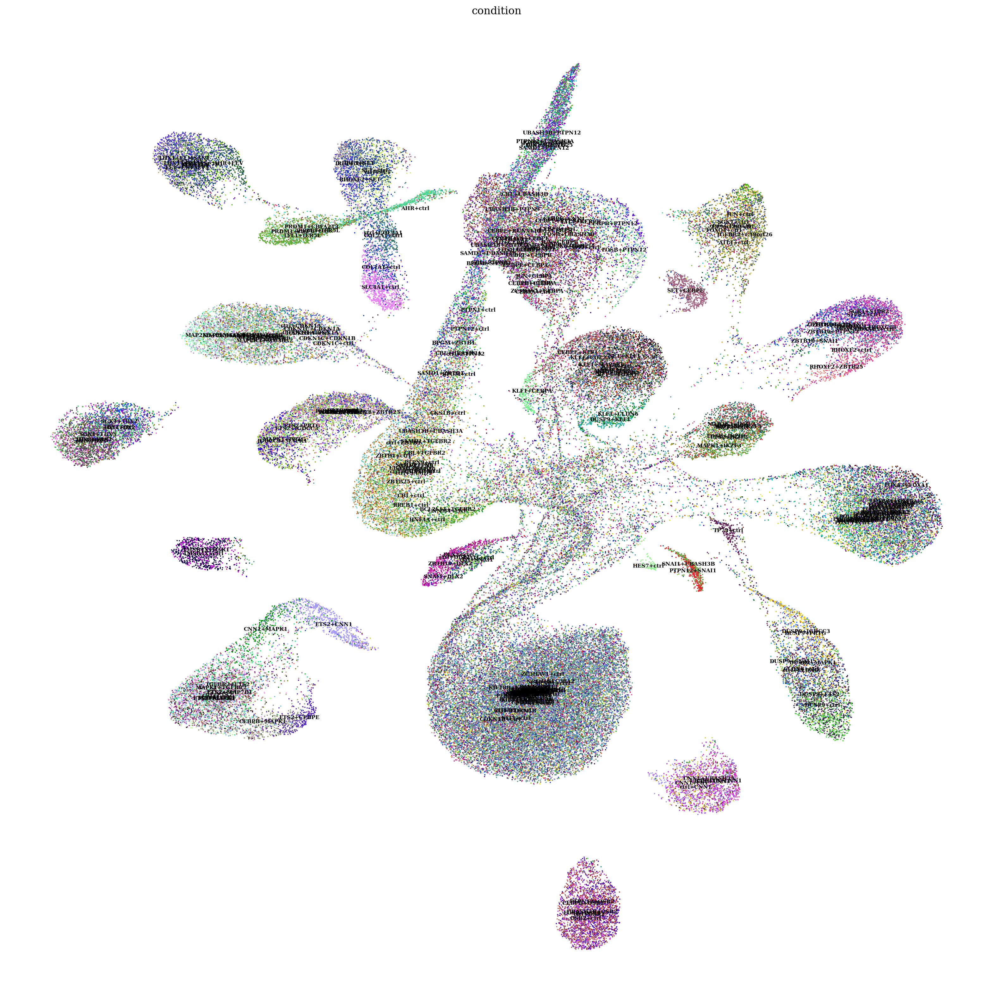

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

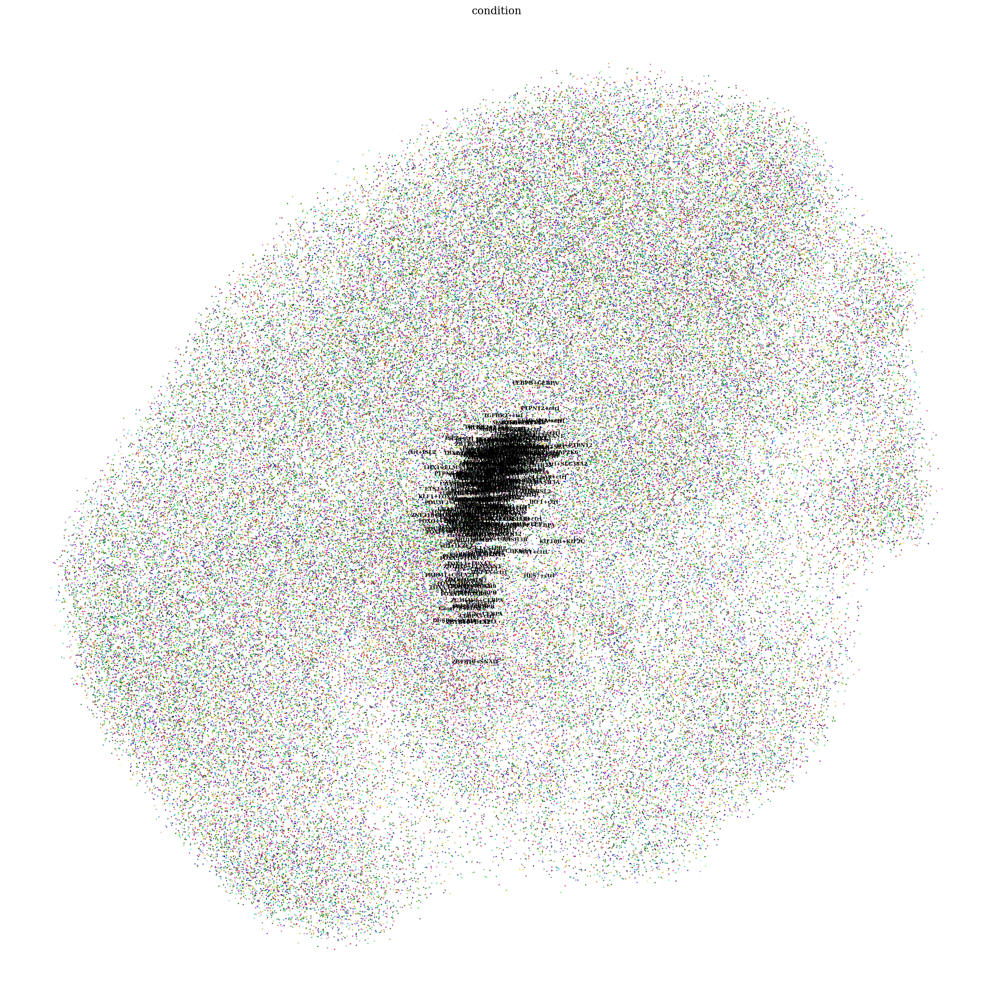

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()